#imp

In [ ]:
import pandas as pd
pd.set_option("max_colwidth", 160)
pd.set_option("display.max_columns", None)

import numpy as np
from sklearn import metrics

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")
plt.style.use("seaborn-talk")



def load_data(file_path, indx = True, indx_col = 0):
  '''Parameters:
  file_path: path to your excel or csv file with data,

  indx: boolean - whether there is index column in your file (usually it is the first column) --> *by default it is set to True
  
  indx_col: int - if your file has an index column, specify column number here --> *by default it is equal to 0 (first column)
  '''
  if indx == True and file_path.endswith(".xlsx"):
    data = pd.read_excel(file_path, index_col = indx_col)
  elif indx == False and file_path.endswith(".xlsx"):
    data = pd.read_excel(file_path)

  elif indx == True and file_path.endswith(".csv"):
    data = pd.read_csv(file_path, index_col = indx_col)
  elif indx == False and file_path.endswith(".csv"):
    data = pd.read_csv(file_path)
  return data


In [ ]:
from statistics import mean, stdev
from math import sqrt
from sklearn import metrics

def cohend(d1, d2):
 # calculate the size of samples
 n1, n2 = len(d1), len(d2)
 # calculate the variance of the samples
 s1, s2 = np.var(d1, ddof=1), np.var(d2, ddof=1)
 # calculate the pooled standard deviation
 s = np.sqrt(((n1 - 1) * s1 + (n2 - 1) * s2) / (n1 + n2 - 2))
 # calculate the means of the samples
 u1, u2 = np.mean(d1), np.mean(d2)
 # calculate the effect size
 return (u1 - u2) / s

In [ ]:
#!pip install scipy --upgrade
from scipy.stats import ttest_rel, ttest_ind

#load data

In [ ]:
import io
from google.colab import files

uploaded = files.upload()

Saving Zbiór_AMU_Barbara_Konat_v2_surowe_wyniki.xlsx to Zbiór_AMU_Barbara_Konat_v2_surowe_wyniki.xlsx


In [ ]:
!pip install pyreadstat

In [ ]:
df = pd.read_spss('/content/Zbiór_AMU_Barbara_Konat_v2.sav')
df.shape

(958, 42)

In [ ]:
import pyreadstat

df2, meta = pyreadstat.read_sav('/content/Zbiór_AMU_Barbara_Konat_v2.sav')

In [ ]:
meta

In [ ]:
type(meta)

pyreadstat._readstat_parser.metadata_container

In [ ]:
meta.column_names_to_labels

{'ID': 'Numer ankiety',
 'survey_finish_time': 'Czas trwania ankiety w sekundach',
 'sex': 'Jaka jest Twoja płeć?',
 'sex_r3_input': 'Jaka jest Twoja płeć? - Identyfikuję się w inny sposób, jak?',
 'sex2': 'W jakiej formie wolisz mieć zadawane pytania w tej ankiecie?',
 'age': 'W jakim jesteś wieku?',
 'year': 'Ile dokładnie masz lat?',
 'miasta': 'W jakiej miejscowości mieszkasz?',
 'wyksztalcenie': 'Jakie jest Twoje wykształcenie?',
 'narodowosc': 'Zaznacz swoją narodowość:',
 'grupa': 'Grupa',
 'p3': 'Czy zaprezentowany polityk jest Ci znany?',
 'p4_r1': 'W jakim stopniu zgadzasz się z poglądami {wylosowanego polityka}?',
 'p5_r1': 'Pomiar 1: Profesjonalna - Amatorska',
 'p5_r2': 'Pomiar 1: Otwarta na świat - Prowincjonalna',
 'p5_r3': 'Pomiar 1: Nieuczciwa - Uczciwa',
 'p5_r4': 'Pomiar 1: Wiarygodna - Niewiarygodna',
 'p5_r5': 'Pomiar 1: Skuteczna - Nieskuteczna',
 'p5_r6': 'Pomiar 1: Atrakcyjna - Nieatrakcyjna',
 'p5_r7': 'Pomiar 1: Niepoważna - Poważna',
 'p5_r8': 'Pomiar 1: Spok

In [ ]:
meta.variable_value_labels

{'sex': {1.0: 'Kobieta',
  2.0: 'Mężczyzna',
  3.0: 'Identyfikuję się w inny sposób (jak?)',
  4.0: 'Nie chcę odpowiadać'},
 'sex2': {1.0: 'Żeńskiej', 2.0: 'Męskiej', 99.0: 'uzasadniony brak danych'},
 'age': {1.0: '15-17 lat',
  2.0: '18-24 lata',
  3.0: '25-34 lata',
  4.0: '35-44 lata',
  5.0: '45-54 lata',
  6.0: '55 lat lub więcej'},
 'miasta': {1.0: 'wieś',
  2.0: 'małe miasto (do 20 tys. mieszkańców)',
  3.0: 'średnie miasto (od 20 do 99 tys. mieszkańców)',
  4.0: 'duże miasto (od 100 do 500 tys. mieszkańców)',
  5.0: 'wielkie miasto (powyżej 500 tys. mieszkańców)'},
 'wyksztalcenie': {1.0: 'Podstawowe',
  2.0: 'Zawodowe',
  3.0: 'Średnie (w tym: studiuję)',
  4.0: 'Wyższe'},
 'narodowosc': {1.0: 'polska', 2.0: 'ukraińska', 3.0: 'inna'},
 'grupa': {1.0: 'Krzysztof Bosak - negatywny',
  2.0: 'Krzysztof Bosak - neutralny',
  3.0: 'Krzysztof Bosak - pozytywny',
  4.0: 'Robert Biedroń - negatywny',
  5.0: 'Robert Biedroń - neutralny',
  6.0: 'Robert Biedroń - pozytywny',
  7.0: 'Raf

In [ ]:
print(meta.column_names_to_labels)


{'ID': 'Numer ankiety', 'survey_finish_time': 'Czas trwania ankiety w sekundach', 'sex': 'Jaka jest Twoja płeć?', 'sex_r3_input': 'Jaka jest Twoja płeć? - Identyfikuję się w inny sposób, jak?', 'sex2': 'W jakiej formie wolisz mieć zadawane pytania w tej ankiecie?', 'age': 'W jakim jesteś wieku?', 'year': 'Ile dokładnie masz lat?', 'miasta': 'W jakiej miejscowości mieszkasz?', 'wyksztalcenie': 'Jakie jest Twoje wykształcenie?', 'narodowosc': 'Zaznacz swoją narodowość:', 'grupa': 'Grupa', 'p3': 'Czy zaprezentowany polityk jest Ci znany?', 'p4_r1': 'W jakim stopniu zgadzasz się z poglądami {wylosowanego polityka}?', 'p5_r1': 'Pomiar 1: Profesjonalna - Amatorska', 'p5_r2': 'Pomiar 1: Otwarta na świat - Prowincjonalna', 'p5_r3': 'Pomiar 1: Nieuczciwa - Uczciwa', 'p5_r4': 'Pomiar 1: Wiarygodna - Niewiarygodna', 'p5_r5': 'Pomiar 1: Skuteczna - Nieskuteczna', 'p5_r6': 'Pomiar 1: Atrakcyjna - Nieatrakcyjna', 'p5_r7': 'Pomiar 1: Niepoważna - Poważna', 'p5_r8': 'Pomiar 1: Spokojna - Wybuchowa', '

In [ ]:
pd.DataFrame(meta.variable_value_labels, ).reset_index()#.to_excel('/content/drive/MyDrive/temp_ex2.xlsx') # index = [1,] 

In [ ]:
print(meta.variable_value_labels)


{'sex': {1.0: 'Kobieta', 2.0: 'Mężczyzna', 3.0: 'Identyfikuję się w inny sposób (jak?)', 4.0: 'Nie chcę odpowiadać'}, 'sex2': {1.0: 'Żeńskiej', 2.0: 'Męskiej', 99.0: 'uzasadniony brak danych'}, 'age': {1.0: '15-17 lat', 2.0: '18-24 lata', 3.0: '25-34 lata', 4.0: '35-44 lata', 5.0: '45-54 lata', 6.0: '55 lat lub więcej'}, 'miasta': {1.0: 'wieś', 2.0: 'małe miasto (do 20 tys. mieszkańców)', 3.0: 'średnie miasto (od 20 do 99 tys. mieszkańców)', 4.0: 'duże miasto (od 100 do 500 tys. mieszkańców)', 5.0: 'wielkie miasto (powyżej 500 tys. mieszkańców)'}, 'wyksztalcenie': {1.0: 'Podstawowe', 2.0: 'Zawodowe', 3.0: 'Średnie (w tym: studiuję)', 4.0: 'Wyższe'}, 'narodowosc': {1.0: 'polska', 2.0: 'ukraińska', 3.0: 'inna'}, 'grupa': {1.0: 'Krzysztof Bosak - negatywny', 2.0: 'Krzysztof Bosak - neutralny', 3.0: 'Krzysztof Bosak - pozytywny', 4.0: 'Robert Biedroń - negatywny', 5.0: 'Robert Biedroń - neutralny', 6.0: 'Robert Biedroń - pozytywny', 7.0: 'Rafał Trzaskowski - negatywny', 8.0: 'Rafał Trzasko

In [ ]:
pd.DataFrame(meta.column_names_to_labels, index = ['pytanie',] ).T.reset_index().rename(columns = {'index':'variable'})#.to_excel('/content/drive/MyDrive/temp_ex2.xlsx')

,variable,pytanie
0,ID,Numer ankiety
1,survey_finish_time,Czas trwania ankiety w sekundach
2,sex,Jaka jest Twoja płeć?
3,sex_r3_input,"Jaka jest Twoja płeć? - Identyfikuję się w inny sposób, jak?"
4,sex2,W jakiej formie wolisz mieć zadawane pytania w tej ankiecie?
5,age,W jakim jesteś wieku?
6,year,Ile dokładnie masz lat?
7,miasta,W jakiej miejscowości mieszkasz?
8,wyksztalcenie,Jakie jest Twoje wykształcenie?
9,narodowosc,Zaznacz swoją narodowość:


In [ ]:
df2.to_excel('Zbiór_AMU_Barbara_Konat_v2_surowe_wyniki.xlsx')

In [ ]:
df.to_excel('Zbiór_AMU_Barbara_Konat_v2_surowe_wyniki_zmapowane.xlsx')

In [ ]:
df # pandas

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 958 entries, 0 to 957
Data columns (total 42 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  958 non-null    float64
 1   survey_finish_time  958 non-null    float64
 2   sex                 958 non-null    float64
 3   sex_r3_input        958 non-null    object 
 4   sex2                1 non-null      float64
 5   age                 958 non-null    float64
 6   year                958 non-null    float64
 7   miasta              958 non-null    float64
 8   wyksztalcenie       958 non-null    float64
 9   narodowosc          958 non-null    float64
 10  grupa               958 non-null    float64
 11  p3                  958 non-null    float64
 12  p4_r1               946 non-null    float64
 13  p5_r1               958 non-null    float64
 14  p5_r2               958 non-null    float64
 15  p5_r3               958 non-null    float64
 16  p5_r4   

In [ ]:
df2.head()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
0,1.0,532.0,1.0,,NaN,6.0,70.0,2.0,3.0,1.0,3.0,1.0,4.0,1.0,3.0,6.0,2.0,2.0,4.0,7.0,3.0,5.0,1.0,7.0,2.0,2.0,3.0,2.0,2.0,3.0,6.0,2.0,2.0,4.0,7.0,3.0,6.0,1.0,7.0,2.0,2.0,2.0
1,2.0,565.0,2.0,,NaN,6.0,62.0,4.0,3.0,1.0,3.0,1.0,3.0,4.0,3.0,4.0,4.0,4.0,5.0,4.0,4.0,5.0,6.0,4.0,3.0,2.0,4.0,2.0,7.0,7.0,1.0,7.0,4.0,6.0,1.0,4.0,4.0,4.0,4.0,4.0,7.0,2.0
2,3.0,444.0,1.0,,NaN,6.0,68.0,4.0,3.0,1.0,7.0,1.0,1.0,5.0,3.0,2.0,7.0,7.0,6.0,4.0,5.0,2.0,3.0,6.0,5.0,4.0,6.0,2.0,5.0,4.0,5.0,3.0,5.0,4.0,5.0,6.0,3.0,5.0,6.0,5.0,5.0,6.0
3,4.0,2558.0,2.0,,NaN,6.0,61.0,1.0,3.0,1.0,8.0,1.0,5.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0,2.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0
4,5.0,412.0,2.0,,NaN,3.0,30.0,3.0,2.0,1.0,8.0,1.0,4.0,4.0,4.0,5.0,5.0,5.0,5.0,4.0,4.0,5.0,5.0,4.0,4.0,5.0,5.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0


In [ ]:
df2.columns

Index(['ID', 'survey_finish_time', 'sex', 'sex_r3_input', 'sex2', 'age',
       'year', 'miasta', 'wyksztalcenie', 'narodowosc', 'grupa', 'p3', 'p4_r1',
       'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7', 'p5_r8',
       'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14', 'p7',
       'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14'],
      dtype='object')

In [ ]:
ko = df2[df2.sex == 1]
ko

In [ ]:
df2[ (df2.p3 != 2) & (df2.p4_r1.isna()) ]

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
26,27.0,438.0,1.0,,NaN,5.0,47.0,2.0,4.0,1.0,3.0,1.0,NaN,3.0,3.0,4.0,3.0,4.0,3.0,5.0,2.0,5.0,2.0,5.0,4.0,3.0,2.0,2.0,3.0,3.0,5.0,3.0,4.0,3.0,5.0,2.0,6.0,2.0,5.0,2.0,2.0,3.0
287,288.0,583.0,1.0,,NaN,6.0,83.0,5.0,3.0,1.0,1.0,1.0,NaN,5.0,7.0,1.0,7.0,4.0,7.0,4.0,3.0,4.0,4.0,3.0,3.0,1.0,4.0,2.0,5.0,7.0,3.0,6.0,5.0,7.0,2.0,4.0,1.0,3.0,5.0,4.0,3.0,7.0
357,358.0,625.0,2.0,,NaN,6.0,69.0,2.0,3.0,1.0,1.0,1.0,NaN,6.0,4.0,1.0,7.0,6.0,7.0,2.0,4.0,2.0,6.0,4.0,4.0,7.0,7.0,2.0,6.0,5.0,2.0,7.0,6.0,7.0,1.0,6.0,1.0,6.0,6.0,6.0,6.0,7.0


In [ ]:
df2[ (df2.p3 == 2) & ~(df2.p4_r1.isna()) ]

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
10,11.0,473.0,2.0,,NaN,4.0,44.0,1.0,1.0,1.0,4.0,2.0,3.0,4.0,4.0,1.0,7.0,7.0,4.0,2.0,7.0,2.0,3.0,3.0,1.0,4.0,5.0,1.0,5.0,5.0,2.0,6.0,4.0,4.0,4.0,7.0,2.0,3.0,7.0,2.0,4.0,5.0
16,17.0,9007.0,1.0,,NaN,4.0,36.0,4.0,4.0,1.0,3.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,6.0,4.0,2.0,1.0,1.0,1.0,7.0,7.0,7.0,1.0,1.0,7.0,7.0,7.0,1.0,1.0,1.0
19,20.0,405.0,2.0,,NaN,3.0,32.0,4.0,3.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
33,34.0,872.0,1.0,,NaN,4.0,44.0,4.0,3.0,1.0,2.0,2.0,3.0,3.0,3.0,6.0,2.0,3.0,3.0,5.0,3.0,5.0,3.0,5.0,5.0,3.0,3.0,2.0,3.0,3.0,5.0,3.0,3.0,3.0,5.0,3.0,5.0,3.0,5.0,4.0,2.0,3.0
39,40.0,449.0,2.0,,NaN,4.0,39.0,3.0,4.0,1.0,3.0,2.0,3.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,5.0,4.0,4.0,3.0,4.0,3.0,5.0,5.0,5.0,3.0,4.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
898,899.0,351.0,2.0,,NaN,2.0,23.0,1.0,3.0,1.0,4.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0
914,915.0,738.0,2.0,,NaN,6.0,75.0,3.0,4.0,1.0,6.0,2.0,1.0,7.0,7.0,1.0,7.0,7.0,7.0,1.0,7.0,1.0,7.0,1.0,7.0,7.0,7.0,2.0,7.0,7.0,1.0,7.0,7.0,7.0,1.0,7.0,1.0,7.0,1.0,7.0,7.0,7.0
930,931.0,426.0,1.0,,NaN,5.0,51.0,2.0,2.0,1.0,3.0,2.0,4.0,3.0,3.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,4.0,3.0,4.0,1.0,5.0,5.0,6.0,5.0,4.0,4.0,1.0,3.0,6.0,5.0,5.0,5.0,5.0,4.0
936,937.0,430.0,1.0,,NaN,4.0,36.0,1.0,2.0,1.0,2.0,2.0,4.0,4.0,5.0,2.0,4.0,3.0,4.0,3.0,5.0,3.0,3.0,4.0,4.0,4.0,2.0,2.0,4.0,4.0,5.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,5.0,5.0,3.0


In [ ]:
df2grupa = df2.groupby(['grupa'], as_index=False)[dyfer].mean().round(2)
df2grupa

,grupa,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
0,1.0,4.16,4.26,3.77,4.50,4.34,4.43,3.87,3.85,3.77,4.19,4.39,3.20,4.10,4.20,4.38,4.84,3.51,4.54,4.50,4.57,3.51,4.44,3.12,4.35,4.18,3.84,4.07,4.83
1,2.0,3.97,4.45,3.68,4.43,4.18,4.54,3.81,3.76,3.59,3.96,4.53,2.79,3.64,4.15,3.92,4.38,3.84,4.25,3.94,4.25,3.94,3.82,3.82,3.84,4.55,3.04,3.82,4.31
2,3.0,4.22,4.72,3.74,4.47,4.38,4.51,3.90,3.77,3.86,4.09,4.49,3.25,4.12,4.12,4.01,4.08,3.79,4.25,4.23,4.32,3.94,3.68,4.05,3.96,4.23,3.05,3.94,3.85
3,4.0,4.05,3.21,4.04,4.32,4.33,4.26,3.86,3.60,4.38,3.98,4.14,4.95,4.63,3.76,4.16,3.92,3.61,4.43,4.37,4.54,3.48,4.30,3.49,4.24,4.38,5.01,4.53,4.33
4,5.0,3.47,2.86,4.35,3.69,3.81,3.75,4.21,3.39,4.58,3.75,4.59,5.05,4.51,3.13,3.43,2.90,4.41,3.64,3.80,3.70,4.21,3.13,4.79,3.64,4.65,4.86,4.42,3.20
5,6.0,3.93,3.44,4.29,3.86,4.15,4.07,4.19,3.64,4.43,4.02,4.55,4.71,4.44,3.50,3.53,3.10,4.52,3.63,3.87,3.78,4.46,3.17,4.73,3.73,4.60,4.44,4.15,3.29
6,7.0,3.52,3.06,4.46,3.69,3.68,3.59,4.82,3.47,4.49,3.56,4.71,4.25,4.15,3.50,3.44,3.40,4.47,3.51,3.62,3.53,4.73,3.70,4.14,3.49,4.61,4.12,3.90,3.69
7,8.0,3.31,2.87,4.32,3.62,3.48,3.62,4.61,3.50,4.24,3.38,4.73,4.25,3.95,3.65,3.19,3.02,4.40,3.56,3.47,3.40,4.60,3.44,4.45,3.40,4.75,4.07,3.98,3.38
8,9.0,3.25,3.10,4.34,3.55,3.62,3.42,4.42,3.57,4.46,3.41,4.70,4.19,3.98,3.61,3.06,2.87,4.69,3.37,3.25,3.26,4.72,3.43,4.64,3.17,5.02,3.88,4.05,3.21


In [ ]:
df2grupa.columns

Index(['grupa', 'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7',
       'p5_r8', 'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14',
       'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14'],
      dtype='object')

In [ ]:
c1 = ['p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7',
       'p5_r8', 'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14']
c2 = ['p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14']       
list(zip(c1, c2))

[('p5_r1', 'p9_r1'),
 ('p5_r2', 'p9_r2'),
 ('p5_r3', 'p9_r3'),
 ('p5_r4', 'p9_r4'),
 ('p5_r5', 'p9_r5'),
 ('p5_r6', 'p9_r6'),
 ('p5_r7', 'p9_r7'),
 ('p5_r8', 'p9_r8'),
 ('p5_r9', 'p9_r9'),
 ('p5_r10', 'p9_r10'),
 ('p5_r11', 'p9_r11'),
 ('p5_r12', 'p9_r12'),
 ('p5_r13', 'p9_r13'),
 ('p5_r14', 'p9_r14')]

In [ ]:
cc = [('p5_r1', 'p9_r1'),
      ('p5_r2', 'p9_r2'),
      ('p5_r3', 'p9_r3'),
      ('p5_r4', 'p9_r4'),
      ('p5_r5', 'p9_r5'),
      ('p5_r6', 'p9_r6'),
      ('p5_r7', 'p9_r7'),
      ('p5_r8', 'p9_r8'),
      ('p5_r9', 'p9_r9'),
      ('p5_r10', 'p9_r10'),
      ('p5_r11', 'p9_r11'),
      ('p5_r12', 'p9_r12'),
      ('p5_r13', 'p9_r13'),
      ('p5_r14', 'p9_r14')]

In [ ]:
cc[0][0][-3:]

'_r1'

In [ ]:
for c in cc:
  df2grupa['diff'+c[0][-3:]] = df2grupa[c[-1]] = df2grupa[c[0]]

df2grupa

,grupa,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,diff_r1,diff_r2,diff_r3,diff_r4,diff_r5,diff_r6,diff_r7,diff_r8,diff_r9,diffr10,diffr11,diffr12,diffr13,diffr14
0,1.0,4.16,4.26,3.77,4.50,4.34,4.43,3.87,3.85,3.77,4.19,4.39,3.20,4.10,4.20,4.16,4.26,3.77,4.50,4.34,4.43,3.87,3.85,3.77,4.19,4.39,3.20,4.10,4.20,4.16,4.26,3.77,4.50,4.34,4.43,3.87,3.85,3.77,4.19,4.39,3.20,4.10,4.20
1,2.0,3.97,4.45,3.68,4.43,4.18,4.54,3.81,3.76,3.59,3.96,4.53,2.79,3.64,4.15,3.97,4.45,3.68,4.43,4.18,4.54,3.81,3.76,3.59,3.96,4.53,2.79,3.64,4.15,3.97,4.45,3.68,4.43,4.18,4.54,3.81,3.76,3.59,3.96,4.53,2.79,3.64,4.15
2,3.0,4.22,4.72,3.74,4.47,4.38,4.51,3.90,3.77,3.86,4.09,4.49,3.25,4.12,4.12,4.22,4.72,3.74,4.47,4.38,4.51,3.90,3.77,3.86,4.09,4.49,3.25,4.12,4.12,4.22,4.72,3.74,4.47,4.38,4.51,3.90,3.77,3.86,4.09,4.49,3.25,4.12,4.12
3,4.0,4.05,3.21,4.04,4.32,4.33,4.26,3.86,3.60,4.38,3.98,4.14,4.95,4.63,3.76,4.05,3.21,4.04,4.32,4.33,4.26,3.86,3.60,4.38,3.98,4.14,4.95,4.63,3.76,4.05,3.21,4.04,4.32,4.33,4.26,3.86,3.60,4.38,3.98,4.14,4.95,4.63,3.76
4,5.0,3.47,2.86,4.35,3.69,3.81,3.75,4.21,3.39,4.58,3.75,4.59,5.05,4.51,3.13,3.47,2.86,4.35,3.69,3.81,3.75,4.21,3.39,4.58,3.75,4.59,5.05,4.51,3.13,3.47,2.86,4.35,3.69,3.81,3.75,4.21,3.39,4.58,3.75,4.59,5.05,4.51,3.13
5,6.0,3.93,3.44,4.29,3.86,4.15,4.07,4.19,3.64,4.43,4.02,4.55,4.71,4.44,3.50,3.93,3.44,4.29,3.86,4.15,4.07,4.19,3.64,4.43,4.02,4.55,4.71,4.44,3.50,3.93,3.44,4.29,3.86,4.15,4.07,4.19,3.64,4.43,4.02,4.55,4.71,4.44,3.50
6,7.0,3.52,3.06,4.46,3.69,3.68,3.59,4.82,3.47,4.49,3.56,4.71,4.25,4.15,3.50,3.52,3.06,4.46,3.69,3.68,3.59,4.82,3.47,4.49,3.56,4.71,4.25,4.15,3.50,3.52,3.06,4.46,3.69,3.68,3.59,4.82,3.47,4.49,3.56,4.71,4.25,4.15,3.50
7,8.0,3.31,2.87,4.32,3.62,3.48,3.62,4.61,3.50,4.24,3.38,4.73,4.25,3.95,3.65,3.31,2.87,4.32,3.62,3.48,3.62,4.61,3.50,4.24,3.38,4.73,4.25,3.95,3.65,3.31,2.87,4.32,3.62,3.48,3.62,4.61,3.50,4.24,3.38,4.73,4.25,3.95,3.65
8,9.0,3.25,3.10,4.34,3.55,3.62,3.42,4.42,3.57,4.46,3.41,4.70,4.19,3.98,3.61,3.25,3.10,4.34,3.55,3.62,3.42,4.42,3.57,4.46,3.41,4.70,4.19,3.98,3.61,3.25,3.10,4.34,3.55,3.62,3.42,4.42,3.57,4.46,3.41,4.70,4.19,3.98,3.61


In [ ]:
df2grupa.filter(regex= 'p9_').columns

Index(['p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14'],
      dtype='object')

In [ ]:
cols4 = ['grupa', 
         'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14'
         ]

df2grupa_mpo = df2grupa[cols4].melt('grupa')
df2grupa_mpo['time'] = 'po'
df2grupa_mpo.head(2)         

,grupa,variable,value,time
0,1.0,p9_r1,4.38,po
1,2.0,p9_r1,3.92,po


In [ ]:
cols4 = ['grupa', 
         'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7', 'p5_r8',
       'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14'
         ]

df2grupa_mprzed = df2grupa[cols4].melt('grupa')
df2grupa_mprzed['time'] = 'przed'
df2grupa_mprzed.head(2)         

,grupa,variable,value,time
0,1.0,p5_r1,4.16,przed
1,2.0,p5_r1,3.97,przed


In [ ]:
df2grupa_m = pd.concat([df2grupa_mprzed, df2grupa_mpo], axis = 0, ignore_index = True)
df2grupa_m.sample(3)

,grupa,variable,value,time
157,5.0,p9_r4,3.64,po
34,8.0,p5_r4,3.62,przed
123,7.0,p5_r14,3.50,przed


In [ ]:
cols4 = ['grupa', 'diff_r1', 'diff_r2', 'diff_r3', 'diff_r4', 'diff_r5', 'diff_r6',
       'diff_r7', 'diff_r8', 'diff_r9', 'diffr10', 'diffr11', 'diffr12',
       'diffr13', 'diffr14']

In [ ]:
df2grupa_m = df2grupa[cols4].melt('grupa')
df2grupa_m.head(2)

,grupa,variable,value
0,1.0,diff_r1,4.16
1,2.0,diff_r1,3.97


In [ ]:
df2grupa_m['kind'] = df2grupa_m.grupa.map({1:'neg',2:'neu',3:'pos',4:'neg',5:'neu',6:'pos',7:'neg',8:'neu',9:'pos'})

In [ ]:
df2grupa_m['item'] = df2grupa_m.variable.str.replace('p5_', '').str.replace('p9_', '')

In [ ]:
df2grupa_m['polityk'] = df2grupa_m.grupa.map({1:'KB',2:'KB',3:'KB',4:'RB',5:'RB',6:'RB',7:'RT',8:'RT',9:'RT'})

In [ ]:
df2grupa_m['tweet'] = df2grupa_m['polityk'] + " " + df2grupa_m['kind']

In [ ]:
df2grupa_m['tweet2'] = df2grupa_m['tweet'] + " " + df2grupa_m['time']

In [ ]:
df2grupa_m.item.unique()

array(['r1', 'r2', 'r3', 'r4', 'r5', 'r6', 'r7', 'r8', 'r9', 'r10', 'r11',
       'r12', 'r13', 'r14'], dtype=object)

In [ ]:
item_map = {
    'r1': 'Amatorska', 'r2': 'Prowincjonalna', 'r3': 'Uczciwa', 'r4': 'Niewiarygodna', 
    'r5': 'Nieskuteczna', 'r6': 'Nieatrakcyjna', 'r7': 'Poważna', 'r8': 'Wybuchowa', 
    'r9': 'Łagodna', 'r10': 'Słaba', 'r11': 'Aktywna',
       'r12': 'Niewierząca', 'r13': 'Niekonwencjonalna', 'r14': 'Wroga'
}

In [ ]:
df2grupa_m.item = df2grupa_m.item.map(item_map)

In [ ]:
df2grupa_m.tail()

,grupa,variable,value,time,kind,item,polityk,tweet,tweet2
247,5.0,p9_r14,3.20,po,neu,Wroga,RB,RB neu,RB neu po
248,6.0,p9_r14,3.29,po,pos,Wroga,RB,RB pos,RB pos po
249,7.0,p9_r14,3.69,po,neg,Wroga,RT,RT neg,RT neg po
250,8.0,p9_r14,3.38,po,neu,Wroga,RT,RT neu,RT neu po
251,9.0,p9_r14,3.21,po,pos,Wroga,RT,RT pos,RT pos po


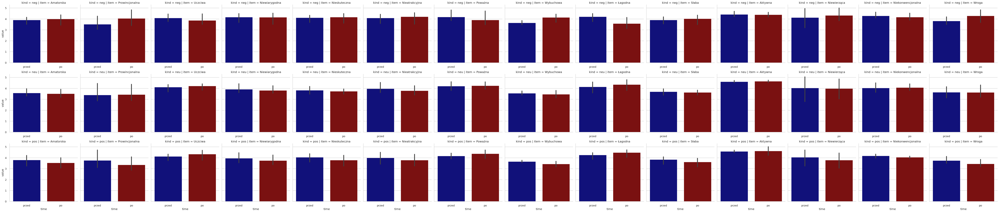

In [ ]:
sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
            row = 'kind', dodge=False, sharex=False, x = 'time', hue = 'time',
            palette = {'przed':'darkblue', 'po':'darkred'}) # palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 
plt.tight_layout()
plt.show()

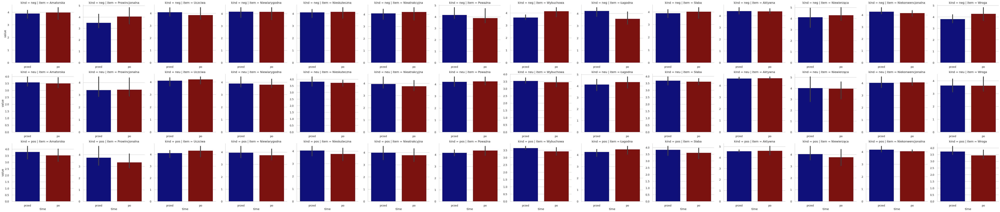

In [ ]:
sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
            row = 'kind', dodge=False, sharex=False, sharey=False, x = 'time', hue = 'time',
            palette = {'przed':'darkblue', 'po':'darkred'}) # palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 
plt.tight_layout()
plt.show()

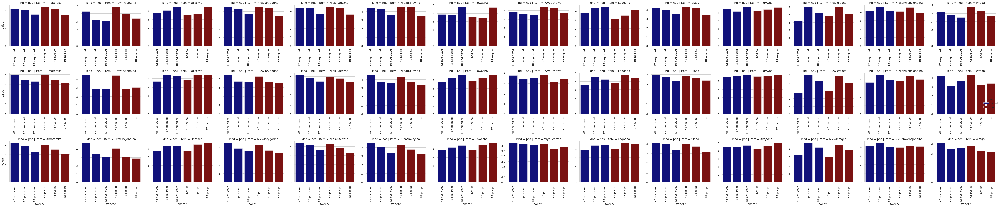

In [ ]:
g = sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
             dodge=False, sharex=False, sharey=False, x = 'tweet2', hue = 'time', row = 'kind',
            palette = {'przed':'darkblue', 'po':'darkred'}) # palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 

g.set_xticklabels(rotation=90)


plt.tight_layout(pad = 1.5)
plt.show()

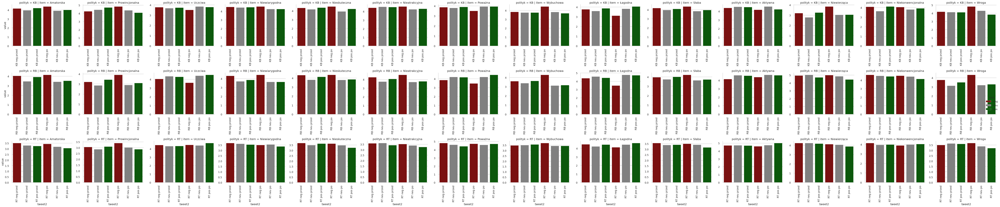

In [ ]:
g = sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
             dodge=False, sharex=False, sharey=False, x = 'tweet2', hue = 'kind', row = 'polityk',
            palette = {'neg':'darkred', 'neu':'grey', "pos":'darkgreen'}) # palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 

g.set_xticklabels(rotation=90)
g.set_xlabel('tweet')


plt.tight_layout(pad = 1.5)
plt.show()

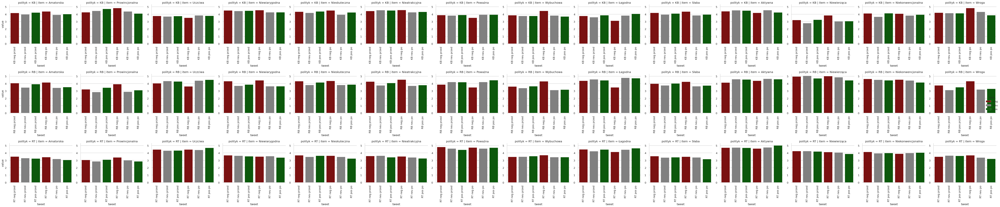

In [ ]:
g = sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
             dodge=False, sharex=False, x = 'tweet2', hue = 'kind', row = 'polityk',
            palette = {'neg':'darkred', 'neu':'grey', "pos":'darkgreen'}) 
# palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 

g.set(xlabel = 'tweet')
g.set_xticklabels(rotation=90)

for ax in g.axes.flatten():
    ax.tick_params(labelleft=True) 
    # https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.tick_params.html#matplotlib.axes.Axes.tick_params


plt.tight_layout(pad = 1.5)
plt.show()

In [ ]:
sns.catplot(kind = 'bar', data = df2grupa_m, col = 'item', y = 'value', 
            row = 'tweet', dodge=False, sharex=False, sharey=False, x = 'time', hue = 'time',
            palette = {'przed':'darkblue', 'po':'darkred'}) # palette = {'neg':'red', 'neu':'grey', "pos":'green'}, col_wrap = 4, 
plt.tight_layout()
plt.show()

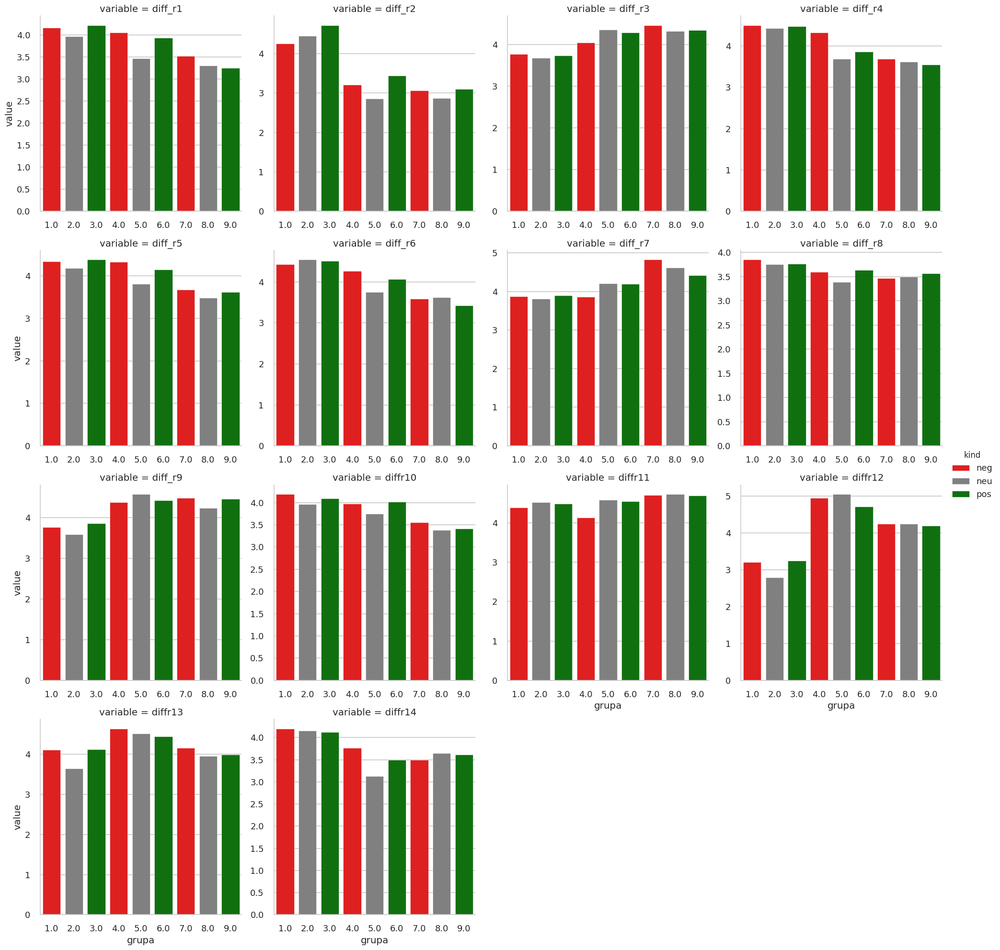

In [ ]:
sns.catplot(kind = 'bar', data =df2grupa_m, col = 'variable', y = 'value', 
            x = 'grupa', col_wrap = 4, dodge=False, sharex=False, sharey=False, hue = 'kind', 
            palette = {'neg':'red', 'neu':'grey', "pos":'green'})# hue = 'grupa'
plt.show()

##reliability test 

In [ ]:
df2.p3.fillna(99).value_counts()

1.0    865
2.0     93
Name: p3, dtype: int64

In [ ]:
df2.p4_r1.fillna(99).value_counts()

3.0     310
1.0     215
4.0     179
2.0     147
5.0      95
99.0     12
Name: p4_r1, dtype: int64

In [ ]:
dyfer = [
    'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7', 'p5_r8',
       'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14',
       'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14']

In [ ]:
df2['variance'] = df2[dyfer].var(axis = 1)
df2['variance'].describe([0.05, 0.075, 0.1, 0.25, 0.5])

count    958.000000
mean       2.845191
std        2.475471
min        0.000000
5%         0.000000
7.5%       0.035714
10%        0.166931
25%        0.714616
50%        2.179894
max        9.333333
Name: variance, dtype: float64

In [ ]:
df2[df2.variance.round(1) < 0.17].shape

(94, 43)

In [ ]:
df2[df2.variance.round(1) < 0.17].sample(5)

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
587,588.0,405.0,2.0,,NaN,6.0,59.0,4.0,3.0,1.0,1.0,1.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
582,583.0,427.0,1.0,,NaN,4.0,37.0,2.0,4.0,1.0,6.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
421,422.0,480.0,2.0,,NaN,2.0,24.0,3.0,3.0,1.0,3.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
598,599.0,431.0,2.0,,NaN,5.0,48.0,1.0,2.0,1.0,3.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
591,592.0,391.0,1.0,,NaN,4.0,37.0,1.0,3.0,1.0,1.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.035714


In [ ]:
df2[df2.variance.round(1) < 0.04].shape

(77, 43)

In [ ]:
df2[df2.variance.round(1) == 0].shape

(77, 43)

In [ ]:
sus = df2[df2.variance.round(1) == 0]
sus

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
19,20.0,405.0,2.0,,NaN,3.0,32.0,4.0,3.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
24,25.0,796.0,2.0,,NaN,4.0,39.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
68,69.0,1516.0,1.0,,NaN,6.0,61.0,1.0,4.0,1.0,7.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
85,86.0,428.0,1.0,,NaN,3.0,34.0,1.0,3.0,1.0,3.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,0.035714
101,102.0,616.0,1.0,,NaN,5.0,51.0,4.0,3.0,1.0,2.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
883,884.0,417.0,2.0,,NaN,4.0,38.0,4.0,3.0,1.0,1.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
891,892.0,515.0,1.0,,NaN,2.0,22.0,3.0,4.0,1.0,5.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
898,899.0,351.0,2.0,,NaN,2.0,23.0,1.0,3.0,1.0,4.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
901,902.0,367.0,1.0,,NaN,5.0,51.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000


In [ ]:
cols = ['sex', 'age', 'miasta', 'wyksztalcenie', 'p4_r1', 'p5_r1','p5_r2','p5_r3','p5_r4','p5_r5','p5_r6','p5_r7','p5_r8','p5_r9',
 'p5_r10','p5_r11','p5_r12','p5_r13','p5_r14','p9_r1','p9_r2','p9_r3','p9_r4','p9_r5',
 'p9_r6','p9_r7','p9_r8','p9_r9','p9_r10','p9_r11','p9_r12','p9_r13','p9_r14']

In [ ]:
sus_g1 = sus.groupby(cols, as_index=False).size().sort_values(by = 'size', ascending=False)
sus_g1

,sex,age,miasta,wyksztalcenie,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,size
31,2.0,2.0,1.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3
13,1.0,4.0,2.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
41,2.0,3.0,2.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
22,1.0,6.0,1.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
44,2.0,3.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27,1.0,6.0,3.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1
28,1.0,6.0,3.0,3.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1
29,1.0,6.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1
30,1.0,6.0,5.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1


In [ ]:
sus_g1[sus_g1['size']>1]

,sex,age,miasta,wyksztalcenie,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,size
31,2.0,2.0,1.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3
13,1.0,4.0,2.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
41,2.0,3.0,2.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
22,1.0,6.0,1.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
44,2.0,3.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
47,2.0,4.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
34,2.0,2.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
2,1.0,2.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2
60,2.0,6.0,1.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2


In [ ]:
77*100/958

8.037578288100208

In [ ]:
cols2 = ['ID', 'p5_r1','p5_r2','p5_r3','p5_r4','p5_r5','p5_r6','p5_r7','p5_r8','p5_r9',
 'p5_r10','p5_r11','p5_r12','p5_r13','p5_r14','p9_r1','p9_r2','p9_r3','p9_r4','p9_r5',
 'p9_r6','p9_r7','p9_r8','p9_r9','p9_r10','p9_r11','p9_r12','p9_r13','p9_r14']

In [ ]:
df2.sample()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
628,629.0,407.0,1.0,,NaN,6.0,56.0,4.0,3.0,1.0,3.0,2.0,1.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.328042


In [ ]:
dyfer_dict_abs = {}

In [ ]:
for p in dyfer:
  df2p = pd.DataFrame( abs(df2[p].values - df2[p].values[:, None]) )
  dyfer_dict_abs[p] = df2p.reset_index()

In [ ]:
df2p_all = pd.concat(dyfer_dict_abs.values(), axis = 0, ignore_index=True)
df2p_all

index    0    1    2    3    4    5    6    7    8    9   10   11   12  \
0          0  0.0  3.0  4.0  0.0  3.0  1.0  5.0  1.0  5.0  3.0  3.0  0.0  3.0   
1          1  3.0  0.0  1.0  3.0  0.0  2.0  2.0  2.0  2.0  0.0  0.0  3.0  0.0   
2          2  4.0  1.0  0.0  4.0  1.0  3.0  1.0  3.0  1.0  1.0  1.0  4.0  1.0   
3          3  0.0  3.0  4.0  0.0  3.0  1.0  5.0  1.0  5.0  3.0  3.0  0.0  3.0   
4          4  3.0  0.0  1.0  3.0  0.0  2.0  2.0  2.0  2.0  0.0  0.0  3.0  0.0   
...      ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819    953  3.0  3.0  1.0  4.0  1.0  4.0  2.0  4.0  4.0  1.0  0.0  4.0  2.0   
26820    954  2.0  2.0  2.0  3.0  0.0  3.0  3.0  3.0  3.0  2.0  1.0  3.0  1.0   
26821    955  3.0  3.0  1.0  4.0  1.0  4.0  2.0  4.0  4.0  1.0  0.0  4.0  2.0   
26822    956  0.0  0.0  4.0  1.0  2.0  1.0  5.0  1.0  1.0  4.0  3.0  1.0  1.0   
26823    957  2.0  2.0  2.0  3.0  0.0  3.0  3.0  3.0  3.0  2.0  1.0  3.0  1.0   

        13   14   15   16   17   18   19   20   21   22   23   24   25   26  \
0      2.0  6.0  5.0  3.0  6.0  1.0  3.0  1.0  0.0  2.0  4.0  3.0  3.0  2.0   
1      1.0  3.0  2.0  0.0  3.0  2.0  0.0  2.0  3.0  1.0  1.0  0.0  0.0  1.0   
2      2.0  2.0  1.0  1.0  2.0  3.0  1.0  3.0  4.0  2.0  0.0  1.0  1.0  2.0   
3      2.0  6.0  5.0  3.0  6.0  1.0  3.0  1.0  0.0  2.0  4.0  3.0  3.0  2.0   
4      1.0  3.0  2.0  0.0  3.0  2.0  0.0  2.0  3.0  1.0  1.0  0.0  0.0  1.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  2.0  2.0  3.0  4.0  0.0  3.0  1.0  1.0  4.0  0.0  2.0  1.0  4.0  2.0   
26820  1.0  3.0  2.0  3.0  1.0  2.0  0.0  0.0  3.0  1.0  3.0  0.0  3.0  1.0   
26821  2.0  2.0  3.0  4.0  0.0  3.0  1.0  1.0  4.0  0.0  2.0  1.0  4.0  2.0   
26822  1.0  5.0  0.0  1.0  3.0  0.0  2.0  2.0  1.0  3.0  5.0  2.0  1.0  1.0   
26823  1.0  3.0  2.0  3.0  1.0  2.0  0.0  0.0  3.0  1.0  3.0  0.0  3.0  1.0   

        27   28   29   30   31   32   33   34   35   36   37   38   39   40  \
0      1.0  6.0  2.0  3.0  6.0  2.0  2.0  3.0  1.0  6.0  5.0  3.0  3.0  5.0   
1      2.0  3.0  1.0  0.0  3.0  1.0  1.0  0.0  2.0  3.0  2.0  0.0  0.0  2.0   
2      3.0  2.0  2.0  1.0  2.0  2.0  2.0  1.0  3.0  2.0  1.0  1.0  1.0  1.0   
3      1.0  6.0  2.0  3.0  6.0  2.0  2.0  3.0  1.0  6.0  5.0  3.0  3.0  5.0   
4      2.0  3.0  1.0  0.0  3.0  1.0  1.0  0.0  2.0  3.0  2.0  0.0  0.0  2.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  2.0  2.0  0.0  2.0  2.0  1.0  2.0  2.0  2.0  2.0  1.0  1.0  2.0  2.0   
26820  1.0  3.0  1.0  1.0  3.0  0.0  1.0  1.0  1.0  3.0  0.0  0.0  1.0  3.0   
26821  2.0  2.0  0.0  2.0  2.0  1.0  2.0  2.0  2.0  2.0  1.0  1.0  2.0  2.0   
26822  1.0  5.0  3.0  1.0  5.0  2.0  1.0  1.0  1.0  5.0  2.0  2.0  1.0  5.0   
26823  1.0  3.0  1.0  1.0  3.0  0.0  1.0  1.0  1.0  3.0  0.0  0.0  1.0  3.0   

        41   42   43   44   45   46   47   48   49   50   51   52   53   54  \
0      4.0  2.0  2.0  0.0  2.0  0.0  3.0  3.0  3.0  5.0  3.0  3.0  1.0  3.0   
1      1.0  1.0  1.0  3.0  1.0  3.0  0.0  0.0  0.0  2.0  0.0  0.0  2.0  0.0   
2      0.0  2.0  2.0  4.0  2.0  4.0  1.0  1.0  1.0  1.0  1.0  1.0  3.0  1.0   
3      4.0  2.0  2.0  0.0  2.0  0.0  3.0  3.0  3.0  5.0  3.0  3.0  1.0  3.0   
4      1.0  1.0  1.0  3.0  1.0  3.0  0.0  0.0  0.0  2.0  0.0  0.0  2.0  0.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  1.0  3.0  1.0  3.0  3.0  4.0  0.0  1.0  1.0  1.0  2.0  1.0  3.0  1.0   
26820  2.0  2.0  0.0  2.0  2.0  3.0  1.0  0.0  0.0  2.0  1.0  0.0  2.0  2.0   
26821  1.0  3.0  1.0  3.0  3.0  4.0  0.0  1.0  1.0  1.0  2.0  1.0  3.0  1.0   
26822  4.0  0.0  2.0  0.0  0.0  1.0  3.0  2.0  2.0  4.0  1.0  2.0  0.0  4.0   
26823  2.0  2.0  0.0  2.0  2.0  3.0  1.0  0.0  0.0  2.0  1.0  0.0  2.0  2.0   

        55   56   57   58   59   60   61   62   63   64   65   66   67   68  \
0      0.0  5.0  0.0  1.0  3.0  6.0  4.0  3.0  0.0  3.0  4.0  4.0  5.0  3.0   
1      3.0  2.0  3.0  2.0  0.

In [ ]:
df2p_all = df2p_all.rename(columns = {'index':'id'})
df2p_all

id    0    1    2    3    4    5    6    7    8    9   10   11   12  \
0        0  0.0  3.0  4.0  0.0  3.0  1.0  5.0  1.0  5.0  3.0  3.0  0.0  3.0   
1        1  3.0  0.0  1.0  3.0  0.0  2.0  2.0  2.0  2.0  0.0  0.0  3.0  0.0   
2        2  4.0  1.0  0.0  4.0  1.0  3.0  1.0  3.0  1.0  1.0  1.0  4.0  1.0   
3        3  0.0  3.0  4.0  0.0  3.0  1.0  5.0  1.0  5.0  3.0  3.0  0.0  3.0   
4        4  3.0  0.0  1.0  3.0  0.0  2.0  2.0  2.0  2.0  0.0  0.0  3.0  0.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  953  3.0  3.0  1.0  4.0  1.0  4.0  2.0  4.0  4.0  1.0  0.0  4.0  2.0   
26820  954  2.0  2.0  2.0  3.0  0.0  3.0  3.0  3.0  3.0  2.0  1.0  3.0  1.0   
26821  955  3.0  3.0  1.0  4.0  1.0  4.0  2.0  4.0  4.0  1.0  0.0  4.0  2.0   
26822  956  0.0  0.0  4.0  1.0  2.0  1.0  5.0  1.0  1.0  4.0  3.0  1.0  1.0   
26823  957  2.0  2.0  2.0  3.0  0.0  3.0  3.0  3.0  3.0  2.0  1.0  3.0  1.0   

        13   14   15   16   17   18   19   20   21   22   23   24   25   26  \
0      2.0  6.0  5.0  3.0  6.0  1.0  3.0  1.0  0.0  2.0  4.0  3.0  3.0  2.0   
1      1.0  3.0  2.0  0.0  3.0  2.0  0.0  2.0  3.0  1.0  1.0  0.0  0.0  1.0   
2      2.0  2.0  1.0  1.0  2.0  3.0  1.0  3.0  4.0  2.0  0.0  1.0  1.0  2.0   
3      2.0  6.0  5.0  3.0  6.0  1.0  3.0  1.0  0.0  2.0  4.0  3.0  3.0  2.0   
4      1.0  3.0  2.0  0.0  3.0  2.0  0.0  2.0  3.0  1.0  1.0  0.0  0.0  1.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  2.0  2.0  3.0  4.0  0.0  3.0  1.0  1.0  4.0  0.0  2.0  1.0  4.0  2.0   
26820  1.0  3.0  2.0  3.0  1.0  2.0  0.0  0.0  3.0  1.0  3.0  0.0  3.0  1.0   
26821  2.0  2.0  3.0  4.0  0.0  3.0  1.0  1.0  4.0  0.0  2.0  1.0  4.0  2.0   
26822  1.0  5.0  0.0  1.0  3.0  0.0  2.0  2.0  1.0  3.0  5.0  2.0  1.0  1.0   
26823  1.0  3.0  2.0  3.0  1.0  2.0  0.0  0.0  3.0  1.0  3.0  0.0  3.0  1.0   

        27   28   29   30   31   32   33   34   35   36   37   38   39   40  \
0      1.0  6.0  2.0  3.0  6.0  2.0  2.0  3.0  1.0  6.0  5.0  3.0  3.0  5.0   
1      2.0  3.0  1.0  0.0  3.0  1.0  1.0  0.0  2.0  3.0  2.0  0.0  0.0  2.0   
2      3.0  2.0  2.0  1.0  2.0  2.0  2.0  1.0  3.0  2.0  1.0  1.0  1.0  1.0   
3      1.0  6.0  2.0  3.0  6.0  2.0  2.0  3.0  1.0  6.0  5.0  3.0  3.0  5.0   
4      2.0  3.0  1.0  0.0  3.0  1.0  1.0  0.0  2.0  3.0  2.0  0.0  0.0  2.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  2.0  2.0  0.0  2.0  2.0  1.0  2.0  2.0  2.0  2.0  1.0  1.0  2.0  2.0   
26820  1.0  3.0  1.0  1.0  3.0  0.0  1.0  1.0  1.0  3.0  0.0  0.0  1.0  3.0   
26821  2.0  2.0  0.0  2.0  2.0  1.0  2.0  2.0  2.0  2.0  1.0  1.0  2.0  2.0   
26822  1.0  5.0  3.0  1.0  5.0  2.0  1.0  1.0  1.0  5.0  2.0  2.0  1.0  5.0   
26823  1.0  3.0  1.0  1.0  3.0  0.0  1.0  1.0  1.0  3.0  0.0  0.0  1.0  3.0   

        41   42   43   44   45   46   47   48   49   50   51   52   53   54  \
0      4.0  2.0  2.0  0.0  2.0  0.0  3.0  3.0  3.0  5.0  3.0  3.0  1.0  3.0   
1      1.0  1.0  1.0  3.0  1.0  3.0  0.0  0.0  0.0  2.0  0.0  0.0  2.0  0.0   
2      0.0  2.0  2.0  4.0  2.0  4.0  1.0  1.0  1.0  1.0  1.0  1.0  3.0  1.0   
3      4.0  2.0  2.0  0.0  2.0  0.0  3.0  3.0  3.0  5.0  3.0  3.0  1.0  3.0   
4      1.0  1.0  1.0  3.0  1.0  3.0  0.0  0.0  0.0  2.0  0.0  0.0  2.0  0.0   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
26819  1.0  3.0  1.0  3.0  3.0  4.0  0.0  1.0  1.0  1.0  2.0  1.0  3.0  1.0   
26820  2.0  2.0  0.0  2.0  2.0  3.0  1.0  0.0  0.0  2.0  1.0  0.0  2.0  2.0   
26821  1.0  3.0  1.0  3.0  3.0  4.0  0.0  1.0  1.0  1.0  2.0  1.0  3.0  1.0   
26822  4.0  0.0  2.0  0.0  0.0  1.0  3.0  2.0  2.0  4.0  1.0  2.0  0.0  4.0   
26823  2.0  2.0  0.0  2.0  2.0  3.0  1.0  0.0  0.0  2.0  1.0  0.0  2.0  2.0   

        55   56   57   58   59   60   61   62   63   64   65   66   67   68  \
0      0.0  5.0  0.0  1.0  3.0  6.0  4.0  3.0  0.0  3.0  4.0  4.0  5.0  3.0   
1      3.0  2.0  3.0  2.0  0.0  3.0  1.0  0.0  3.0  0.

In [ ]:
df2p_all_idsum = df2p_all.groupby('id', as_index = False).sum()
df2p_all_idavg = df2p_all.groupby('id', as_index = False).mean()

#df2p_all_idsum

In [ ]:
df2p_all_idavg.iloc[:2, 1:]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957
0,0.000000,2.464286,2.535714,1.107143,2.035714,0.892857,2.535714,1.178571,1.678571,2.428571,2.678571,1.428571,1.607143,1.428571,3.321429,1.642857,2.357143,3.821429,0.821429,1.892857,1.464286,1.464286,1.857143,3.928571,1.892857,1.428571,1.107143,1.607143,4.250000,2.107143,2.142

In [ ]:
df2[df2.ID.isin([ 4,22 ])]

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
3,4.0,2558.0,2.0,,NaN,6.0,61.0,1.0,3.0,1.0,8.0,1.0,5.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0,2.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0,7.619048
21,22.0,438.0,2.0,,NaN,5.0,50.0,3.0,4.0,1.0,8.0,1.0,5.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0,1.0,7.0,1.0,1.0,1.0,7.0,1.0,7.0,1.0,1.0,1.0,1.0,1.0,7.619048


In [ ]:
df2p_all_idavg = df2p_all_idavg.round()#.applymap(lambda x: np.floor(x))

In [ ]:
df2p_all_idsum.tail(2)

,id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957
956,956,41.0,58.0,60.0,54.0,38.0,32.0,74.0,42.0,36.0,61.0,70.0,51.0,34.0,25.0,90.0,33.0,57.0,88.0,30.0,34.0,36.0,54.0,39.0,95.0,34.0,43.0,24.0,34.0,106.0,48.0,45.0,114.0,31.0,24.0,33.0,34.0,104.0,56.0,32.0,33.0,104.0,64.0,22.0,38.0,28.0,35.0,39.0,39.0,36.0,47.0,72.0,31.0,38

In [ ]:
df2p_all_idsum_valcont = df2p_all_idsum.iloc[:, 1:].apply(pd.Series.value_counts, axis=1)#.fillna(0)
df2p_all_idsum_valcont

,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0,27.0,28.0,29.0,30.0,31.0,32.0,33.0,34.0,35.0,36.0,37.0,38.0,39.0,40.0,41.0,42.0,43.0,44.0,45.0,46.0,47.0,48.0,49.0,50.0,51.0,52.0,53.0,54.0,55.0,56.0,57.0,58.0,59.0,60.0,61.0,62.0,63.0,64.0,65.0,66.0,67.0,68.0,69.0,70.0,71.0,72.0,73.0,74.0,75.0,76.0,77.0,78.0,79.0,80.0,81.0,82.0,83.0,84.0,85.0,86.0,87.0,88.0,89.0,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0,100.0,101.0,102.0,103.0,104.0,105.0,106.0,107.0,108.0,109.0,110.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,121.0,122.0,123.0,124.0,125.0,126.0,127.0,128.0,129.0,130.0,131.0,132.0,133.0,134.0,135.0,136.0,137.0,138.0,139.0,140.0,141.0,142.0,143.0,144.0,145.0,146.0,147.0,148.0,149.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,158.0,159.0,160.0,161.0,162.0,163.0,164.0,165.0,166.0,167.0,168.0
0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,1.0,2.0,3.0,2.0,7.0,7.0,8.0,8.0,6.0,8.0,7.0,11.0,26.0,18.0,19.0,7.0,22.0,18.0,14.0,18.0,21.0,18.0,22.0,11.0,15.0,16.0,21.0,18.0,16.0,13.0,14.0,13.0,21.0,20.0,74.0,22.0,21.0,16.0,19.0,8.0,17.0,16.0,7.0,9.0,9.0,12.0,6.0,7.0,6.0,11.0,8.0,8.0,6.0,7.0,6.0,3.0,9.0,2.0,3.0,9.0,2.0,2.0,6.0,3.0,4.0,4.0,4.0,3.0,4.0,2.0,7.0,3.0,4.0,4.0,3.0,3.0,4.0,4.0,1.0,1.0,6.0,1.0,4.0,3.0,1.0,2.0,5.0,4.0,6.0,1.0,6.0,5.0,1.0,2.0,5.0,6.0,1.0,1.0,4.0,1.0,4.0,1.0,3.0,2.0,1.0,NaN,5.0,NaN,3.0,NaN,4.0,3.0,3.0,NaN,2.0,1.0,1.0,1.0,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,2.0,6.0,70.0,13.0,22.0,14.0,18.0,18.0,19.0,22.0,23.0,15.0,31.0,29.0,25.0,22.0,24.0,20.0,25.0,21.0,17.0,19.0,11.0,24.0,17.0,21.0,17.0,13.0,18.0,15.0,24.0,14.0,12.0,11.0,19.0,10.0,14.0,15.0,15.0,9.0,25.0,7.0,8.0,6.0,6.0,9.0,9.0,4.0,3.0,6.0,9.0,4.0,5.0,6.0,1.0,4.0,4.0,4.0,8.0,3.0,6.0,2.0,10.0,4.0,2.0,3.0,8.0,1.0,4.0,7.0,3.0,1.0,14.0,1.0,2.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,4.0,7.0,9.0,14.0,10.0,17.0,28.0,91.0,29.0,25.0,23.0,27.0,24.0,26.0,23.0,26.0,24.0,15.0,23.0,26.0,20.0,18.0,17.0,19.0,21.0,22.0,13.0,23.0,13.0,21.0,15.0,18.0,15.0,11.0,8.0,8.0,11.0,29.0,8.0,12.0,5.0,9.0,7.0,7.0,12.0,6.0,1.0,7.0,2.0,6.0,5.0,2.0,7.0,3.0,4.0,6.0,4.0,6.0,1.0,4.0,NaN,4.0,2.0,5.0,8.0,1.0,NaN,7.0,3.0,2.0,1.0,4.0,2.0,13.0,1.0,4.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,12.0,1.0,NaN,1.0,NaN,NaN,9.0,NaN,NaN,4.0,2.0,1.0,4.0,2.0,NaN,2.0,3.0,2.0,8.0,2.0,1.0,3.0,5.0,NaN,6.0,1.0,4.0,5.0,5.0,3.0,8.0,4.0,4.0,5.0,3.0,5.0,3.0,11.0,7.0,9.0,4.0,5.0,3.0,6.0,6.0,4.0,8.0,7.0,9.0,9.0,5.0,5.0,9.0,5.0,6.0,6.0,7.0,6.0,6.0,7.0,10.0,8.0,5.0,5.0,5.0,2.0,10.0,5.0,11.0,13.0,10.0,4.0,13.0,6.0,13.0,9.0,9.0,15.0,16.0,16.0,9.0,16.0,16.0,20.0,78.0,16.0,24.0,14.0,13.0,12.0,5.0,15.0,5.0,10.0,7.0,9.0,3.0,5.0,6.0,8.0,4.0,6.0,7.0,5.0,5.0,4.0,6.0,NaN,2.0,5.0,2.0,NaN,5.0,6.0,5.0,3.0,5.0,NaN,6.0,3.0,7.0,1.0,3.0,4.0,1.0,3.0,5.0,1.0,3.0,4.0,4.0,1.0,2.0,1.0,4.0,3.0,4.0,5.0,6.0,2.0,3.0,3.0,NaN,3.0,7.0,2.0,1.0,3.0,2.0,NaN,4.0,NaN,3.0,2.0,NaN,NaN,11.0,NaN,1.0,NaN,NaN,3.0,4.0,NaN,1.0,1.0,NaN,1.0,16.0
4,1.0,NaN,NaN,NaN,NaN,NaN,4.0,3.0,65.0,14.0,10.0,4.0,11.0,11.0,10.0,10.0,14.0,15.0,18.0,21.0,16.0,21.0,17.0,15.0,15.0,12.0,19.0,10.0,17.0,7.0,15.0,13.0,15.0,18.0,11.0,11.0,16.0,12.0,14.0,22.0,14.0,17.0,13.0,8.0,16.0,12.0,8.0,11.0,10.0,9.0,18.0,13.0,9

In [ ]:
df2p_all_idavg_valcont = df2p_all_idavg.iloc[:, 1:].apply(pd.Series.value_counts, axis=1)#.fillna(0)
df2p_all_idavg_valcont

,0.0,1.0,2.0,3.0,4.0,5.0,6.0
0,1.0,275.0,454.0,112.0,82.0,34.0,NaN
1,1.0,304.0,492.0,138.0,23.0,NaN,NaN
2,1.0,310.0,499.0,120.0,28.0,NaN,NaN
3,36.0,118.0,198.0,378.0,117.0,73.0,38.0
4,133.0,405.0,296.0,124.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...
953,1.0,160.0,605.0,191.0,1.0,NaN,NaN
954,83.0,424.0,313.0,138.0,NaN,NaN,NaN
955,1.0,434.0,378.0,145.0,NaN,NaN,NaN
956,1.0,512.0,282.0,104.0,59.0,NaN,NaN


In [ ]:
ids_check = np.asarray( df2p_all_idsum_valcont[df2p_all_idsum_valcont[0.0] > 1 ].index ) + 1
ids_check[:4]

array([ 4, 20, 25, 32])

In [ ]:
ids_check

array([  4,  20,  25,  32,  44,  69,  78, 101, 102, 109, 156, 171, 187,
       209, 217, 219, 224, 241, 253, 278, 296, 316, 326, 334, 344, 357,
       380, 385, 394, 408, 411, 417, 422, 425, 426, 441, 446, 460, 464,
       471, 472, 473, 475, 483, 486, 516, 526, 532, 573, 580, 583, 585,
       588, 597, 599, 600, 603, 605, 615, 617, 622, 643, 654, 666, 679,
       686, 690, 694, 698, 703, 705, 723, 726, 728, 729, 730, 732, 742,
       746, 750, 768, 785, 794, 798, 807, 812, 824, 835, 837, 848, 853,
       854, 857, 881, 883, 884, 887, 892, 899, 902, 915, 925, 929, 936])

In [ ]:
df2_ch = df2[df2.ID.isin(ids_check)]
df2_ch.shape

(104, 43)

In [ ]:
df2['variance'].describe()

count    958.000000
mean       2.845191
std        2.475471
min        0.000000
25%        0.714616
50%        2.179894
75%        4.618717
max        9.333333
Name: variance, dtype: float64

In [ ]:
df2_ch = df2_ch[df2_ch.variance.round(2) < 0.72] # 25th perc
df2_ch.shape

(69, 43)

In [ ]:
df2_ch.ID.values

array([ 20.,  25.,  44.,  69., 102., 109., 156., 171., 209., 217., 224.,
       253., 278., 296., 316., 326., 334., 344., 394., 408., 417., 422.,
       426., 446., 460., 464., 472., 475., 483., 526., 532., 580., 583.,
       585., 588., 599., 603., 605., 617., 622., 643., 654., 666., 679.,
       686., 690., 694., 698., 723., 726., 728., 729., 730., 732., 742.,
       750., 768., 798., 812., 824., 848., 853., 857., 881., 883., 884.,
       892., 899., 902.])

In [ ]:
df2_ch.head()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
19,20.0,405.0,2.0,,NaN,3.0,32.0,4.0,3.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
24,25.0,796.0,2.0,,NaN,4.0,39.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
43,44.0,352.0,2.0,,NaN,3.0,32.0,1.0,2.0,1.0,9.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.259259
68,69.0,1516.0,1.0,,NaN,6.0,61.0,1.0,4.0,1.0,7.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
101,102.0,616.0,1.0,,NaN,5.0,51.0,4.0,3.0,1.0,2.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000


In [ ]:
df2_ch

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,variance
19,20.0,405.0,2.0,,NaN,3.0,32.0,4.0,3.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
24,25.0,796.0,2.0,,NaN,4.0,39.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
43,44.0,352.0,2.0,,NaN,3.0,32.0,1.0,2.0,1.0,9.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.259259
68,69.0,1516.0,1.0,,NaN,6.0,61.0,1.0,4.0,1.0,7.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
101,102.0,616.0,1.0,,NaN,5.0,51.0,4.0,3.0,1.0,2.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
882,883.0,908.0,1.0,,NaN,6.0,59.0,1.0,2.0,1.0,8.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
883,884.0,417.0,2.0,,NaN,4.0,38.0,4.0,3.0,1.0,1.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
891,892.0,515.0,1.0,,NaN,2.0,22.0,3.0,4.0,1.0,5.0,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000
898,899.0,351.0,2.0,,NaN,2.0,23.0,1.0,3.0,1.0,4.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.000000


In [ ]:
cols3 =  ['sex', 'age', 'p5_r1','p5_r2','p5_r3','p5_r4','p5_r5','p5_r6','p5_r7','p5_r8','p5_r9',
 'p5_r10','p5_r11','p5_r12','p5_r13','p5_r14','p9_r1','p9_r2','p9_r3','p9_r4','p9_r5',
 'p9_r6','p9_r7','p9_r8','p9_r9','p9_r10','p9_r11','p9_r12','p9_r13','p9_r14'    
]

In [ ]:
df2_chs = df2_ch.groupby(cols3, as_index = False).size().sort_values(by = 'size', ascending = False)
df2_chs

,sex,age,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,size
12,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,9
6,1.0,6.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,8
3,1.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,7
4,1.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,7
8,2.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,7
0,1.0,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,6
13,2.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,6
14,2.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,5
15,2.0,6.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,5
2,1.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2


#Analizy

In [440]:
suspect_id = '13 25 27 29 44 69 86 109 130 156 171 209 217 278 288 296 316 358 426 446 532 557 580 583 603 605 613 617 622 629 643 666 679 686 690 694 698 707 726 728 729 730 732 736 742 768 798 812 824 853 857 883 884 892 899 943'.split()

suspect_id = [int(i) for i in suspect_id]
len(suspect_id)

56

In [ ]:
df = load_data('Zbiór_AMU_Barbara_Konat_v2_surowe_wyniki.xlsx', indx=False)
df.shape

(958, 42)

In [441]:
df = df[ ~(df.ID.isin(suspect_id)) ]
df.shape

(902, 56)

In [442]:
df.head()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,avg_neg,avg_pos,sum_neg,sum_pos,avg_neg_przed,avg_pos_przed,sum_neg_przed,sum_pos_przed,avg_neg_po,avg_pos_po,sum_neg_po,sum_pos_po,stimulus,polityk
0,1,532,1,NaN,NaN,6,70,2,3,1,3,1,4.0,1,3,6,2,2,4,7,3,5,1,7,2,2,3,2,2,3,6,2,2,4,7,3,6,1,7,2,2,2,2.30,6.375,46,51,2.3,6.25,23,25,2.3,6.50,23,26,1,1
1,2,565,2,NaN,NaN,6,62,4,3,1,3,1,3.0,4,3,4,4,4,5,4,4,5,6,4,3,2,4,2,7,7,1,7,4,6,1,4,4,4,4,4,7,2,4.55,3.375,91,27,3.9,4.25,39,17,5.2,2.50,52,10,1,1
2,3,444,1,NaN,NaN,6,68,4,3,1,7,1,1.0,5,3,2,7,7,6,4,5,2,3,6,5,4,6,2,5,4,5,3,5,4,5,6,3,5,6,5,5,6,4.95,4.125,99,33,5.1,3.50,51,14,4.8,4.75,48,19,2,0
3,4,2558,2,NaN,NaN,6,61,1,3,1,8,1,5.0,1,1,7,1,1,1,7,1,7,1,7,1,1,1,2,1,1,7,1,1,1,7,1,7,1,7,1,1,1,1.00,7.000,20,56,1.0,7.00,10,28,1.0,7.00,10,28,0,0
4,5,412,2,NaN,NaN,3,30,3,2,1,8,1,4.0,4,4,5,5,5,5,4,4,5,5,4,4,5,5,2,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4.30,4.250,86,34,4.6,4.50,46,18,4.0,4.00,40,16,0,0


##kolumny

In [ ]:
dyfer = [
    'p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7', 'p5_r8',
       'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14',
       'p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14']

In [ ]:
dyfer_przed = ['p5_r1', 'p5_r2', 'p5_r3', 'p5_r4', 'p5_r5', 'p5_r6', 'p5_r7', 'p5_r8',
       'p5_r9', 'p5_r10', 'p5_r11', 'p5_r12', 'p5_r13', 'p5_r14',]

dyfer_po = ['p9_r1', 'p9_r2', 'p9_r3', 'p9_r4', 'p9_r5', 'p9_r6', 'p9_r7', 'p9_r8',
       'p9_r9', 'p9_r10', 'p9_r11', 'p9_r12', 'p9_r13', 'p9_r14']

In [ ]:
cc = [('p5_r1', 'p9_r1'),
      ('p5_r2', 'p9_r2'),
      ('p5_r3', 'p9_r3'),
      ('p5_r4', 'p9_r4'),
      ('p5_r5', 'p9_r5'),
      ('p5_r6', 'p9_r6'),
      ('p5_r7', 'p9_r7'),
      ('p5_r8', 'p9_r8'),
      ('p5_r9', 'p9_r9'),
      ('p5_r10', 'p9_r10'),
      ('p5_r11', 'p9_r11'),
      ('p5_r12', 'p9_r12'),
      ('p5_r13', 'p9_r13'),
      ('p5_r14', 'p9_r14')]

In [ ]:
cc_pos2 = [
      ('p5_r3', 'p9_r3'),
      ('p5_r7', 'p9_r7'),
      ('p5_r9', 'p9_r9'),
      ('p5_r11', 'p9_r11'),
]

In [ ]:
cc_neg2 = [('p5_r1', 'p9_r1'),
      ('p5_r2', 'p9_r2'),

      ('p5_r4', 'p9_r4'),
      ('p5_r5', 'p9_r5'),
      ('p5_r6', 'p9_r6'),

      ('p5_r8', 'p9_r8'),

      ('p5_r10', 'p9_r10'),

      ('p5_r12', 'p9_r12'),
      ('p5_r13', 'p9_r13'),
      ('p5_r14', 'p9_r14')]

In [ ]:
cc_diff = ['diff_r1', 'diff_r2', 'diff_r3', 'diff_r4', 'diff_r5', 'diff_r6',
       'diff_r7', 'diff_r8', 'diff_r9', 'diffr10', 'diffr11', 'diffr12',
       'diffr13', 'diffr14']

In [ ]:
cc_diff_neg = ['diff_r1','diff_r2','diff_r4','diff_r5','diff_r6',
 'diff_r8', 'diffr10',
 'diffr12','diffr13', 'diffr14']

cc_diff_pos = ['diff_r3','diff_r7','diff_r9','diffr11',]

In [ ]:
dyfer_neg = []
dyfer_pos = []

dyfer_neg_przed = []
dyfer_pos_przed = []

dyfer_neg_po = []
dyfer_pos_po = []

In [ ]:
for i in cc_neg2:
  dyfer_neg.append(i[0])
  dyfer_neg.append(i[1])

  dyfer_neg_przed.append(i[0])
  dyfer_neg_po.append(i[1])  

In [ ]:
for i in cc_pos2:
  dyfer_pos.append(i[0])
  dyfer_pos.append(i[1])

  dyfer_pos_przed.append(i[0])
  dyfer_pos_po.append(i[1])  

In [ ]:
df['avg_neg'] = df[dyfer_neg].mean(axis = 1)
df['avg_pos'] = df[dyfer_pos].mean(axis = 1)

df['sum_neg'] = df[dyfer_neg].sum(axis = 1)
df['sum_pos'] = df[dyfer_pos].sum(axis = 1)

df.loc[606:609]

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,avg_neg,avg_pos,sum_neg,sum_pos
606,607,435,2,NaN,NaN,3,28,3,4,1,2,1,3.0,3,4,3,4,4,3,4,3,4,3,3,4,3,3,2,4,4,4,4,4,4,4,4,4,4,4,4,4,4,3.7,3.75,74,30
607,608,489,2,NaN,NaN,6,73,1,2,1,3,1,2.0,4,4,4,3,4,4,4,3,3,3,4,3,3,3,1,3,2,5,3,3,3,5,4,4,3,5,3,3,3,3.2,4.25,64,34
608,609,424,2,NaN,NaN,6,56,2,4,1,2,1,1.0,7,7,1,7,7,7,1,5,1,7,7,3,3,7,3,7,7,1,6,7,6,3,7,1,6,7,3,7,6,6.1,2.75,122,22
609,610,4024,2,NaN,NaN,4,36,1,4,1,9,1,4.0,2,2,5,3,3,2,5,3,4,2,6,4,4,2,2,2,2,6,2,2,2,5,4,5,2,6,3,4,2,2.6,5.25,52,42


In [ ]:
df['avg_neg_przed'] = df[dyfer_neg_przed].mean(axis = 1)
df['avg_pos_przed'] = df[dyfer_pos_przed].mean(axis = 1)

df['sum_neg_przed'] = df[dyfer_neg_przed].sum(axis = 1)
df['sum_pos_przed'] = df[dyfer_pos_przed].sum(axis = 1)

df['avg_neg_po'] = df[dyfer_neg_po].mean(axis = 1)
df['avg_pos_po'] = df[dyfer_pos_po].mean(axis = 1)

df['sum_neg_po'] = df[dyfer_neg_po].sum(axis = 1)
df['sum_pos_po'] = df[dyfer_pos_po].sum(axis = 1)

In [ ]:
for c in cc:
  df['diff'+c[0][-3:]] = df[c[-1]] = df[c[0]]

df

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,diff_r1,diff_r2,diff_r3,diff_r4,diff_r5,diff_r6,diff_r7,diff_r8,diff_r9,diffr10,diffr11,diffr12,diffr13,diffr14
0,1,532,1,NaN,NaN,6,70,2,3,1,3,1,4.0,1,3,6,2,2,4,7,3,5,1,7,2,2,3,2,1,3,6,2,2,4,7,3,5,1,7,2,2,3,1,3,6,2,2,4,7,3,5,1,7,2,2,3
1,2,565,2,NaN,NaN,6,62,4,3,1,3,1,3.0,4,3,4,4,4,5,4,4,5,6,4,3,2,4,2,4,3,4,4,4,5,4,4,5,6,4,3,2,4,4,3,4,4,4,5,4,4,5,6,4,3,2,4
2,3,444,1,NaN,NaN,6,68,4,3,1,7,1,1.0,5,3,2,7,7,6,4,5,2,3,6,5,4,6,2,5,3,2,7,7,6,4,5,2,3,6,5,4,6,5,3,2,7,7,6,4,5,2,3,6,5,4,6
3,4,2558,2,NaN,NaN,6,61,1,3,1,8,1,5.0,1,1,7,1,1,1,7,1,7,1,7,1,1,1,2,1,1,7,1,1,1,7,1,7,1,7,1,1,1,1,1,7,1,1,1,7,1,7,1,7,1,1,1
4,5,412,2,NaN,NaN,3,30,3,2,1,8,1,4.0,4,4,5,5,5,5,4,4,5,5,4,4,5,5,2,4,4,5,5,5,5,4,4,5,5,4,4,5,5,4,4,5,5,5,5,4,4,5,5,4,4,5,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
953,954,523,2,NaN,NaN,3,29,3,4,1,7,1,1.0,3,1,7,2,1,5,4,5,5,3,4,3,5,1,2,3,1,7,2,1,5,4,5,5,3,4,3,5,1,3,1,7,2,1,5,4,5,5,3,4,3,5,1
954,955,392,1,NaN,NaN,2,21,4,1,1,9,1,3.0,4,4,4,4,4,6,3,5,5,4,4,4,4,4,2,4,4,4,4,4,6,3,5,5,4,4,4,4,4,4,4,4,4,4,6,3,5,5,4,4,4,4,4
955,956,1188,2,NaN,NaN,6,56,3,4,1,4,1,2.0,3,1,4,4,6,4,5,2,4,4,4,7,6,4,2,3,1,4,4,6,4,5,2,4,4,4,7,6,4,3,1,4,4,6,4,5,2,4,4,4,7,6,4
956,957,436,1,NaN,NaN,2,18,3,1,1,5,1,4.0,2,4,6,4,4,2,5,2,5,2,4,5,4,2,2,2,4,6,4,4,2,5,2,5,2,4,5,4,2,2,4,6,4,4,2,5,2,5,2,4,5,4,2


In [ ]:
df['stimulus'] = np.where(df.grupa.isin([3,6,9]), 1, 0)
df['stimulus'] = np.where(df.grupa.isin([1,4,7]), 2, df['stimulus'])

df['stimulus'].value_counts()

2    323
0    323
1    312
Name: stimulus, dtype: int64

In [ ]:
# kb - 1;  rb  - 2;  rt  - 0

df['polityk'] = np.where(df.grupa.isin([3,1,2]), 1, 0) 
df['polityk'] = np.where(df.grupa.isin([4,5,6]), 2, df['polityk'])

df['polityk'].value_counts()

1    323
0    319
2    316
Name: polityk, dtype: int64

##grupowanie

In [443]:
p3_pos = df[df.grupa.isin([3,6,9])]
p3_neg = df[df.grupa.isin([1,4,7])]
p3_neu = df[df.grupa.isin([2,5,8])]

In [444]:
p3_pos_KB = df[df.grupa == 3]
p3_neg_KB = df[df.grupa == 1]
p3_neu_KB = df[df.grupa == 2]

In [445]:
p3_pos_RB = df[df.grupa == 6]
p3_neg_RB = df[df.grupa == 4]
p3_neu_RB = df[df.grupa == 5]

In [446]:
p3_pos_RT = df[df.grupa == 9]
p3_neg_RT = df[df.grupa == 7]
p3_neu_RT = df[df.grupa == 8]

In [447]:
p3_KB = df[df.grupa.isin([3,1,2])]
p3_RB = df[df.grupa.isin([4,5,6])]
p3_RT = df[df.grupa.isin([7,8,9])]

In [ ]:
df.columns

In [448]:
colspr = df.groupby('polityk', as_index=False)[dyfer_przed].mean().round(2)
colspo = df.groupby('polityk', as_index=False)[dyfer_po].mean().round(2)
colspo

,polityk,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14
0,0,3.17,3.03,4.56,3.44,3.40,3.35,4.74,3.49,4.44,3.30,4.85,4.01,3.96,3.38
1,1,4.10,4.46,3.71,4.36,4.23,4.40,3.81,3.97,3.67,4.06,4.34,3.26,3.94,4.34
2,2,3.71,3.30,4.18,3.92,4.03,4.03,4.04,3.54,4.34,3.88,4.57,4.83,4.40,3.62


In [449]:
colspo = colspo.melt('polityk')
colspo.head(3)

,polityk,variable,value
0,0,p9_r1,3.17
1,1,p9_r1,4.10
2,2,p9_r1,3.71


In [450]:
colspr = colspr.melt('polityk')
colspr['test'] = 'pretest'
colspo['test'] = 'posttest'

In [ ]:
df_line = pd.concat([colspr, colspo], axis = 0, ignore_index = False)
df_line.iloc[::4]

In [452]:
df_line.variable = df_line.variable.str.replace('p5_', '').str.replace('p9_', '')

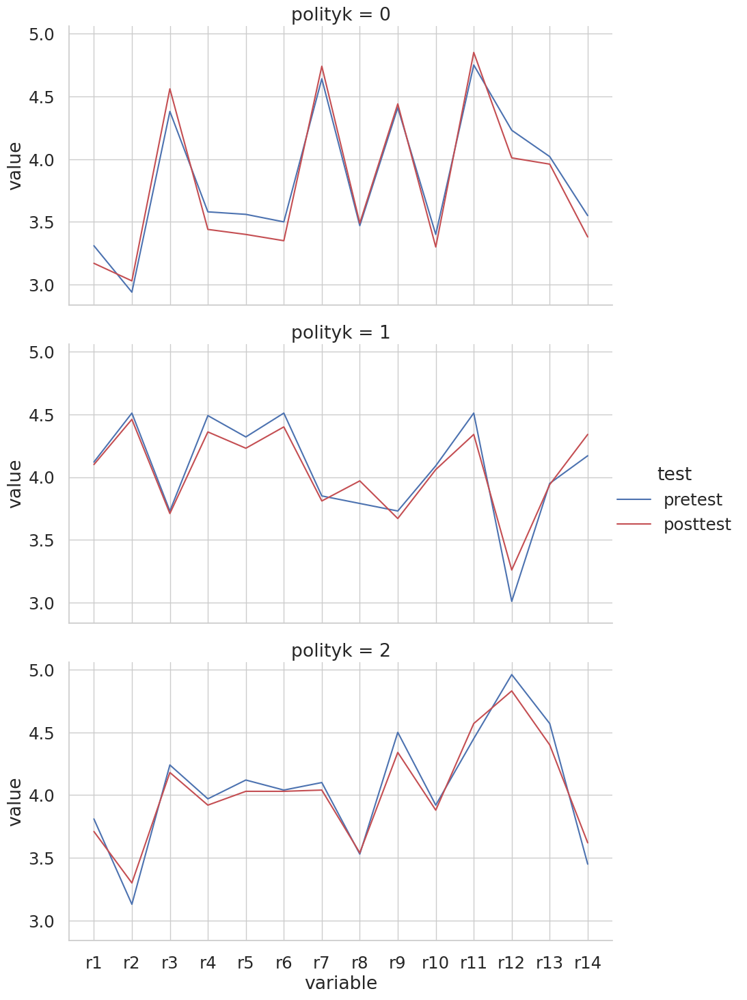

In [456]:
# suspect id
ax = sns.relplot(data = df_line, x = 'variable', y = 'value', col = 'polityk', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.9, col_wrap = 1)

plt.show()

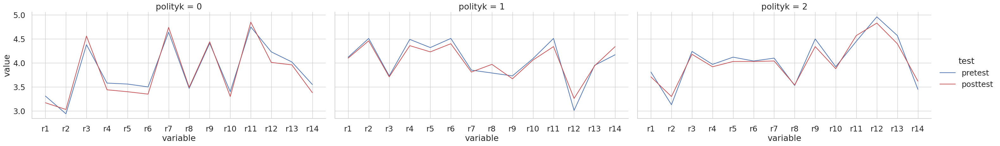

In [457]:
# suspect id
ax = sns.relplot(data = df_line, x = 'variable', y = 'value', col = 'polityk', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line", aspect = 1.8 )

plt.show()

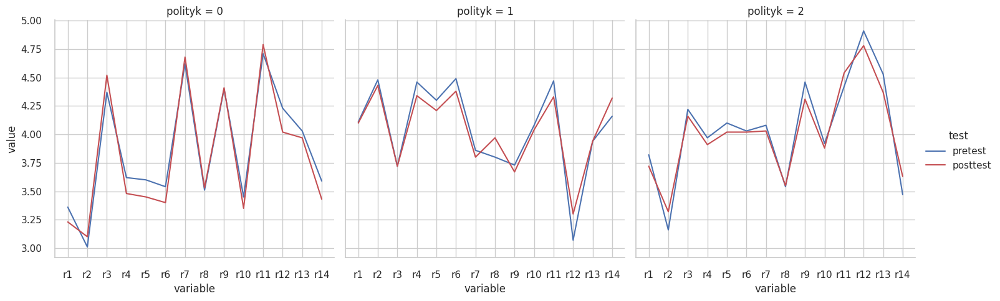

In [ ]:
ax = sns.relplot(data = df_line, x = 'variable', y = 'value', col = 'polityk', 
            hue = 'test', palette = {'pretest':'b', 'posttest':'r'}, kind="line")

plt.show()

In [ ]:
df_colspr = p3_RT[dyfer_przed].mean()
df_colspo = p3_RT[dyfer_po].mean()

df_colspr.values

array([3.36050157, 3.01253918, 4.37304075, 3.62068966, 3.59561129,
       3.54231975, 4.61755486, 3.51097179, 4.39811912, 3.44827586,
       4.71159875, 4.22884013, 4.02821317, 3.5862069 ])

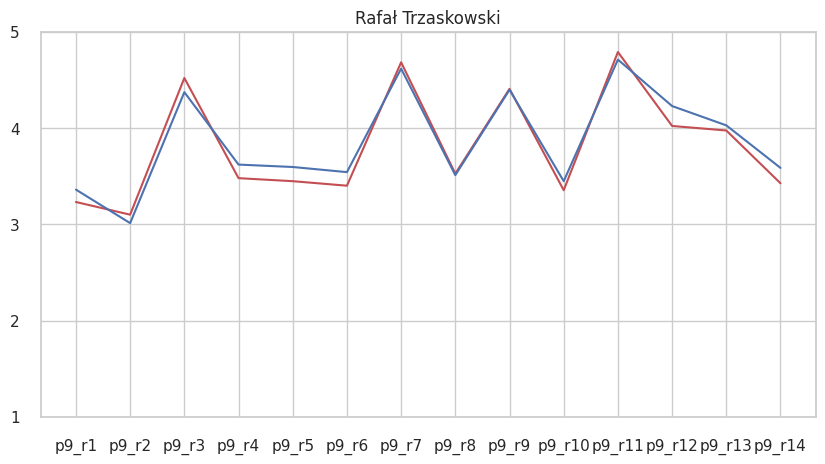

In [ ]:
plt.figure(figsize = (10,5))
plt.plot(list(df_colspo.index), df_colspo.values, color = 'r')
plt.plot(list(df_colspo.index), df_colspr.values, color = 'b')
plt.yticks(np.arange(1, 5.1, 1))
plt.title('Rafał Trzaskowski')
plt.show()

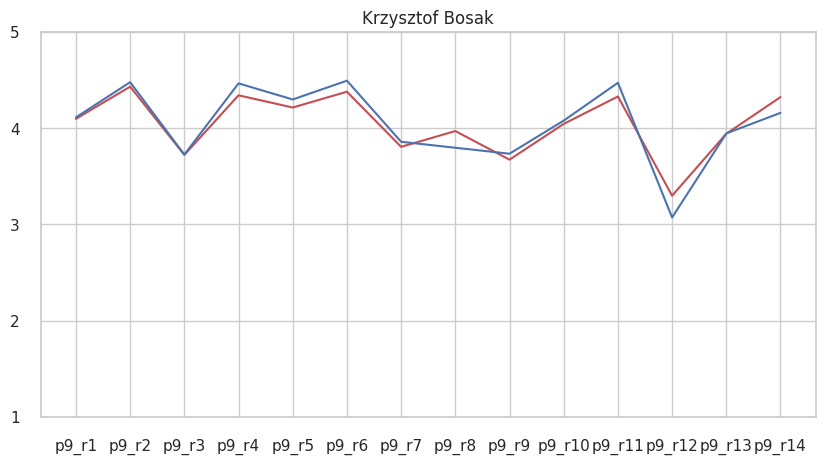

In [ ]:
plt.figure(figsize = (10,5))
plt.plot(list(df_colspo.index), df_colspo.values, color = 'r')
plt.plot(list(df_colspo.index), df_colspr.values, color = 'b')
plt.yticks(np.arange(1, 5.1, 1))
plt.title('Krzysztof Bosak')
plt.show()

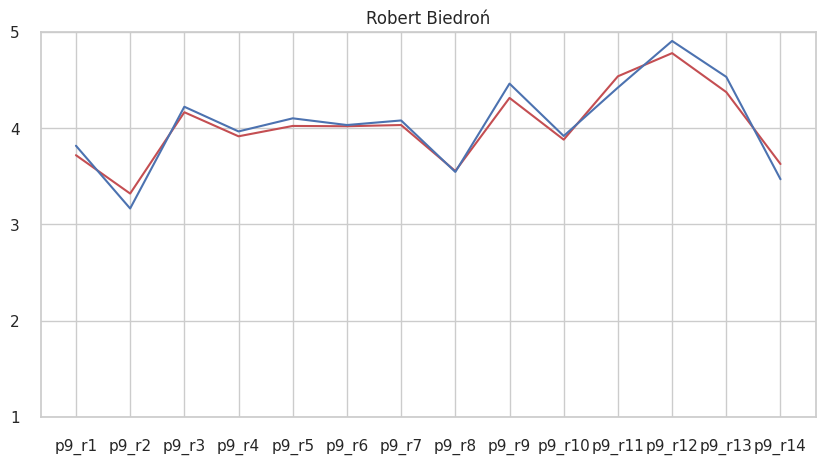

In [ ]:
plt.figure(figsize = (10,5))
plt.plot(list(df_colspo.index), df_colspo.values, color = 'r')
plt.plot(list(df_colspo.index), df_colspr.values, color = 'b')
plt.yticks(np.arange(1, 5.1, 1))
plt.title('Robert Biedroń')
plt.show()

##t-test

"To be an interval variable, each change from one point to the next must mean the same thing"

można liczby z dyferencjały traktowac jako ilościowe po różnice miedzy 1 i 2 oraz 6 i 7 są takie same, to nie jest trad. skala likerta gdzie odpowiedz 1 to "nie zgadzam się" a 3 to "nie wiem" - tutaj nie da się zmieżyć odległości między punktami na skali ale na dyferencjale już tak

###ttest_polityk_po

In [ ]:
ttest_polityk_przed_dyfer_pol = []
ttest_polityk_przed_dyfer_pytanie = []
ttest_polityk_przed_dyfer_t = []
ttest_polityk_przed_dyfer_p = []
ttest_polityk_przed_dyfer_cd = []

In [ ]:
# KB-RT

print('KB-RT')
for d in dyfer_po:
  pol1 = p3_KB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)


print('\n ****************************')
# KB-RB

print(' KB-RB ')
for d in dyfer_po:
  pol1 = p3_KB[d].values
  pol2 = p3_RB[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

print('\n ****************************')
# RB-RT

print(' RB-RT ')
for d in dyfer_po:
  pol1 = p3_RB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

KB-RT
p9_r1
reject H0
t:  5.578 p-value:  0.0 effect size:  0.44 

p9_r2
reject H0
t:  10.588 p-value:  0.0 effect size:  0.84 

p9_r3
reject H0
t:  -4.656 p-value:  0.0 effect size:  -0.37 

p9_r4
reject H0
t:  5.742 p-value:  0.0 effect size:  0.45 

p9_r5
reject H0
t:  5.183 p-value:  0.0 effect size:  0.41 

p9_r6
reject H0
t:  6.705 p-value:  0.0 effect size:  0.53 

p9_r7
reject H0
t:  -5.392 p-value:  0.0 effect size:  -0.43 

p9_r8
reject H0
t:  2.288 p-value:  0.0225 effect size:  0.18 

p9_r9
reject H0
t:  -5.031 p-value:  0.0 effect size:  -0.4 

p9_r10
reject H0
t:  4.719 p-value:  0.0 effect size:  0.37 

p9_r11
do NOT reject H0
t:  -1.913 p-value:  0.0562 effect size:  -0.15 

p9_r12
reject H0
t:  -8.983 p-value:  0.0 effect size:  -0.71 

p9_r13
do NOT reject H0
t:  -0.685 p-value:  0.4935 effect size:  -0.05 

p9_r14
reject H0
t:  4.142 p-value:  0.0 effect size:  0.33 


 ****************************
 KB-RB 
p9_r1
do NOT reject H0
t:  2.264 p-value:  0.0239 effect size

In [ ]:
ttest_polityk_po_dyfer_df = pd.DataFrame({
    'politycy':ttest_polityk_przed_dyfer_pol,
    'pytanie':ttest_polityk_przed_dyfer_pytanie,
    't':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'cohen_d':ttest_polityk_przed_dyfer_cd,

})

In [ ]:
ttest_polityk_po_dyfer_df.head()

,politycy,pytanie,t,p,cohen_d
0,KB-RT,p9_r1,5.578,0.0,0.44
1,KB-RT,p9_r2,10.588,0.0,0.84
2,KB-RT,p9_r3,-4.656,0.0,-0.37
3,KB-RT,p9_r4,5.742,0.0,0.45
4,KB-RT,p9_r5,5.183,0.0,0.41


In [ ]:
#ttest_polityk_po_dyfer_df.to_excel('ttest_polityk_po_dyfer_df.xlsx')
ttest_polityk_po_dyfer_df['p'] = ttest_polityk_po_dyfer_df['p'] * 2
ttest_polityk_po_dyfer_df['p'] = ttest_polityk_po_dyfer_df['p'].round(2)

ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05]

,politycy,pytanie,t,p,cohen_d
0,KB-RT,p9_r1,5.578,0.00,0.44
1,KB-RT,p9_r2,10.588,0.00,0.84
2,KB-RT,p9_r3,-4.656,0.00,-0.37
3,KB-RT,p9_r4,5.742,0.00,0.45
4,KB-RT,p9_r5,5.183,0.00,0.41
5,KB-RT,p9_r6,6.705,0.00,0.53
6,KB-RT,p9_r7,-5.392,0.00,-0.43
7,KB-RT,p9_r8,2.288,0.04,0.18
8,KB-RT,p9_r9,-5.031,0.00,-0.40
9,KB-RT,p9_r10,4.719,0.00,0.37


In [ ]:
ttest_polityk_po_dyfer_df = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05]

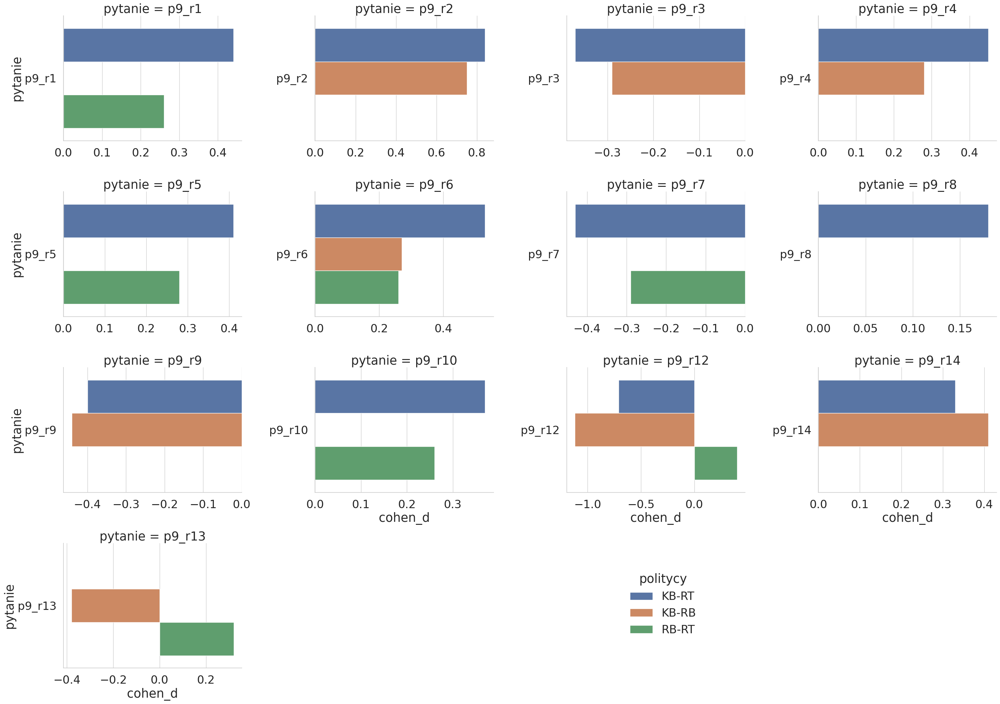

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height = 5.5, col = 'pytanie', col_wrap = 4,
            sharey=False, sharex=False)

sns.move_legend(g, loc = 'lower right', bbox_to_anchor = (0.7, 0.1))
plt.tight_layout(pad=1.5)
plt.show()

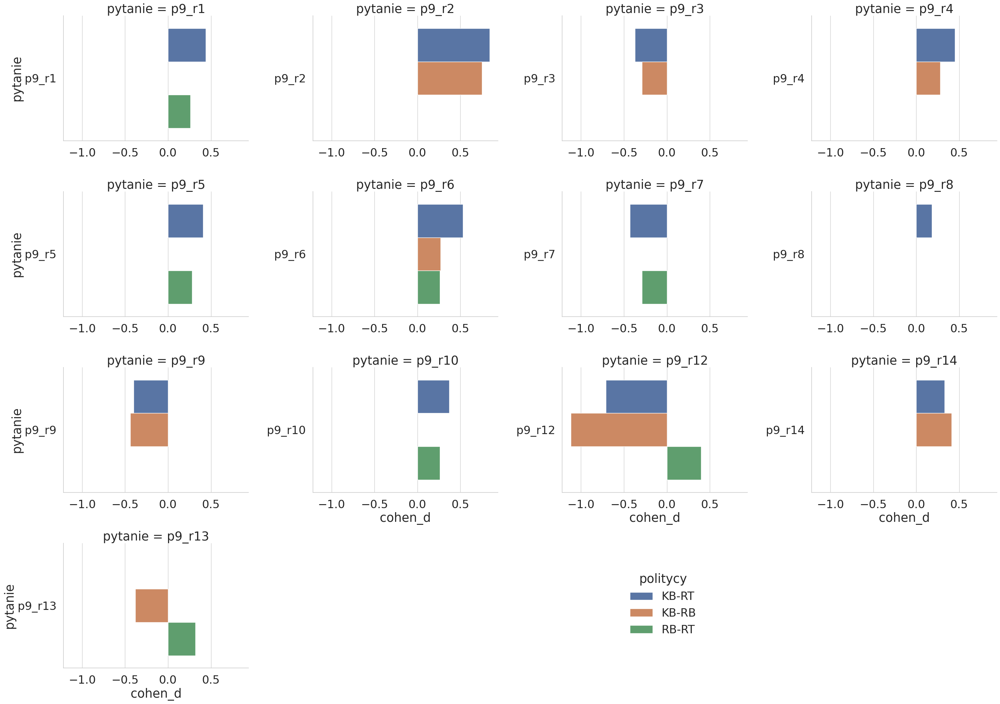

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height = 5.5, col = 'pytanie', col_wrap = 4,
            sharey=False, )

g.set(xticks = np.arange(-1, 0.85, 0.5))
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True) 

sns.move_legend(g, loc = 'lower right', bbox_to_anchor = (0.7, 0.1))
plt.tight_layout(pad=1.5)
plt.show()

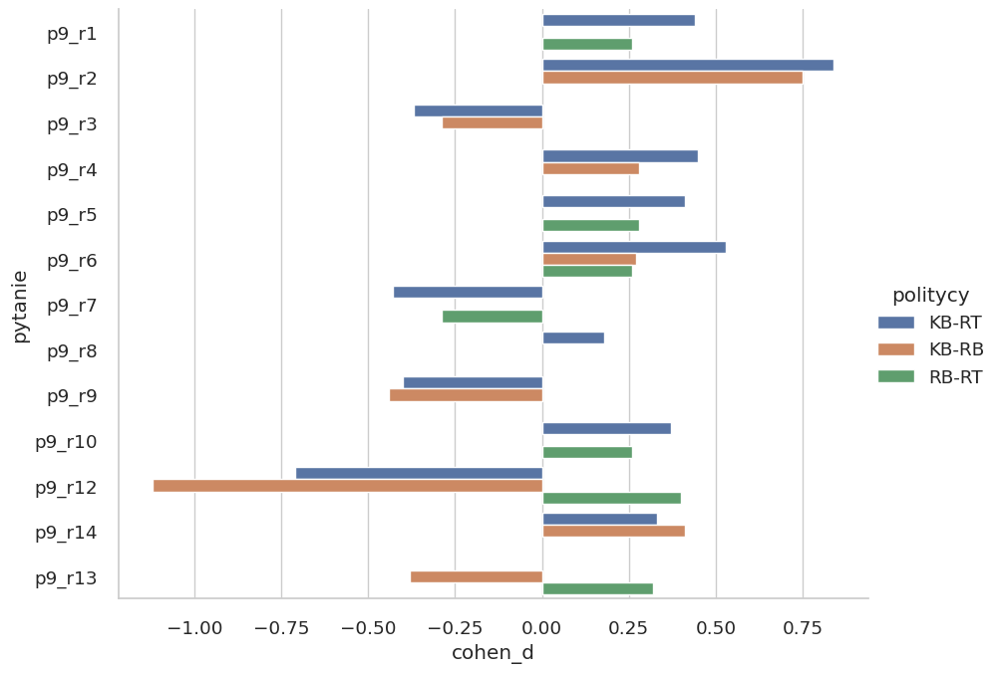

In [ ]:
sns.set(font_scale=1.2, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height=7)
plt.show()

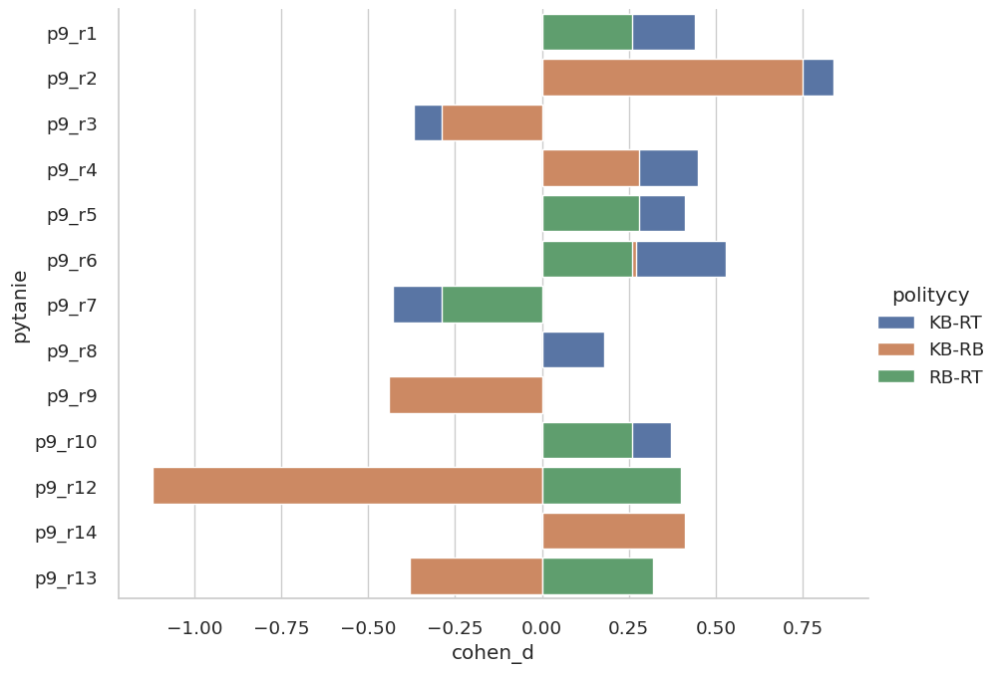

In [ ]:
sns.set(font_scale=1.2, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height=7, dodge = False)
plt.show()

###ttest_polityk_przed

In [ ]:
ttest_polityk_przed_dyfer_pol = []
ttest_polityk_przed_dyfer_pytanie = []
ttest_polityk_przed_dyfer_t = []
ttest_polityk_przed_dyfer_p = []
ttest_polityk_przed_dyfer_cd = []

In [ ]:
# KB-RT

print('KB-RT')
for d in dyfer_przed:
  pol1 = p3_KB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)


print('\n ****************************')
# KB-RB

print(' KB-RB ')
for d in dyfer_przed:
  pol1 = p3_KB[d].values
  pol2 = p3_RB[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

print('\n ****************************')
# RB-RT

print(' RB-RT ')
for d in dyfer_przed:
  pol1 = p3_RB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

KB-RT
p5_r1
reject H0
t:  5.578 p-value:  0.0 effect size:  0.44 

p5_r2
reject H0
t:  10.588 p-value:  0.0 effect size:  0.84 

p5_r3
reject H0
t:  -4.656 p-value:  0.0 effect size:  -0.37 

p5_r4
reject H0
t:  5.742 p-value:  0.0 effect size:  0.45 

p5_r5
reject H0
t:  5.183 p-value:  0.0 effect size:  0.41 

p5_r6
reject H0
t:  6.705 p-value:  0.0 effect size:  0.53 

p5_r7
reject H0
t:  -5.392 p-value:  0.0 effect size:  -0.43 

p5_r8
reject H0
t:  2.288 p-value:  0.0225 effect size:  0.18 

p5_r9
reject H0
t:  -5.031 p-value:  0.0 effect size:  -0.4 

p5_r10
reject H0
t:  4.719 p-value:  0.0 effect size:  0.37 

p5_r11
do NOT reject H0
t:  -1.913 p-value:  0.0562 effect size:  -0.15 

p5_r12
reject H0
t:  -8.983 p-value:  0.0 effect size:  -0.71 

p5_r13
do NOT reject H0
t:  -0.685 p-value:  0.4935 effect size:  -0.05 

p5_r14
reject H0
t:  4.142 p-value:  0.0 effect size:  0.33 


 ****************************
 KB-RB 
p5_r1
do NOT reject H0
t:  2.264 p-value:  0.0239 effect size

In [ ]:
ttest_polityk_przed_dyfer_df = pd.DataFrame({
    'politycy':ttest_polityk_przed_dyfer_pol,
    'pytanie':ttest_polityk_przed_dyfer_pytanie,
    't':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'cohen_d':ttest_polityk_przed_dyfer_cd,

})

In [ ]:
ttest_polityk_przed_dyfer_df.head()

,politycy,pytanie,t,p,cohen_d
0,KB-RT,p5_r1,5.578,0.0,0.44
1,KB-RT,p5_r2,10.588,0.0,0.84
2,KB-RT,p5_r3,-4.656,0.0,-0.37
3,KB-RT,p5_r4,5.742,0.0,0.45
4,KB-RT,p5_r5,5.183,0.0,0.41


In [ ]:
#ttest_polityk_przed_dyfer_df.to_excel('ttest_polityk_przed_dyfer_df.xlsx')

ttest_polityk_przed_dyfer_df['p'] = ttest_polityk_przed_dyfer_df['p'] * 2
ttest_polityk_przed_dyfer_df['p'] = ttest_polityk_przed_dyfer_df['p'].round(2)

ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05]

,politycy,pytanie,t,p,cohen_d
0,KB-RT,p5_r1,5.578,0.00,0.44
1,KB-RT,p5_r2,10.588,0.00,0.84
2,KB-RT,p5_r3,-4.656,0.00,-0.37
3,KB-RT,p5_r4,5.742,0.00,0.45
4,KB-RT,p5_r5,5.183,0.00,0.41
5,KB-RT,p5_r6,6.705,0.00,0.53
6,KB-RT,p5_r7,-5.392,0.00,-0.43
7,KB-RT,p5_r8,2.288,0.04,0.18
8,KB-RT,p5_r9,-5.031,0.00,-0.40
9,KB-RT,p5_r10,4.719,0.00,0.37


In [ ]:
ttest_polityk_przed_dyfer_df = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05]

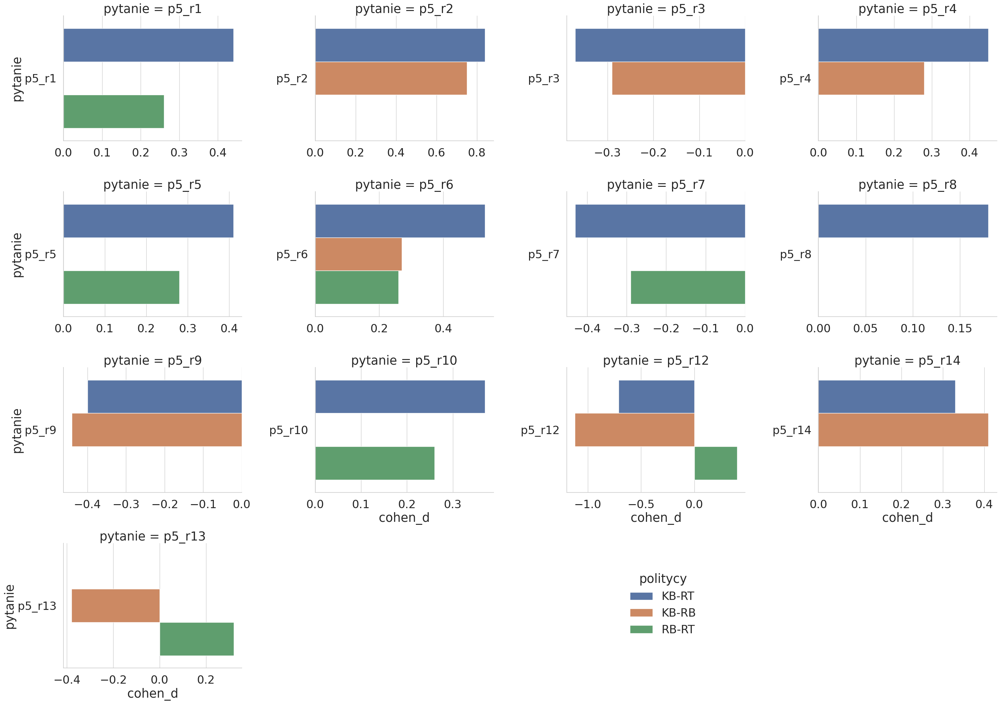

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height = 5.5, col = 'pytanie', col_wrap = 4,
            sharey=False, sharex=False)

sns.move_legend(g, loc = 'lower right', bbox_to_anchor = (0.7, 0.1))
plt.tight_layout(pad=1.5)
plt.show()

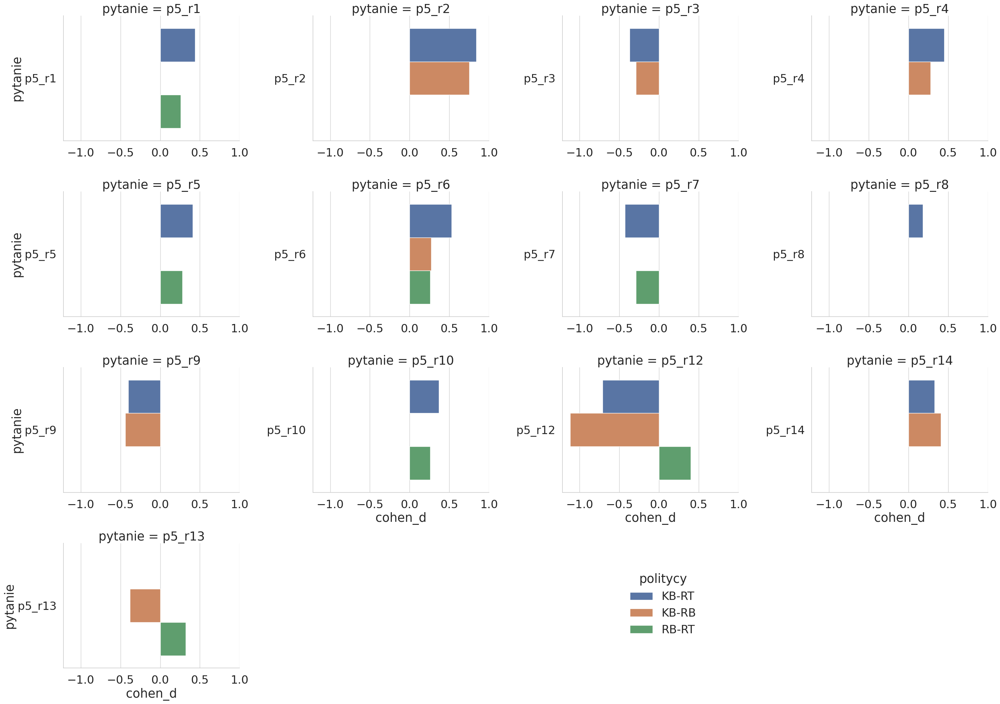

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height = 5.5, col = 'pytanie', col_wrap = 4,
            sharey=False, )

g.set(xticks = np.arange(-1, 1.05, 0.5))
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True) 

sns.move_legend(g, loc = 'lower right', bbox_to_anchor = (0.7, 0.1))
plt.tight_layout(pad=1.5)
plt.show()

In [ ]:
df.groupby('polityk')['p5_r13'].mean()

polityk
0    4.028213
1    3.944272
2    4.531646
Name: p5_r13, dtype: float64

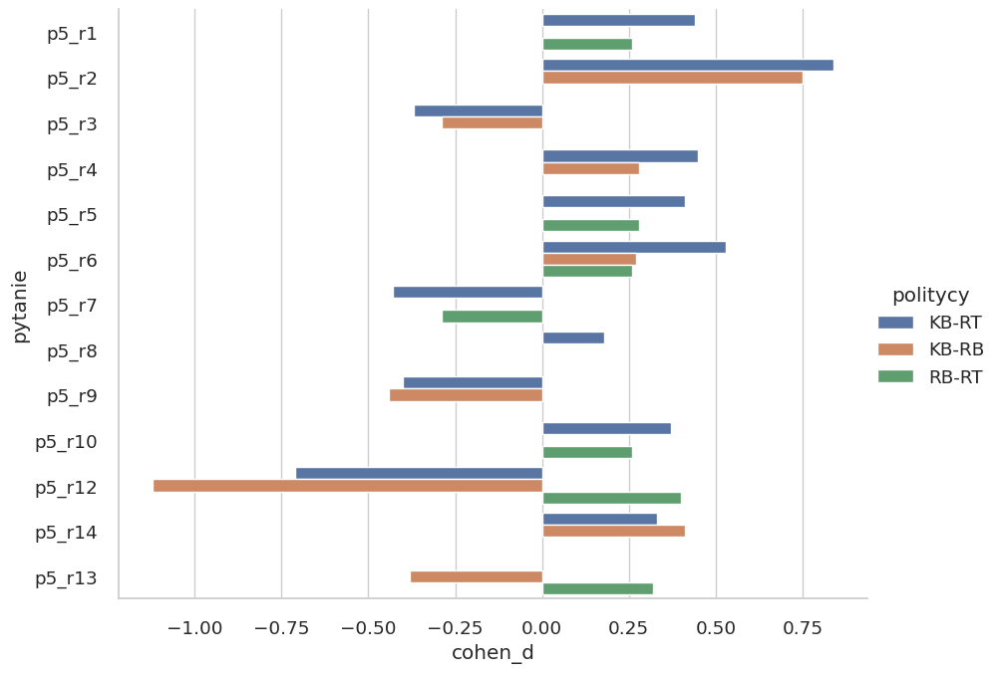

In [ ]:
sns.set(font_scale=1.2, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height=7)
plt.show()

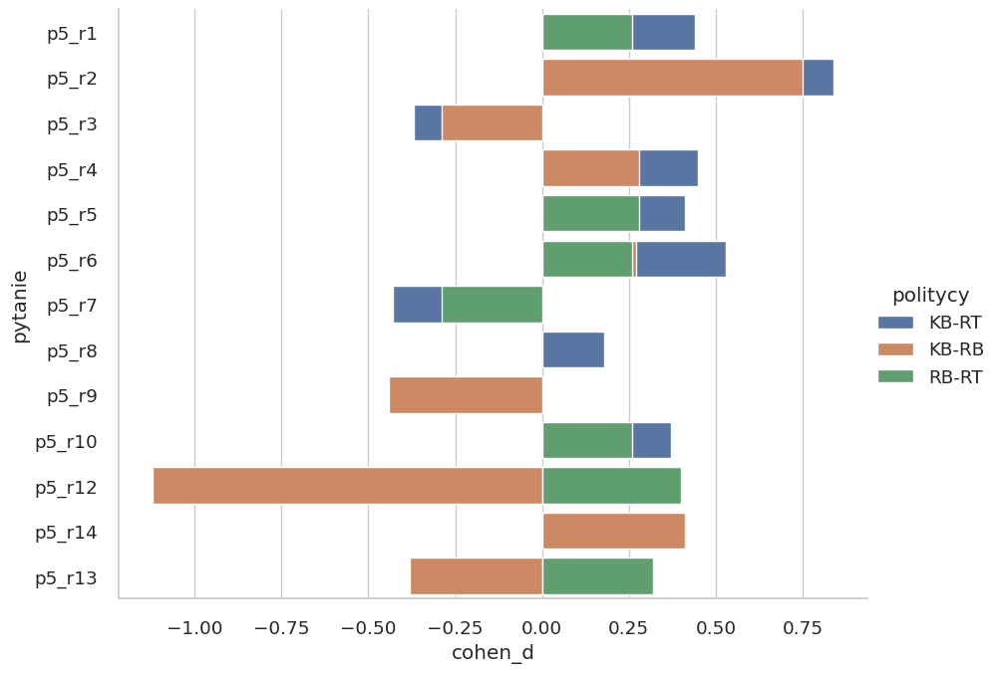

In [ ]:
sns.catplot(kind = 'bar', data = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height=7, dodge = False)
plt.show()

###pos-neg-neu

In [ ]:
# pos

for d in cc_pos2:
  dprzed = p3_pos[d[0]].values
  dpo = p3_pos[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r3', 'p9_r3')
reject H0
t:  3.008 p-value:  0.0014 effect size:  0.11 

('p5_r7', 'p9_r7')
reject H0
t:  2.643 p-value:  0.0043 effect size:  0.11 

('p5_r9', 'p9_r9')
reject H0
t:  2.543 p-value:  0.0057 effect size:  0.13 

('p5_r11', 'p9_r11')
do NOT reject H0
0.39058344573255727 0.3482 



In [ ]:
# neg

for d in cc_neg2:
  dprzed = p3_neg[d[0]].values
  dpo = p3_neg[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
0.883640355244951 0.1888 

('p5_r2', 'p9_r2')
reject H0
t:  5.793 p-value:  0.0 effect size:  0.29 

('p5_r4', 'p9_r4')
do NOT reject H0
-0.07473281317903328 0.5298 

('p5_r5', 'p9_r5')
do NOT reject H0
0.6122900419585047 0.2704 

('p5_r6', 'p9_r6')
do NOT reject H0
1.4534491223707562 0.0735 

('p5_r8', 'p9_r8')
reject H0
t:  6.19 p-value:  0.0 effect size:  0.3 

('p5_r10', 'p9_r10')
do NOT reject H0
1.359177696154028 0.0875 

('p5_r12', 'p9_r12')
reject H0
t:  2.498 p-value:  0.0065 effect size:  0.11 

('p5_r13', 'p9_r13')
do NOT reject H0
-1.6416731158785924 0.9492 

('p5_r14', 'p9_r14')
reject H0
t:  4.992 p-value:  0.0 effect size:  0.25 



In [ ]:
# neu

for d in cc:
  dprzed = p3_neu[d[0]].values
  dpo = p3_neu[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed) # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
-1.0326171196226426 0.3026 

('p5_r2', 'p9_r2')
do NOT reject H0
0.5120287790170309 0.609 

('p5_r3', 'p9_r3')
do NOT reject H0
1.6595824283469582 0.098 

('p5_r4', 'p9_r4')
do NOT reject H0
-1.3733128283225442 0.1706 

('p5_r5', 'p9_r5')
do NOT reject H0
-1.2298223226058886 0.2197 

('p5_r6', 'p9_r6')
reject H0
t:  -2.747 p-value:  0.0063 effect size:  -0.11 

('p5_r7', 'p9_r7')
do NOT reject H0
0.6623429601672566 0.5082 

('p5_r8', 'p9_r8')
do NOT reject H0
-1.1445756703651426 0.2532 

('p5_r9', 'p9_r9')
reject H0
t:  3.03 p-value:  0.0026 effect size:  0.13 

('p5_r10', 'p9_r10')
do NOT reject H0
-1.0236083225185797 0.3068 

('p5_r11', 'p9_r11')
do NOT reject H0
0.5117353574301322 0.6092 

('p5_r12', 'p9_r12')
do NOT reject H0
-0.48795063284402734 0.6259 

('p5_r13', 'p9_r13')
do NOT reject H0
0.5378688235921689 0.591 

('p5_r14', 'p9_r14')
do NOT reject H0
-0.1782609578647868 0.8586 



###pos przed-po inside polityk

In [ ]:
# KB

for d in cc_pos2:
  dprzed = p3_pos_KB[d[0]].values
  dpo = p3_pos_KB[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r3', 'p9_r3')
do NOT reject H0
0.4164066466962842 0.339 

('p5_r7', 'p9_r7')
do NOT reject H0
0.3261772557309954 0.3725 

('p5_r9', 'p9_r9')
do NOT reject H0
1.0128630453361989 0.1567 

('p5_r11', 'p9_r11')
do NOT reject H0
-1.5099933011621673 0.933 



In [ ]:
# RB

for d in cc_pos2:
  dprzed = p3_pos_RB[d[0]].values
  dpo = p3_pos_RB[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r3', 'p9_r3')
reject H0
t:  1.883 p-value:  0.0313 effect size:  0.13 

('p5_r7', 'p9_r7')
reject H0
t:  2.038 p-value:  0.0221 effect size:  0.15 

('p5_r9', 'p9_r9')
reject H0
t:  2.382 p-value:  0.0096 effect size:  0.19 

('p5_r11', 'p9_r11')
do NOT reject H0
0.3193066639189809 0.3751 



In [ ]:
# RT

for d in cc_pos2:
  dprzed = p3_pos_RT[d[0]].values
  dpo = p3_pos_RT[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r3', 'p9_r3')
reject H0
t:  3.333 p-value:  0.0006 effect size:  0.18 

('p5_r7', 'p9_r7')
reject H0
t:  2.471 p-value:  0.0075 effect size:  0.15 

('p5_r9', 'p9_r9')
do NOT reject H0
1.3733544347122422 0.0863 

('p5_r11', 'p9_r11')
reject H0
t:  2.461 p-value:  0.0077 effect size:  0.18 



###neg przed-po inside polityk

In [ ]:
# KB

for d in cc_neg2:
  dprzed = p3_neg_KB[d[0]].values
  dpo = p3_neg_KB[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
1.2236568135453656 0.112 

('p5_r2', 'p9_r2')
reject H0
t:  3.862 p-value:  0.0001 effect size:  0.37 

('p5_r4', 'p9_r4')
do NOT reject H0
0.37215135715309833 0.3553 

('p5_r5', 'p9_r5')
do NOT reject H0
1.1956516755288544 0.1173 

('p5_r6', 'p9_r6')
do NOT reject H0
0.9278495535689335 0.1778 

('p5_r8', 'p9_r8')
reject H0
t:  3.895 p-value:  0.0001 effect size:  0.41 

('p5_r10', 'p9_r10')
do NOT reject H0
1.0203260781715744 0.155 

('p5_r12', 'p9_r12')
reject H0
t:  4.557 p-value:  0.0 effect size:  0.4 

('p5_r13', 'p9_r13')
do NOT reject H0
-0.24799882430465675 0.5977 

('p5_r14', 'p9_r14')
reject H0
t:  3.778 p-value:  0.0001 effect size:  0.39 



In [ ]:
# RB

for d in cc_neg2:
  dprzed = p3_neg_RB[d[0]].values
  dpo = p3_neg_RB[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
0.6524064803383763 0.2578 

('p5_r2', 'p9_r2')
reject H0
t:  3.64 p-value:  0.0002 effect size:  0.37 

('p5_r4', 'p9_r4')
do NOT reject H0
0.6629383567554875 0.2544 

('p5_r5', 'p9_r5')
do NOT reject H0
0.25928148942086576 0.398 

('p5_r6', 'p9_r6')
do NOT reject H0
1.6630347814201842 0.0496 

('p5_r8', 'p9_r8')
reject H0
t:  4.489 p-value:  0.0 effect size:  0.39 

('p5_r10', 'p9_r10')
do NOT reject H0
1.5905803504813294 0.0573 

('p5_r12', 'p9_r12')
do NOT reject H0
0.4713559399158791 0.3192 

('p5_r13', 'p9_r13')
do NOT reject H0
-0.6365723685819727 0.7371 

('p5_r14', 'p9_r14')
reject H0
t:  3.127 p-value:  0.0011 effect size:  0.31 



In [ ]:
# RT

for d in cc_neg2:
  dprzed = p3_neg_RT[d[0]].values
  dpo = p3_neg_RT[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
-0.6635889897572831 0.7458 

('p5_r2', 'p9_r2')
reject H0
t:  2.563 p-value:  0.0059 effect size:  0.19 

('p5_r4', 'p9_r4')
do NOT reject H0
-1.3187050659064967 0.905 

('p5_r5', 'p9_r5')
do NOT reject H0
-0.47264883396472995 0.6813 

('p5_r6', 'p9_r6')
do NOT reject H0
-0.4948404911958174 0.6891 

('p5_r8', 'p9_r8')
reject H0
t:  2.079 p-value:  0.02 effect size:  0.14 

('p5_r10', 'p9_r10')
do NOT reject H0
-0.630705997473164 0.7352 

('p5_r12', 'p9_r12')
do NOT reject H0
-1.4208066683349456 0.9209 

('p5_r13', 'p9_r13')
do NOT reject H0
-2.012668255037672 0.9767 

('p5_r14', 'p9_r14')
do NOT reject H0
1.5714029850271178 0.0595 



###neu przed-po inside polityk

In [ ]:
# KB

for d in cc:
  dprzed = p3_neu_KB[d[0]].values
  dpo = p3_neu_KB[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed) # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
-0.5506541889227532 0.583 

('p5_r2', 'p9_r2')
do NOT reject H0
-0.6013318551349163 0.5488 

('p5_r3', 'p9_r3')
do NOT reject H0
1.5251591750401334 0.13 

('p5_r4', 'p9_r4')
do NOT reject H0
-1.387290239728422 0.1681 

('p5_r5', 'p9_r5')
reject H0
t:  -2.131 p-value:  0.0353 effect size:  -0.17 

('p5_r6', 'p9_r6')
reject H0
t:  -2.422 p-value:  0.017 effect size:  -0.18 

('p5_r7', 'p9_r7')
do NOT reject H0
1.1419486750406702 0.2559 

('p5_r8', 'p9_r8')
do NOT reject H0
0.37804413672030457 0.7061 

('p5_r9', 'p9_r9')
reject H0
t:  2.108 p-value:  0.0372 effect size:  0.16 

('p5_r10', 'p9_r10')
do NOT reject H0
-1.0446026942666802 0.2984 

('p5_r11', 'p9_r11')
do NOT reject H0
0.22713502835956045 0.8207 

('p5_r12', 'p9_r12')
do NOT reject H0
1.995679562910974 0.0484 

('p5_r13', 'p9_r13')
do NOT reject H0
1.293827546796925 0.1984 

('p5_r14', 'p9_r14')
do NOT reject H0
1.27629837160788 0.2045 



In [ ]:
# RB

for d in cc:
  dprzed = p3_neu_RB[d[0]].values
  dpo = p3_neu_RB[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed) # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
-0.33663128357919037 0.7371 

('p5_r2', 'p9_r2')
do NOT reject H0
0.3054585457643015 0.7606 

('p5_r3', 'p9_r3')
do NOT reject H0
0.6377928041432808 0.525 

('p5_r4', 'p9_r4')
do NOT reject H0
-0.42865555290800705 0.6691 

('p5_r5', 'p9_r5')
do NOT reject H0
-0.07239391448919962 0.9424 

('p5_r6', 'p9_r6')
do NOT reject H0
-0.46965161610390926 0.6396 

('p5_r7', 'p9_r7')
do NOT reject H0
0.0 1.0 

('p5_r8', 'p9_r8')
reject H0
t:  -2.304 p-value:  0.0232 effect size:  -0.16 

('p5_r9', 'p9_r9')
do NOT reject H0
1.5584095594899066 0.1222 

('p5_r10', 'p9_r10')
do NOT reject H0
-1.1675570709506304 0.2457 

('p5_r11', 'p9_r11')
do NOT reject H0
0.560112033611204 0.5766 

('p5_r12', 'p9_r12')
do NOT reject H0
-1.9500152345535298 0.0539 

('p5_r13', 'p9_r13')
do NOT reject H0
-0.7842325533997844 0.4347 

('p5_r14', 'p9_r14')
do NOT reject H0
0.6813851438692469 0.4971 



In [ ]:
# RT

for d in cc:
  dprzed = p3_neu_RT[d[0]].values
  dpo = p3_neu_RT[d[1]].values
  print(d)

  value, p = ttest_rel(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    cd = cohend(dpo, dprzed)
    cd = round(cd, 2)
    print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
-0.8560410761819038 0.803 

('p5_r2', 'p9_r2')
do NOT reject H0
1.1272198180118798 0.1311 

('p5_r3', 'p9_r3')
do NOT reject H0
0.6747073354733117 0.2507 

('p5_r4', 'p9_r4')
do NOT reject H0
-0.47784939503767565 0.6831 

('p5_r5', 'p9_r5')
do NOT reject H0
-0.06576477209564995 0.5262 

('p5_r6', 'p9_r6')
do NOT reject H0
-1.84497920655782 0.966 

('p5_r7', 'p9_r7')
do NOT reject H0
-0.07523065617958145 0.5299 

('p5_r8', 'p9_r8')
do NOT reject H0
-0.4667561886043613 0.6792 

('p5_r9', 'p9_r9')
do NOT reject H0
1.599566252026226 0.0564 

('p5_r10', 'p9_r10')
do NOT reject H0
0.21062924902677943 0.4168 

('p5_r11', 'p9_r11')
do NOT reject H0
0.1509055868113788 0.4402 

('p5_r12', 'p9_r12')
do NOT reject H0
-1.3591978848012505 0.9115 

('p5_r13', 'p9_r13')
do NOT reject H0
0.1892339284103308 0.4251 

('p5_r14', 'p9_r14')
do NOT reject H0
-2.099754340470385 0.9809 



###diff 

In [ ]:
ttest_polityk_przed_dyfer_pol = []
ttest_polityk_przed_dyfer_pytanie = []
ttest_polityk_przed_dyfer_t = []
ttest_polityk_przed_dyfer_p = []
ttest_polityk_przed_dyfer_cd = []

ttest_polityk_przed_dyfer_stimulus = []

In [ ]:
# neg_

# KB-RT

print('KB-RT')
for d in cc_diff_neg:
  pol1 = p3_neg_KB[d].values
  pol2 = p3_neg_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('negative')


print('\n ****************************')
# KB-RB

print(' KB-RB ')
for d in cc_diff_neg:
  pol1 = p3_neg_KB[d].values
  pol2 = p3_neg_RB[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('negative')

print('\n ****************************')
# RB-RT

print(' RB-RT ')
for d in cc_diff_neg:
  pol1 = p3_neg_RB[d].values
  pol2 = p3_neg_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('negative')


KB-RT
diff_r1
reject H0
t:  2.686 p-value:  0.0078 effect size:  0.37 

diff_r2
reject H0
t:  5.105 p-value:  0.0 effect size:  0.7 

diff_r4
reject H0
t:  3.228 p-value:  0.0014 effect size:  0.44 

diff_r5
reject H0
t:  2.912 p-value:  0.004 effect size:  0.4 

diff_r6
reject H0
t:  3.476 p-value:  0.0006 effect size:  0.48 

diff_r8
do NOT reject H0
t:  1.834 p-value:  0.0681 effect size:  0.25 

diffr10
reject H0
t:  2.856 p-value:  0.0047 effect size:  0.39 

diffr12
reject H0
t:  -4.968 p-value:  0.0 effect size:  -0.68 

diffr13
do NOT reject H0
t:  -0.249 p-value:  0.8039 effect size:  -0.03 

diffr14
reject H0
t:  3.04 p-value:  0.0027 effect size:  0.42 


 ****************************
 KB-RB 
diff_r1
do NOT reject H0
t:  0.486 p-value:  0.6277 effect size:  0.07 

diff_r2
reject H0
t:  4.311 p-value:  0.0 effect size:  0.59 

diff_r4
do NOT reject H0
t:  0.696 p-value:  0.4871 effect size:  0.1 

diff_r5
do NOT reject H0
t:  0.029 p-value:  0.9768 effect size:  0.0 

diff_r6

In [ ]:
# pos

# KB-RT

print('KB-RT')
for d in cc_diff_pos:
  pol1 = p3_pos_KB[d].values
  pol2 = p3_pos_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('positive')


print('\n ****************************')
# KB-RB

print(' KB-RB ')
for d in cc_diff_pos:
  pol1 = p3_pos_KB[d].values
  pol2 = p3_pos_RB[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('positive')


print('\n ****************************')
# RB-RT

print(' RB-RT ')
for d in cc_diff_pos:
  pol1 = p3_pos_RB[d].values
  pol2 = p3_pos_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('positive')


KB-RT
diff_r3
reject H0
t:  -2.354 p-value:  0.0195 effect size:  -0.32 

diff_r7
do NOT reject H0
t:  -2.017 p-value:  0.045 effect size:  -0.28 

diff_r9
reject H0
t:  -2.477 p-value:  0.014 effect size:  -0.34 

diffr11
do NOT reject H0
t:  -0.872 p-value:  0.3843 effect size:  -0.12 


 ****************************
 KB-RB 
diff_r3
do NOT reject H0
t:  -2.253 p-value:  0.0253 effect size:  -0.31 

diff_r7
do NOT reject H0
t:  -1.206 p-value:  0.2294 effect size:  -0.17 

diff_r9
reject H0
t:  -2.512 p-value:  0.0128 effect size:  -0.35 

diffr11
do NOT reject H0
t:  -0.276 p-value:  0.7825 effect size:  -0.04 


 ****************************
 RB-RT 
diff_r3
do NOT reject H0
t:  -0.188 p-value:  0.8514 effect size:  -0.03 

diff_r7
do NOT reject H0
t:  -0.872 p-value:  0.3842 effect size:  -0.12 

diff_r9
do NOT reject H0
t:  -0.136 p-value:  0.8923 effect size:  -0.02 

diffr11
do NOT reject H0
t:  -0.614 p-value:  0.54 effect size:  -0.09 



In [ ]:
# general

# KB-RT

print('KB-RT')
for d in cc_diff:
  pol1 = p3_KB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('all')


print('\n ****************************')
# KB-RB

print(' KB-RB ')
for d in cc_diff:
  pol1 = p3_KB[d].values
  pol2 = p3_RB[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('all')


print('\n ****************************')
# RB-RT

print(' RB-RT ')
for d in cc_diff:
  pol1 = p3_RB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = ttest_ind(pol1, pol2) # , alternative='greater'
  cd = cohend(pol1, pol2)
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
  else:
    print("do NOT reject H0")
  print('t: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  ttest_polityk_przed_dyfer_pol.append('RB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)
  ttest_polityk_przed_dyfer_stimulus.append('all')


KB-RT
diff_r1
reject H0
t:  5.578 p-value:  0.0 effect size:  0.44 

diff_r2
reject H0
t:  10.588 p-value:  0.0 effect size:  0.84 

diff_r3
reject H0
t:  -4.656 p-value:  0.0 effect size:  -0.37 

diff_r4
reject H0
t:  5.742 p-value:  0.0 effect size:  0.45 

diff_r5
reject H0
t:  5.183 p-value:  0.0 effect size:  0.41 

diff_r6
reject H0
t:  6.705 p-value:  0.0 effect size:  0.53 

diff_r7
reject H0
t:  -5.392 p-value:  0.0 effect size:  -0.43 

diff_r8
reject H0
t:  2.288 p-value:  0.0225 effect size:  0.18 

diff_r9
reject H0
t:  -5.031 p-value:  0.0 effect size:  -0.4 

diffr10
reject H0
t:  4.719 p-value:  0.0 effect size:  0.37 

diffr11
do NOT reject H0
t:  -1.913 p-value:  0.0562 effect size:  -0.15 

diffr12
reject H0
t:  -8.983 p-value:  0.0 effect size:  -0.71 

diffr13
do NOT reject H0
t:  -0.685 p-value:  0.4935 effect size:  -0.05 

diffr14
reject H0
t:  4.142 p-value:  0.0 effect size:  0.33 


 ****************************
 KB-RB 
diff_r1
do NOT reject H0
t:  2.264 p-v

In [ ]:
ttest_polityk_diff_df = pd.DataFrame({
    'politycy':ttest_polityk_przed_dyfer_pol,
    'pytanie':ttest_polityk_przed_dyfer_pytanie,
    't':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'cohen_d':ttest_polityk_przed_dyfer_cd,
    'stimulus':ttest_polityk_przed_dyfer_stimulus,

})

In [ ]:
ttest_polityk_diff_df.head()

,politycy,pytanie,t,p,cohen_d,stimulus
0,KB-RT,diff_r1,2.686,0.0078,0.37,negative
1,KB-RT,diff_r2,5.105,0.0000,0.70,negative
2,KB-RT,diff_r4,3.228,0.0014,0.44,negative
3,KB-RT,diff_r5,2.912,0.0040,0.40,negative
4,KB-RT,diff_r6,3.476,0.0006,0.48,negative


In [ ]:
#ttest_polityk_diff_df.to_excel('ttest_polityk_diff_df.xlsx')

ttest_polityk_diff_df['p'] = ttest_polityk_diff_df['p'] * 2
ttest_polityk_diff_df['p'] = ttest_polityk_diff_df['p'].round(2)

ttest_polityk_diff_df[ttest_polityk_diff_df['p'] < 0.05]

,politycy,pytanie,t,p,cohen_d,stimulus
0,KB-RT,diff_r1,2.686,0.02,0.37,negative
1,KB-RT,diff_r2,5.105,0.00,0.70,negative
2,KB-RT,diff_r4,3.228,0.00,0.44,negative
3,KB-RT,diff_r5,2.912,0.01,0.40,negative
4,KB-RT,diff_r6,3.476,0.00,0.48,negative
6,KB-RT,diffr10,2.856,0.01,0.39,negative
7,KB-RT,diffr12,-4.968,0.00,-0.68,negative
9,KB-RT,diffr14,3.040,0.01,0.42,negative
11,KB-RB,diff_r2,4.311,0.00,0.59,negative
17,KB-RB,diffr12,-7.722,0.00,-1.06,negative


In [ ]:
ttest_polityk_diff_df = ttest_polityk_diff_df[ttest_polityk_diff_df['p'] < 0.05]

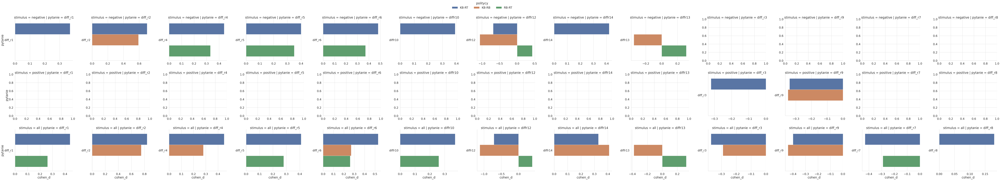

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_diff_df[ttest_polityk_diff_df['p'] < 0.05], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height = 7, col = 'pytanie', row = 'stimulus',
            sharey=False, sharex=False)

sns.move_legend(g, loc = 'upper left', bbox_to_anchor = (0.45, 1.06), ncols = 3, )
plt.tight_layout(pad=2)
plt.show()

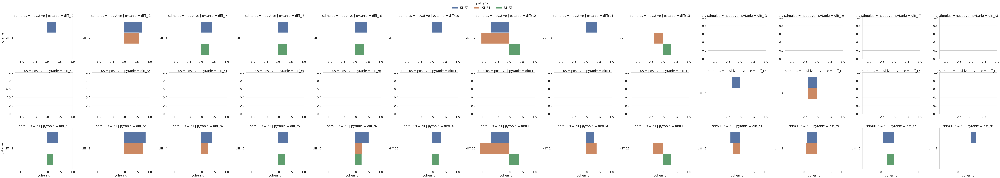

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_diff_df, 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height = 7, col = 'pytanie', row = 'stimulus',
            sharey=False, )

g.set(xticks = np.arange(-1, 1.05, 0.5))
sns.move_legend(g, loc = 'upper left', bbox_to_anchor = (0.45, 1.05), ncols = 3, )

for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True)

plt.tight_layout(pad=2)
plt.show()

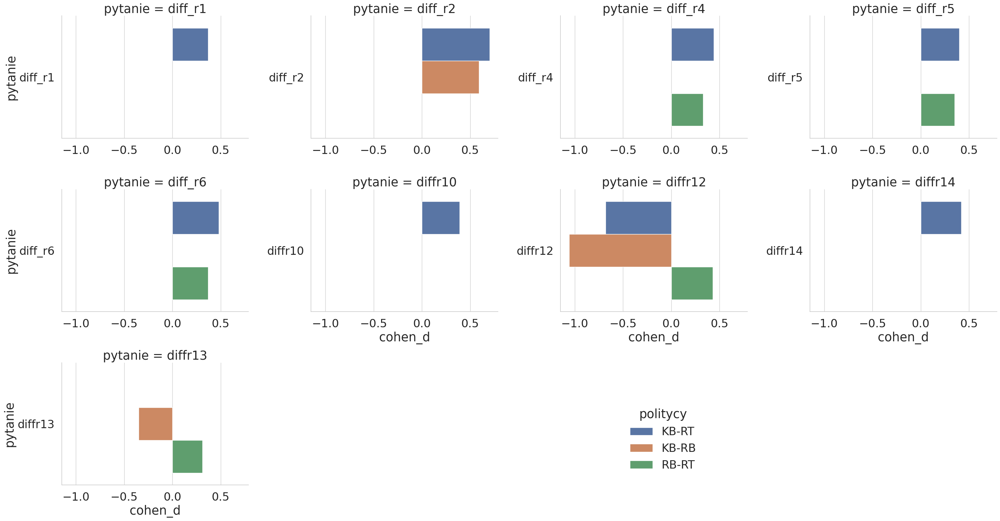

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_diff_df[ttest_polityk_diff_df['stimulus'] == 'negative'], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height = 5.5, col = 'pytanie', col_wrap = 4,
            sharey=False, )

#g.set(xticks = np.arange(-1, 1.05, 0.5))
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True) 

sns.move_legend(g, loc = 'lower right', bbox_to_anchor = (0.7, 0.1))
plt.tight_layout(pad=1.5)
plt.show()

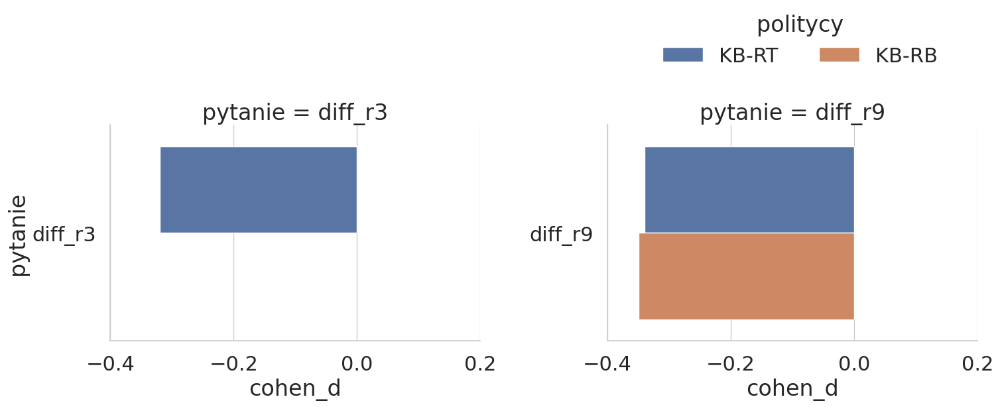

In [ ]:
sns.set(font_scale=2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_diff_df[ttest_polityk_diff_df['stimulus'] == 'positive'], 
            y = 'pytanie', x = 'cohen_d', hue = 'politycy', aspect=1.3, height = 5.5, col = 'pytanie', col_wrap = 4,
            sharey=False, )

g.set(xticks = np.arange(-0.4, 0.2, 0.2))
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True) 

sns.move_legend(g, loc = 'upper left', bbox_to_anchor = (0.33, 1.2), ncols = 3, )
plt.tight_layout(pad=1.5)
plt.show()

##mannwhitneyu

In [ ]:
from scipy.stats import mannwhitneyu

# r = z/sqrt(N)  or  1 – (2U)/(n1 n2)
# effect size

In [ ]:
1 - (2* 66375.5) / (len(p3_KB) * len(p3_RT))

-0.2883818434154721

In [ ]:
len(p3_KB), len(p3_RT)

(323, 319)

###ttest_polityk_po

In [ ]:
ttest_polityk_przed_dyfer_pol = []
ttest_polityk_przed_dyfer_pytanie = []
ttest_polityk_przed_dyfer_t = []
ttest_polityk_przed_dyfer_p = []
ttest_polityk_przed_dyfer_cd = []

In [ ]:
# KB-RT

print('KB-RT')
for d in dyfer_po:
  pol1 = p3_KB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = mannwhitneyu(pol1, pol2) # , alternative='greater'
  cd = 1 - (2* value) / (len(pol1) * len(pol2))
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
    print('U: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print('U: ', value.round(3), 'p-value: ', p.round(4), "\n")

  ttest_polityk_przed_dyfer_pol.append('KB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)


print('\n ****************************')
# KB-RB

print(' KB-RB ')
for d in dyfer_po:
  pol1 = p3_KB[d].values
  pol2 = p3_RB[d].values
  print(d)

  value, p = mannwhitneyu(pol1, pol2) # , alternative='greater'
  cd = 1 - (2* value) / (len(pol1) * len(pol2))
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
    print('U: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print('U: ', value.round(3), 'p-value: ', p.round(4), "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

print('\n ****************************')
# RB-RT

print(' RB-RT ')
for d in dyfer_po:
  pol1 = p3_RB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = mannwhitneyu(pol1, pol2) # , alternative='greater'
  cd = 1 - (2* value) / (len(pol1) * len(pol2))
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
    print('U: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print('U: ', value.round(3), 'p-value: ', p.round(4), "\n")
  ttest_polityk_przed_dyfer_pol.append('RB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

KB-RT
p9_r1
reject H0
U:  66375.5 p-value:  0.0 effect size:  -0.29 

p9_r2
reject H0
U:  72700.0 p-value:  0.0 effect size:  -0.41 

p9_r3
reject H0
U:  38657.0 p-value:  0.0 effect size:  0.25 

p9_r4
reject H0
U:  65186.5 p-value:  0.0 effect size:  -0.27 

p9_r5
reject H0
U:  64792.0 p-value:  0.0 effect size:  -0.26 

p9_r6
reject H0
U:  67818.5 p-value:  0.0 effect size:  -0.32 

p9_r7
reject H0
U:  37021.0 p-value:  0.0 effect size:  0.28 

p9_r8
reject H0
U:  59879.5 p-value:  0.0002 effect size:  -0.16 

p9_r9
reject H0
U:  39097.0 p-value:  0.0 effect size:  0.24 

p9_r10
reject H0
U:  63840.0 p-value:  0.0 effect size:  -0.24 

p9_r11
reject H0
U:  42825.0 p-value:  0.0001 effect size:  0.17 

p9_r12
reject H0
U:  39075.5 p-value:  0.0 effect size:  0.24 

p9_r13
do NOT reject H0
U:  51569.0 p-value:  0.9823 

p9_r14
reject H0
U:  66117.0 p-value:  0.0 effect size:  -0.28 


 ****************************
 KB-RB 
p9_r1
reject H0
U:  57485.0 p-value:  0.0047 effect size:  -0.1

In [ ]:
ttest_polityk_po_dyfer_df = pd.DataFrame({
    'politycy':ttest_polityk_przed_dyfer_pol,
    'pytanie':ttest_polityk_przed_dyfer_pytanie,
    'u':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'effect':ttest_polityk_przed_dyfer_cd,

})

In [ ]:
ttest_polityk_po_dyfer_df.head()

,politycy,pytanie,u,p,effect
0,KB-RT,p9_r1,66375.5,0.0,-0.29
1,KB-RT,p9_r2,72700.0,0.0,-0.41
2,KB-RT,p9_r3,38657.0,0.0,0.25
3,KB-RT,p9_r4,65186.5,0.0,-0.27
4,KB-RT,p9_r5,64792.0,0.0,-0.26


In [ ]:
#ttest_polityk_po_dyfer_df.to_excel('ttest_polityk_po_dyfer_df.xlsx')
ttest_polityk_po_dyfer_df['p'] = ttest_polityk_po_dyfer_df['p'] * 2
ttest_polityk_po_dyfer_df['p'] = ttest_polityk_po_dyfer_df['p'].round(2)

ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05]

In [ ]:
ttest_polityk_po_dyfer_df = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05]

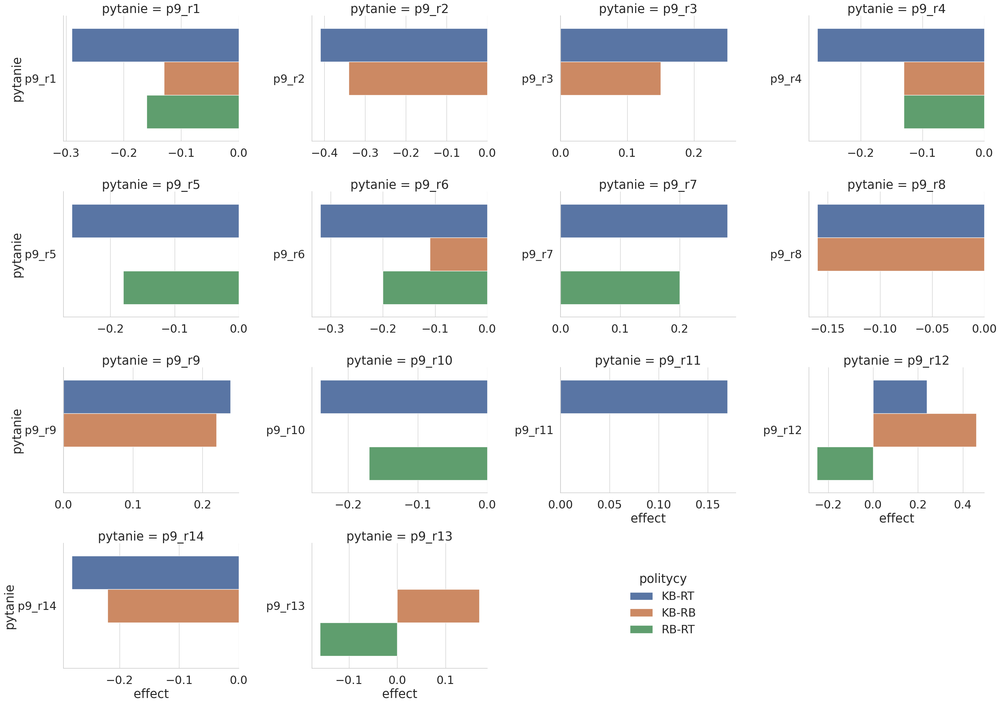

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'effect', hue = 'politycy', aspect=1.3, height = 5.5, col = 'pytanie', col_wrap = 4,
            sharey=False, sharex=False)

sns.move_legend(g, loc = 'lower right', bbox_to_anchor = (0.7, 0.1))
plt.tight_layout(pad=1.5)
plt.show()

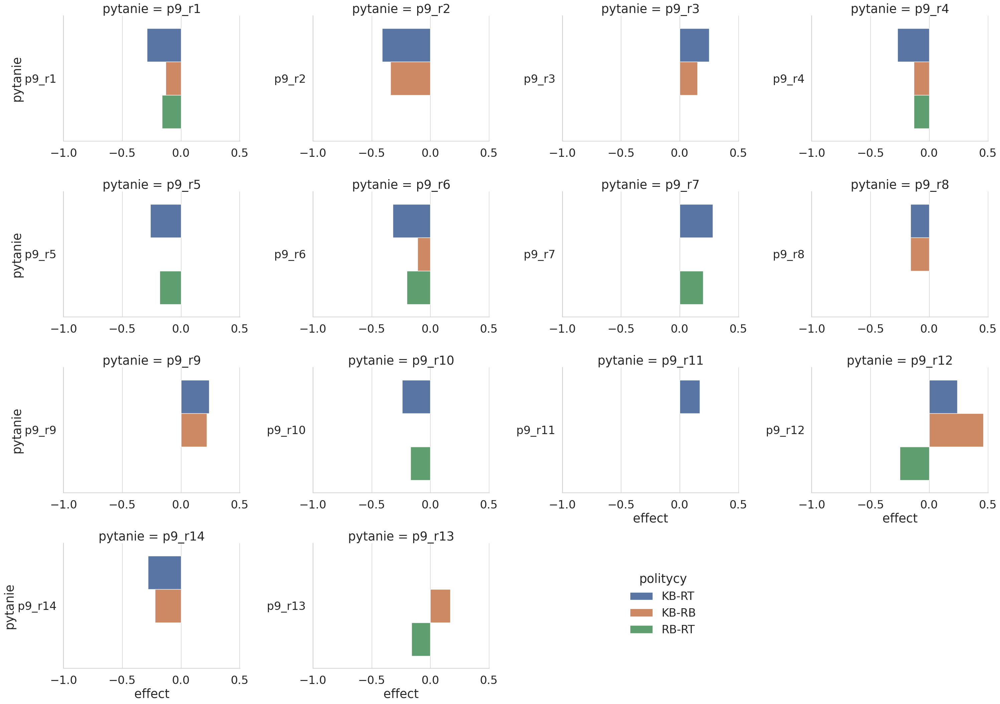

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'effect', hue = 'politycy', aspect=1.3, height = 5.5, col = 'pytanie', col_wrap = 4,
            sharey=False, )

g.set(xticks = np.arange(-1, 0.85, 0.5))
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True) 

sns.move_legend(g, loc = 'lower right', bbox_to_anchor = (0.7, 0.1))
plt.tight_layout(pad=1.5)
plt.show()

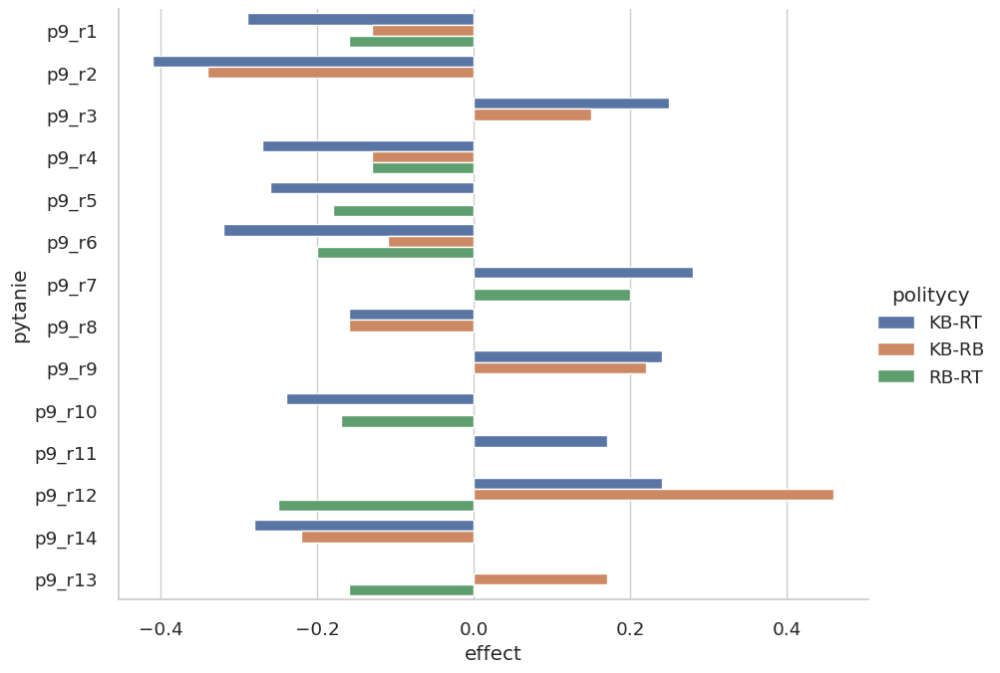

In [ ]:
sns.set(font_scale=1.2, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'effect', hue = 'politycy', aspect=1.3, height=7)
plt.show()

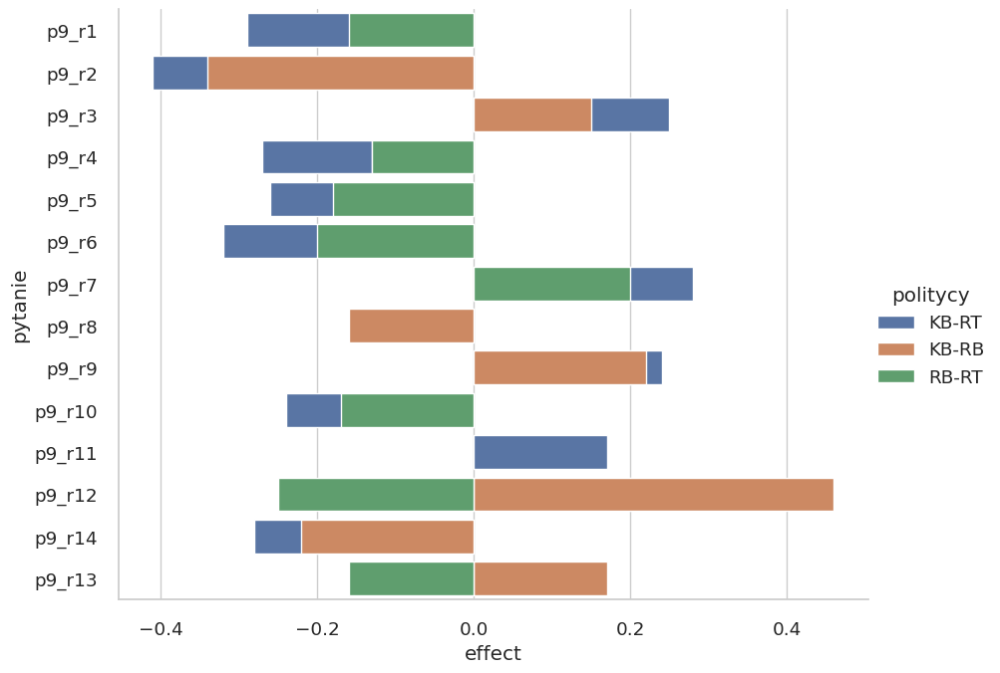

In [ ]:
sns.set(font_scale=1.2, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_po_dyfer_df[ttest_polityk_po_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'effect', hue = 'politycy', aspect=1.3, height=7, dodge = False)
plt.show()

###ttest_polityk_przed

In [ ]:
ttest_polityk_przed_dyfer_pol = []
ttest_polityk_przed_dyfer_pytanie = []
ttest_polityk_przed_dyfer_t = []
ttest_polityk_przed_dyfer_p = []
ttest_polityk_przed_dyfer_cd = []

In [ ]:
# KB-RT

print('KB-RT')
for d in dyfer_przed:
  pol1 = p3_KB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = mannwhitneyu(pol1, pol2) # , alternative='greater'
  cd = 1 - (2* value) / (len(pol1) * len(pol2))
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
    print('U: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print('U: ', value.round(3), 'p-value: ', p.round(4), "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)


print('\n ****************************')
# KB-RB

print(' KB-RB ')
for d in dyfer_przed:
  pol1 = p3_KB[d].values
  pol2 = p3_RB[d].values
  print(d)

  value, p = mannwhitneyu(pol1, pol2) # , alternative='greater'
  cd = 1 - (2* value) / (len(pol1) * len(pol2))
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
    print('U: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print('U: ', value.round(3), 'p-value: ', p.round(4), "\n")
  ttest_polityk_przed_dyfer_pol.append('KB-RB')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

print('\n ****************************')
# RB-RT

print(' RB-RT ')
for d in dyfer_przed:
  pol1 = p3_RB[d].values
  pol2 = p3_RT[d].values
  print(d)

  value, p = mannwhitneyu(pol1, pol2) # , alternative='greater'
  cd = 1 - (2* value) / (len(pol1) * len(pol2))
  cd = round(cd, 2)
  if round(p*2 , 2) < 0.05:
  #if round(p , 2) < 0.05:
    print("reject H0") 
    print('U: ', value.round(3), 'p-value: ', p.round(4), 'effect size: ', cd, "\n")
  else:
    print("do NOT reject H0")
    print('U: ', value.round(3), 'p-value: ', p.round(4), "\n")
  ttest_polityk_przed_dyfer_pol.append('RB-RT')
  ttest_polityk_przed_dyfer_pytanie.append(d)
  ttest_polityk_przed_dyfer_t.append(value.round(3))
  ttest_polityk_przed_dyfer_p.append(p.round(4))
  ttest_polityk_przed_dyfer_cd.append(cd)

KB-RT
p5_r1
reject H0
U:  64711.0 p-value:  0.0 effect size:  -0.26 

p5_r2
reject H0
U:  74909.5 p-value:  0.0 effect size:  -0.45 

p5_r3
reject H0
U:  40508.0 p-value:  0.0 effect size:  0.21 

p5_r4
reject H0
U:  64812.5 p-value:  0.0 effect size:  -0.26 

p5_r5
reject H0
U:  63526.0 p-value:  0.0 effect size:  -0.23 

p5_r6
reject H0
U:  66757.0 p-value:  0.0 effect size:  -0.3 

p5_r7
reject H0
U:  38640.0 p-value:  0.0 effect size:  0.25 

p5_r8
reject H0
U:  57345.5 p-value:  0.0108 effect size:  -0.11 

p5_r9
reject H0
U:  40454.0 p-value:  0.0 effect size:  0.21 

p5_r10
reject H0
U:  63258.5 p-value:  0.0 effect size:  -0.23 

p5_r11
reject H0
U:  45795.0 p-value:  0.0124 effect size:  0.11 

p5_r12
reject H0
U:  32123.5 p-value:  0.0 effect size:  0.38 

p5_r13
do NOT reject H0
U:  50416.5 p-value:  0.6248 

p5_r14
reject H0
U:  61530.0 p-value:  0.0 effect size:  -0.19 


 ****************************
 KB-RB 
p5_r1
reject H0
U:  56278.5 p-value:  0.0212 effect size:  -0.1 

In [ ]:
ttest_polityk_przed_dyfer_df = pd.DataFrame({
    'politycy':ttest_polityk_przed_dyfer_pol,
    'pytanie':ttest_polityk_przed_dyfer_pytanie,
    'u':ttest_polityk_przed_dyfer_t,
    'p':ttest_polityk_przed_dyfer_p,
    'effect':ttest_polityk_przed_dyfer_cd,

})

In [ ]:
ttest_polityk_przed_dyfer_df.head()

,politycy,pytanie,u,p,effect
0,KB-RT,p5_r1,64711.0,0.0,-0.26
1,KB-RT,p5_r2,74909.5,0.0,-0.45
2,KB-RT,p5_r3,40508.0,0.0,0.21
3,KB-RT,p5_r4,64812.5,0.0,-0.26
4,KB-RT,p5_r5,63526.0,0.0,-0.23


In [ ]:
#ttest_polityk_przed_dyfer_df.to_excel('ttest_polityk_przed_dyfer_df.xlsx')

ttest_polityk_przed_dyfer_df['p'] = ttest_polityk_przed_dyfer_df['p'] * 2
ttest_polityk_przed_dyfer_df['p'] = ttest_polityk_przed_dyfer_df['p'].round(2)

ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05]

In [ ]:
ttest_polityk_przed_dyfer_df = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05]

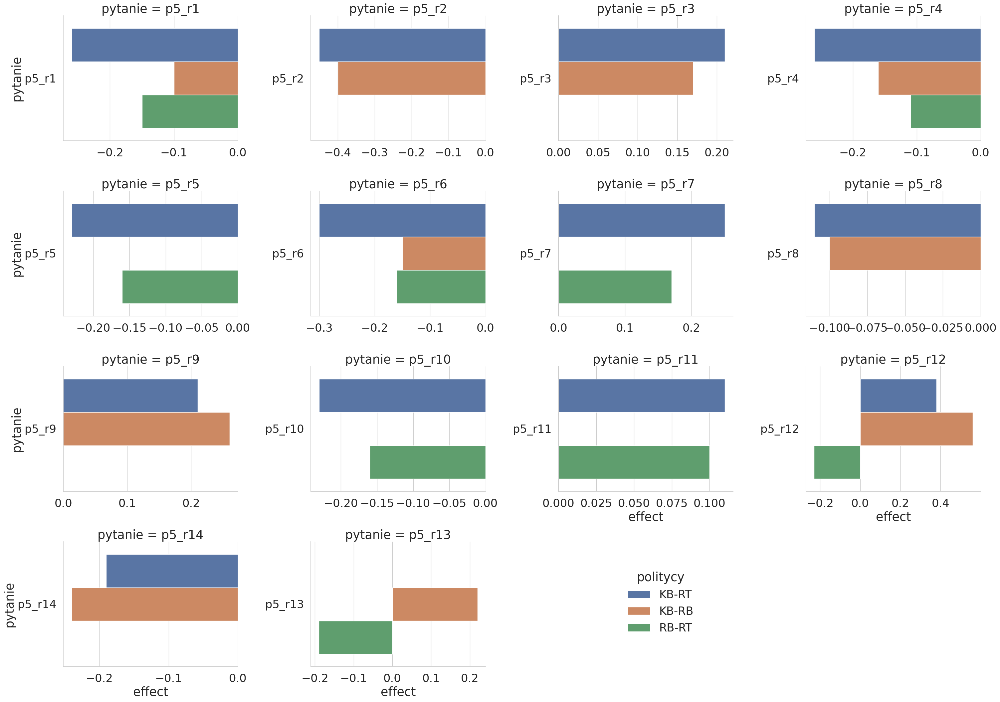

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'effect', hue = 'politycy', aspect=1.3, height = 5.5, col = 'pytanie', col_wrap = 4,
            sharey=False, sharex=False)

sns.move_legend(g, loc = 'lower right', bbox_to_anchor = (0.7, 0.1))
plt.tight_layout(pad=1.5)
plt.show()

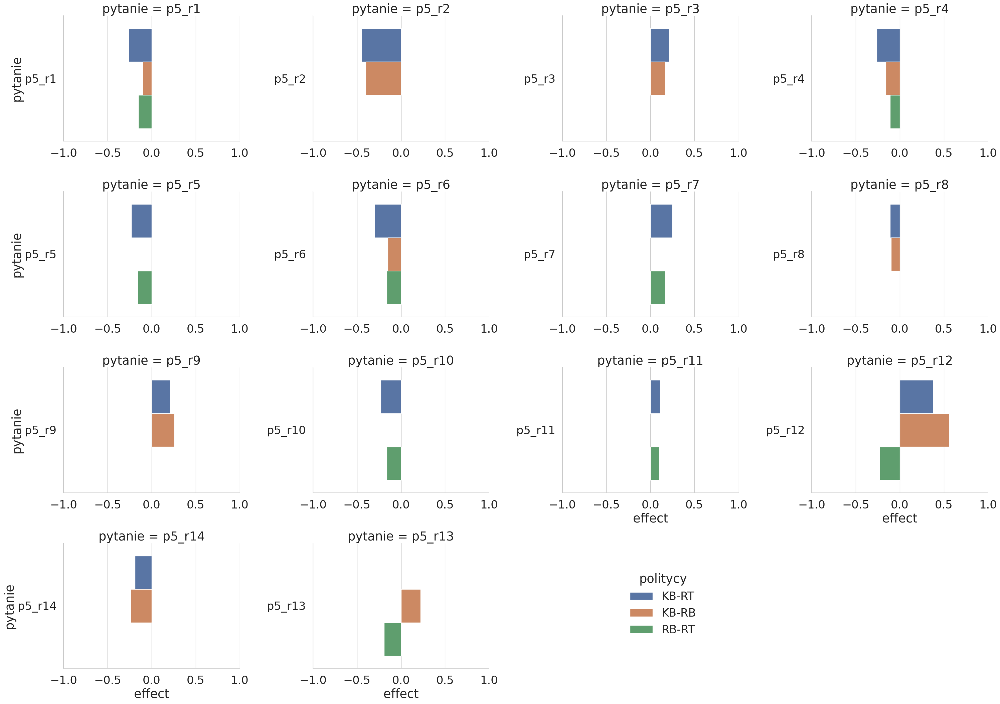

In [ ]:
sns.set(font_scale=2.2, style = 'whitegrid')
g = sns.catplot(kind = 'bar', data = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'effect', hue = 'politycy', aspect=1.3, height = 5.5, col = 'pytanie', col_wrap = 4,
            sharey=False, )

g.set(xticks = np.arange(-1, 1.05, 0.5))
for ax in g.axes.flatten():
    ax.tick_params(labelbottom=True) 

sns.move_legend(g, loc = 'lower right', bbox_to_anchor = (0.7, 0.1))
plt.tight_layout(pad=1.5)
plt.show()

In [ ]:
df.groupby('polityk')['p5_r13'].mean()

polityk
0    4.028213
1    3.944272
2    4.531646
Name: p5_r13, dtype: float64

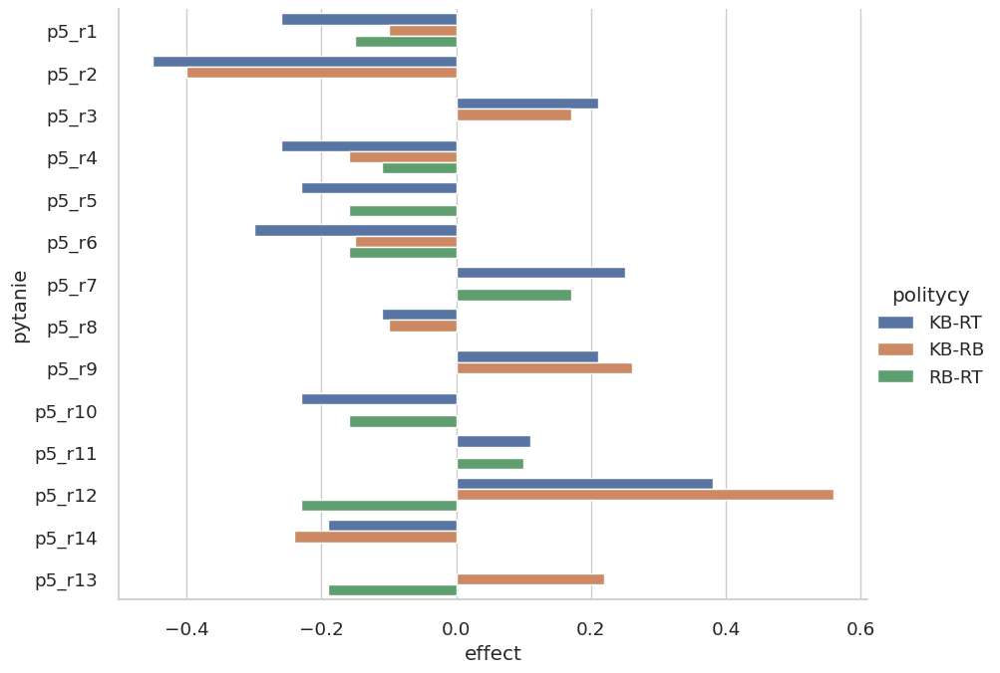

In [ ]:
sns.set(font_scale=1.2, style = 'whitegrid')

sns.catplot(kind = 'bar', data = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'effect', hue = 'politycy', aspect=1.3, height=7)
plt.show()

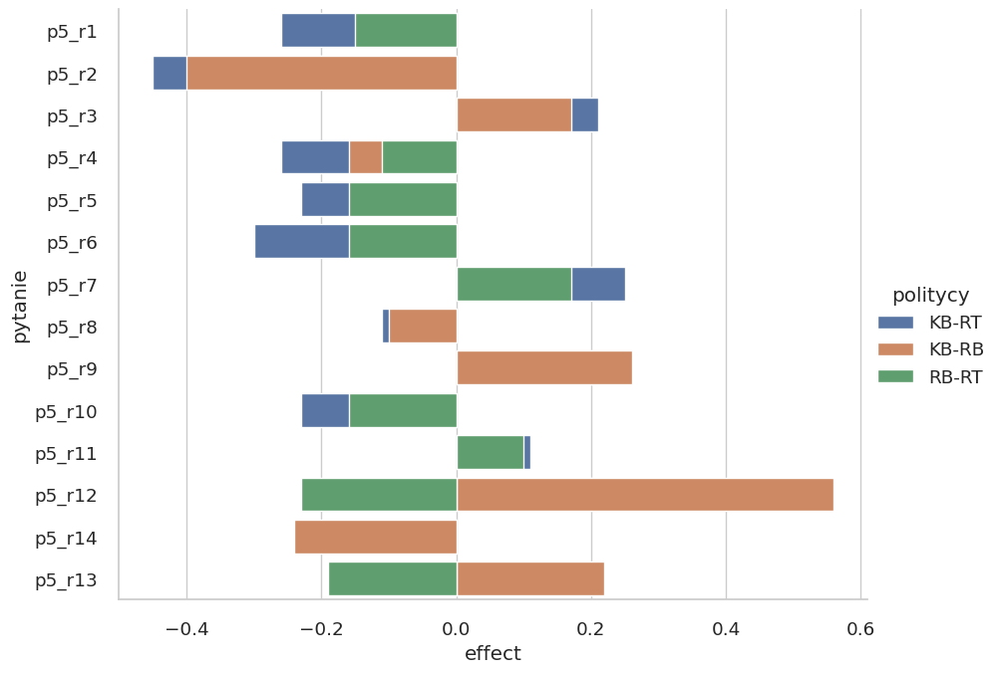

In [ ]:
sns.catplot(kind = 'bar', data = ttest_polityk_przed_dyfer_df[ttest_polityk_przed_dyfer_df['p'] < 0.05], 
            y = 'pytanie', x = 'effect', hue = 'politycy', aspect=1.3, height=7, dodge = False)
plt.show()

##wilcoxon

In [ ]:
from scipy.stats import wilcoxon

###pos-neg-neu

In [ ]:
cc

[('p5_r1', 'p9_r1'),
 ('p5_r2', 'p9_r2'),
 ('p5_r3', 'p9_r3'),
 ('p5_r4', 'p9_r4'),
 ('p5_r5', 'p9_r5'),
 ('p5_r6', 'p9_r6'),
 ('p5_r7', 'p9_r7'),
 ('p5_r8', 'p9_r8'),
 ('p5_r9', 'p9_r9'),
 ('p5_r10', 'p9_r10'),
 ('p5_r11', 'p9_r11'),
 ('p5_r12', 'p9_r12'),
 ('p5_r13', 'p9_r13'),
 ('p5_r14', 'p9_r14')]

In [ ]:
# pos

for d in cc:
  dprzed = p3_pos[d[0]].values
  dpo = p3_pos[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
3264.0 0.9997 

('p5_r2', 'p9_r2')
do NOT reject H0
3309.5 1.0 

('p5_r3', 'p9_r3')
reject H0
statistic:  5768.5 p-value:  0.0003 

('p5_r4', 'p9_r4')
do NOT reject H0
3646.5 0.997 

('p5_r5', 'p9_r5')
do NOT reject H0
3852.5 0.9999 

('p5_r6', 'p9_r6')
do NOT reject H0
2582.0 0.999 

('p5_r7', 'p9_r7')
reject H0
statistic:  5971.0 p-value:  0.0028 

('p5_r8', 'p9_r8')
do NOT reject H0
3646.5 0.9998 

('p5_r9', 'p9_r9')
reject H0
statistic:  7459.0 p-value:  0.0005 

('p5_r10', 'p9_r10')
do NOT reject H0
2901.5 0.9994 

('p5_r11', 'p9_r11')
do NOT reject H0
5642.0 0.194 

('p5_r12', 'p9_r12')
do NOT reject H0
2547.5 0.9999 

('p5_r13', 'p9_r13')
do NOT reject H0
4502.0 0.9566 

('p5_r14', 'p9_r14')
do NOT reject H0
3407.5 1.0 



In [ ]:
# neg

for d in cc_neg2:
  dprzed = p3_neg[d[0]].values
  dpo = p3_neg[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
7185.5 0.1597 

('p5_r2', 'p9_r2')
reject H0
statistic:  10783.0 p-value:  0.0 

('p5_r4', 'p9_r4')
do NOT reject H0
5542.5 0.4768 

('p5_r5', 'p9_r5')
do NOT reject H0
6384.0 0.4263 

('p5_r6', 'p9_r6')
reject H0
statistic:  7004.0 p-value:  0.04 

('p5_r8', 'p9_r8')
reject H0
statistic:  10427.0 p-value:  0.0 

('p5_r10', 'p9_r10')
do NOT reject H0
6697.0 0.1161 

('p5_r12', 'p9_r12')
reject H0
statistic:  5090.5 p-value:  0.0094 

('p5_r13', 'p9_r13')
do NOT reject H0
4814.0 0.9711 

('p5_r14', 'p9_r14')
reject H0
statistic:  11189.5 p-value:  0.0 



In [ ]:
# neu

for d in cc:
  dprzed = p3_neu[d[0]].values
  dpo = p3_neu[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
3725.0 0.8994 

('p5_r2', 'p9_r2')
do NOT reject H0
3876.0 0.5629 

('p5_r3', 'p9_r3')
reject H0
statistic:  4798.0 p-value:  0.0334 

('p5_r4', 'p9_r4')
do NOT reject H0
3366.0 0.9842 

('p5_r5', 'p9_r5')
do NOT reject H0
4804.0 0.9198 

('p5_r6', 'p9_r6')
do NOT reject H0
3202.0 0.9999 

('p5_r7', 'p9_r7')
do NOT reject H0
4480.0 0.192 

('p5_r8', 'p9_r8')
do NOT reject H0
4307.5 0.9307 

('p5_r9', 'p9_r9')
reject H0
statistic:  6558.0 p-value:  0.0001 

('p5_r10', 'p9_r10')
do NOT reject H0
4444.5 0.8862 

('p5_r11', 'p9_r11')
do NOT reject H0
4508.5 0.3283 

('p5_r12', 'p9_r12')
do NOT reject H0
2652.5 0.7742 

('p5_r13', 'p9_r13')
do NOT reject H0
4726.5 0.3794 

('p5_r14', 'p9_r14')
do NOT reject H0
4811.0 0.761 



###pos przed-po inside polityk

In [ ]:
wilcoxon(dpo, dprzed, alternative='greater', method = 'approx')

WilcoxonResult(statistic=710.5, pvalue=0.23428870963789433)

In [ ]:
# KB

for d in cc:
  dprzed = p3_pos_KB[d[0]].values
  dpo = p3_pos_KB[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
486.0 0.9027 

('p5_r2', 'p9_r2')
do NOT reject H0
404.0 0.9994 

('p5_r3', 'p9_r3')
do NOT reject H0
710.5 0.2343 

('p5_r4', 'p9_r4')
do NOT reject H0
526.5 0.9061 

('p5_r5', 'p9_r5')
do NOT reject H0
702.0 0.8894 

('p5_r6', 'p9_r6')
do NOT reject H0
364.5 0.9105 

('p5_r7', 'p9_r7')
do NOT reject H0
564.0 0.3964 

('p5_r8', 'p9_r8')
do NOT reject H0
632.5 0.8382 

('p5_r9', 'p9_r9')
do NOT reject H0
1039.0 0.0736 

('p5_r10', 'p9_r10')
do NOT reject H0
510.0 0.8526 

('p5_r11', 'p9_r11')
do NOT reject H0
647.0 0.9266 

('p5_r12', 'p9_r12')
do NOT reject H0
518.0 0.9164 

('p5_r13', 'p9_r13')
do NOT reject H0
650.5 0.8461 

('p5_r14', 'p9_r14')
do NOT reject H0
493.0 0.9645 



In [ ]:
# RB

for d in cc:
  dprzed = p3_pos_RB[d[0]].values
  dpo = p3_pos_RB[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
371.5 0.9955 

('p5_r2', 'p9_r2')
do NOT reject H0
380.5 0.9784 

('p5_r3', 'p9_r3')
reject H0
statistic:  633.0 p-value:  0.0222 

('p5_r4', 'p9_r4')
do NOT reject H0
381.5 0.9411 

('p5_r5', 'p9_r5')
do NOT reject H0
365.5 0.9846 

('p5_r6', 'p9_r6')
do NOT reject H0
332.5 0.9849 

('p5_r7', 'p9_r7')
reject H0
statistic:  889.0 p-value:  0.0141 

('p5_r8', 'p9_r8')
do NOT reject H0
268.5 1.0 

('p5_r9', 'p9_r9')
reject H0
statistic:  989.5 p-value:  0.0063 

('p5_r10', 'p9_r10')
do NOT reject H0
286.0 0.9969 

('p5_r11', 'p9_r11')
do NOT reject H0
691.0 0.2107 

('p5_r12', 'p9_r12')
do NOT reject H0
188.5 0.9896 

('p5_r13', 'p9_r13')
do NOT reject H0
323.0 0.9791 

('p5_r14', 'p9_r14')
do NOT reject H0
441.0 0.9397 



In [ ]:
# RT

for d in cc:
  dprzed = p3_pos_RT[d[0]].values
  dpo = p3_pos_RT[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
257.0 0.9838 

('p5_r2', 'p9_r2')
do NOT reject H0
350.5 0.9838 

('p5_r3', 'p9_r3')
reject H0
statistic:  612.0 p-value:  0.0001 

('p5_r4', 'p9_r4')
do NOT reject H0
335.0 0.9725 

('p5_r5', 'p9_r5')
do NOT reject H0
270.5 0.9996 

('p5_r6', 'p9_r6')
do NOT reject H0
191.0 0.9698 

('p5_r7', 'p9_r7')
reject H0
statistic:  589.5 p-value:  0.0052 

('p5_r8', 'p9_r8')
do NOT reject H0
329.5 0.9122 

('p5_r9', 'p9_r9')
reject H0
statistic:  545.0 p-value:  0.031 

('p5_r10', 'p9_r10')
do NOT reject H0
208.0 0.9785 

('p5_r11', 'p9_r11')
reject H0
statistic:  556.0 p-value:  0.0026 

('p5_r12', 'p9_r12')
do NOT reject H0
182.0 0.9996 

('p5_r13', 'p9_r13')
do NOT reject H0
571.0 0.4701 

('p5_r14', 'p9_r14')
do NOT reject H0
209.0 0.9999 



###neg przed-po inside polityk

In [ ]:
# KB

for d in cc_neg2:
  dprzed = p3_neg_KB[d[0]].values
  dpo = p3_neg_KB[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
1007.0 0.1175 

('p5_r2', 'p9_r2')
reject H0
statistic:  1223.0 p-value:  0.0001 

('p5_r4', 'p9_r4')
do NOT reject H0
707.5 0.431 

('p5_r5', 'p9_r5')
do NOT reject H0
990.0 0.2059 

('p5_r6', 'p9_r6')
do NOT reject H0
860.0 0.1502 

('p5_r8', 'p9_r8')
reject H0
statistic:  1467.5 p-value:  0.0002 

('p5_r10', 'p9_r10')
do NOT reject H0
724.5 0.2769 

('p5_r12', 'p9_r12')
reject H0
statistic:  1037.0 p-value:  0.0 

('p5_r13', 'p9_r13')
do NOT reject H0
521.0 0.7633 

('p5_r14', 'p9_r14')
reject H0
statistic:  1429.5 p-value:  0.0001 



In [ ]:
# RB

for d in cc_neg2:
  dprzed = p3_neg_RB[d[0]].values
  dpo = p3_neg_RB[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
914.0 0.2397 

('p5_r2', 'p9_r2')
reject H0
statistic:  1759.0 p-value:  0.0001 

('p5_r4', 'p9_r4')
do NOT reject H0
926.0 0.1422 

('p5_r5', 'p9_r5')
do NOT reject H0
849.5 0.4255 

('p5_r6', 'p9_r6')
reject H0
statistic:  1060.5 p-value:  0.0149 

('p5_r8', 'p9_r8')
reject H0
statistic:  1229.0 p-value:  0.0 

('p5_r10', 'p9_r10')
do NOT reject H0
1136.0 0.0475 

('p5_r12', 'p9_r12')
do NOT reject H0
526.0 0.3557 

('p5_r13', 'p9_r13')
do NOT reject H0
729.0 0.7858 

('p5_r14', 'p9_r14')
reject H0
statistic:  1713.0 p-value:  0.0011 



In [ ]:
# RT

for d in cc_neg2:
  dprzed = p3_neg_RT[d[0]].values
  dpo = p3_neg_RT[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
538.0 0.6124 

('p5_r2', 'p9_r2')
reject H0
statistic:  754.0 p-value:  0.0029 

('p5_r4', 'p9_r4')
do NOT reject H0
311.0 0.9151 

('p5_r5', 'p9_r5')
do NOT reject H0
385.0 0.8061 

('p5_r6', 'p9_r6')
do NOT reject H0
475.5 0.6877 

('p5_r8', 'p9_r8')
reject H0
statistic:  829.5 p-value:  0.0275 

('p5_r10', 'p9_r10')
do NOT reject H0
461.5 0.6554 

('p5_r12', 'p9_r12')
do NOT reject H0
205.0 0.9712 

('p5_r13', 'p9_r13')
do NOT reject H0
397.0 0.9658 

('p5_r14', 'p9_r14')
do NOT reject H0
718.0 0.0859 



###neu przed-po inside polityk

In [ ]:
# KB

for d in cc:
  dprzed = p3_neu_KB[d[0]].values
  dpo = p3_neu_KB[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
488.0 0.7248 

('p5_r2', 'p9_r2')
do NOT reject H0
417.0 0.8284 

('p5_r3', 'p9_r3')
do NOT reject H0
773.5 0.0489 

('p5_r4', 'p9_r4')
do NOT reject H0
532.5 0.9811 

('p5_r5', 'p9_r5')
do NOT reject H0
483.5 0.975 

('p5_r6', 'p9_r6')
do NOT reject H0
328.5 0.999 

('p5_r7', 'p9_r7')
do NOT reject H0
866.5 0.0824 

('p5_r8', 'p9_r8')
do NOT reject H0
757.5 0.4475 

('p5_r9', 'p9_r9')
reject H0
statistic:  981.5 p-value:  0.0026 

('p5_r10', 'p9_r10')
do NOT reject H0
588.0 0.9213 

('p5_r11', 'p9_r11')
do NOT reject H0
739.5 0.5108 

('p5_r12', 'p9_r12')
reject H0
statistic:  625.0 p-value:  0.0298 

('p5_r13', 'p9_r13')
do NOT reject H0
761.0 0.1136 

('p5_r14', 'p9_r14')
do NOT reject H0
723.5 0.1909 



In [ ]:
# RB

for d in cc:
  dprzed = p3_neu_RB[d[0]].values
  dpo = p3_neu_RB[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
300.5 0.7001 

('p5_r2', 'p9_r2')
do NOT reject H0
421.0 0.4383 

('p5_r3', 'p9_r3')
do NOT reject H0
399.0 0.3325 

('p5_r4', 'p9_r4')
do NOT reject H0
274.5 0.8312 

('p5_r5', 'p9_r5')
do NOT reject H0
568.0 0.5836 

('p5_r6', 'p9_r6')
do NOT reject H0
437.5 0.882 

('p5_r7', 'p9_r7')
do NOT reject H0
234.0 0.4872 

('p5_r8', 'p9_r8')
do NOT reject H0
283.0 0.9857 

('p5_r9', 'p9_r9')
reject H0
statistic:  665.0 p-value:  0.043 

('p5_r10', 'p9_r10')
do NOT reject H0
410.5 0.848 

('p5_r11', 'p9_r11')
do NOT reject H0
412.5 0.3721 

('p5_r12', 'p9_r12')
do NOT reject H0
75.0 0.9746 

('p5_r13', 'p9_r13')
do NOT reject H0
363.5 0.8717 

('p5_r14', 'p9_r14')
do NOT reject H0
472.0 0.2882 



In [ ]:
# RT

for d in cc:
  dprzed = p3_neu_RT[d[0]].values
  dpo = p3_neu_RT[d[1]].values
  print(d)

  value, p = wilcoxon(dpo, dprzed, alternative='greater') # , alternative='greater'
  #if round(p*2 , 2) < 0.05:
  if round(p , 2) < 0.05:
    print("reject H0") 
    print('statistic: ', value.round(3), 'p-value: ', p.round(4), "\n")
  else:
    print("do NOT reject H0")
    print(value, p.round(4), "\n")

('p5_r1', 'p9_r1')
do NOT reject H0
487.0 0.8568 

('p5_r2', 'p9_r2')
do NOT reject H0
470.5 0.2947 

('p5_r3', 'p9_r3')
do NOT reject H0
476.0 0.18 

('p5_r4', 'p9_r4')
do NOT reject H0
343.5 0.7467 

('p5_r5', 'p9_r5')
do NOT reject H0
559.0 0.6199 

('p5_r6', 'p9_r6')
do NOT reject H0
316.0 0.9844 

('p5_r7', 'p9_r7')
do NOT reject H0
513.5 0.5187 

('p5_r8', 'p9_r8')
do NOT reject H0
447.5 0.7934 

('p5_r9', 'p9_r9')
reject H0
statistic:  603.0 p-value:  0.0264 

('p5_r10', 'p9_r10')
do NOT reject H0
494.0 0.3971 

('p5_r11', 'p9_r11')
do NOT reject H0
406.0 0.2959 

('p5_r12', 'p9_r12')
do NOT reject H0
306.5 0.95 

('p5_r13', 'p9_r13')
do NOT reject H0
484.0 0.4451 

('p5_r14', 'p9_r14')
do NOT reject H0
430.5 0.9928 



##anova

In [ ]:
# https://www.statology.org/three-way-anova-python/

# Three-Way ANOVA in Python

# 1 factor - polityk
# 2 factor - stimulus
# 3 factor - zgodnosc pogladów

### distributions

In [ ]:
df.sample(2)

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,diff_r1,diff_r2,diff_r3,diff_r4,diff_r5,diff_r6,diff_r7,diff_r8,diff_r9,diffr10,diffr11,diffr12,diffr13,diffr14
473,474,4712,1,NaN,NaN,5,54,5,4,1,2,1,1.0,7,1,1,1,3,1,7,1,1,5,5,1,5,1,2,7,1,1,1,3,1,7,1,1,5,5,1,5,1,7,1,1,1,3,1,7,1,1,5,5,1,5,1
574,575,525,1,NaN,NaN,6,58,3,3,1,9,1,4.0,2,1,4,3,2,2,6,3,4,2,6,4,3,4,2,2,1,4,3,2,2,6,3,4,2,6,4,3,4,2,1,4,3,2,2,6,3,4,2,6,4,3,4


In [ ]:
df.p4_r1.value_counts()

3.0    310
1.0    215
4.0    179
2.0    147
5.0     95
Name: p4_r1, dtype: int64

In [ ]:
df.p4_r1.isna().sum()

12

<Axes: >

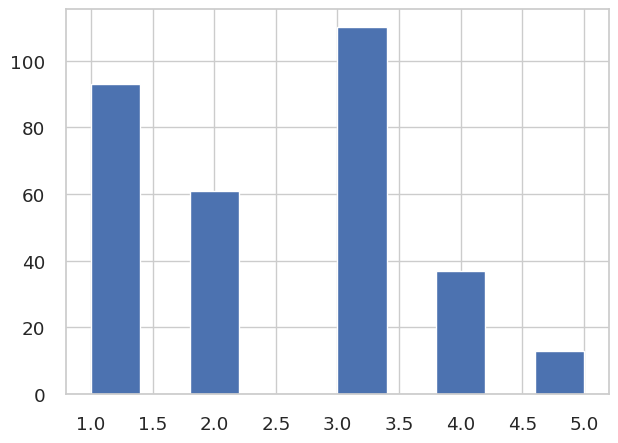

In [431]:
p3_KB.p4_r1.hist(figsize=(7,5))

<Axes: >

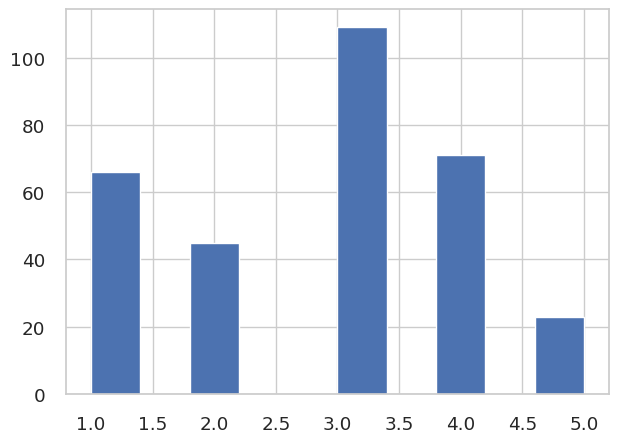

In [433]:
p3_RB.p4_r1.hist(figsize=(7,5))

<Axes: >

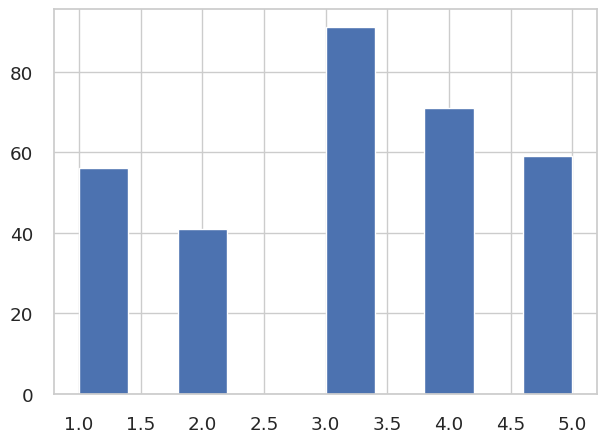

In [432]:
p3_RT.p4_r1.hist(figsize=(7,5))

<Axes: >

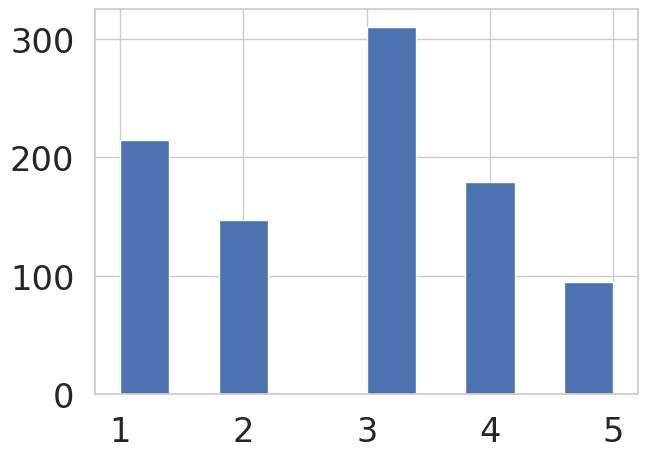

In [ ]:
df.p4_r1.hist(figsize=(7,5))

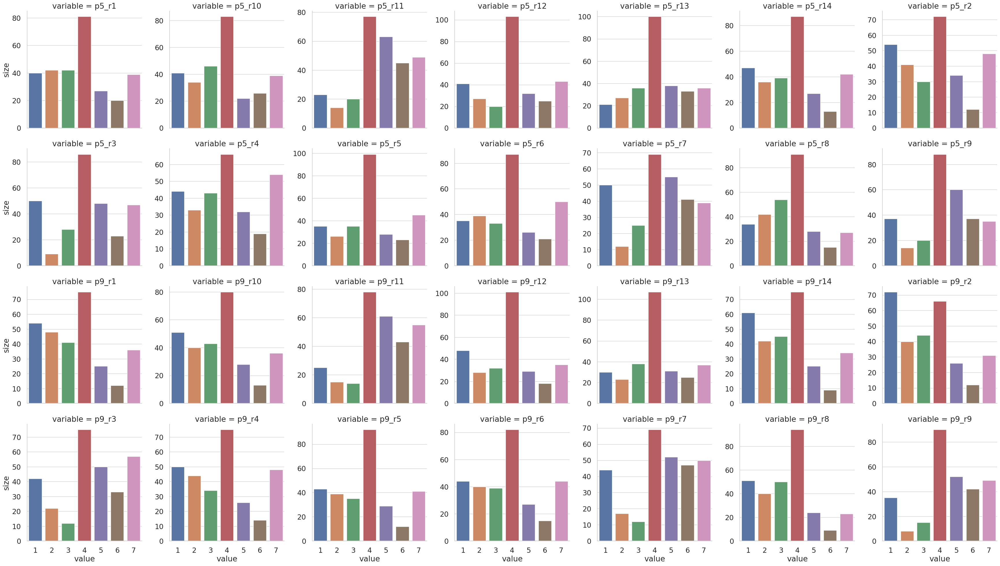

In [463]:
sns.set(font_scale=1.6, style = 'whitegrid')

df_melt = p3_pos[['ID']+dyfer]
df_melt = df_melt.melt('ID')
df_melt_grp = df_melt.groupby(['variable', 'value'], as_index = False).size()
g = sns.catplot(kind = 'bar', data = df_melt_grp, x = 'value', col = 'variable', y = 'size', col_wrap = 7, sharey=False)
plt.show()

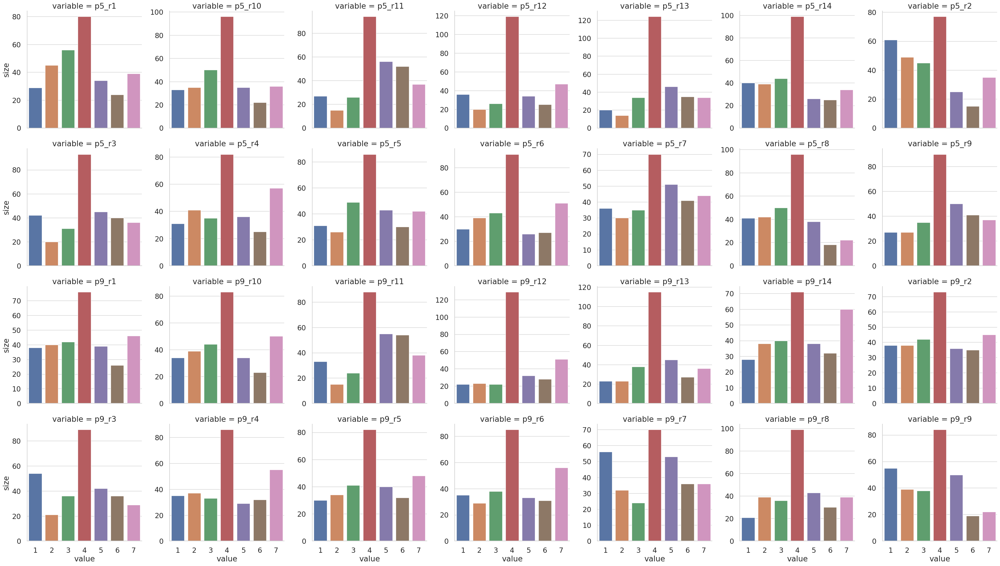

In [462]:
sns.set(font_scale=1.6, style = 'whitegrid')

df_melt = p3_neg[['ID']+dyfer]
df_melt = df_melt.melt('ID')
df_melt_grp = df_melt.groupby(['variable', 'value'], as_index = False).size()
g = sns.catplot(kind = 'bar', data = df_melt_grp, x = 'value', col = 'variable', y = 'size', col_wrap = 7, sharey=False)
plt.show()

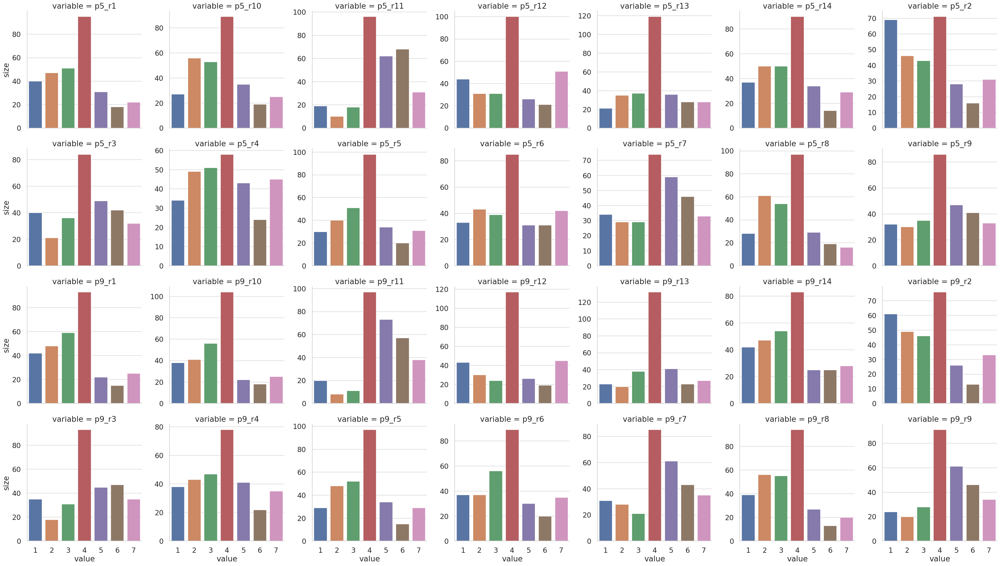

In [461]:
sns.set(font_scale=1.6, style = 'whitegrid')

df_melt = p3_neu[['ID']+dyfer]
df_melt = df_melt.melt('ID')
df_melt_grp = df_melt.groupby(['variable', 'value'], as_index = False).size()
g = sns.catplot(kind = 'bar', data = df_melt_grp, x = 'value', col = 'variable', y = 'size', col_wrap = 7, sharey=False)
plt.show()

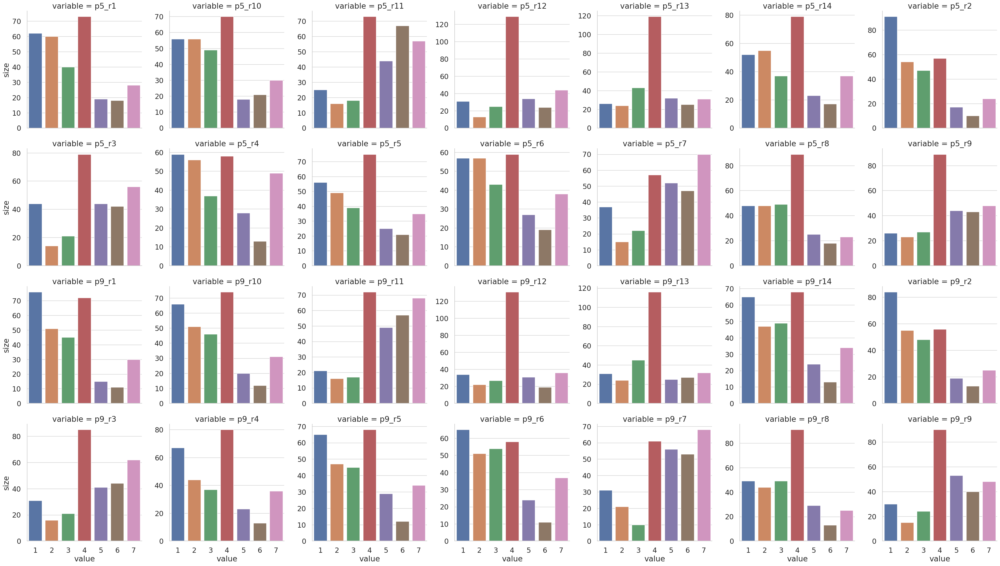

In [464]:
sns.set(font_scale=1.6, style = 'whitegrid')

df_melt = p3_RT[['ID']+dyfer]
df_melt = df_melt.melt('ID')
df_melt_grp = df_melt.groupby(['variable', 'value'], as_index = False).size()
g = sns.catplot(kind = 'bar', data = df_melt_grp, x = 'value', col = 'variable', y = 'size', col_wrap = 7, sharey=False)
plt.show()

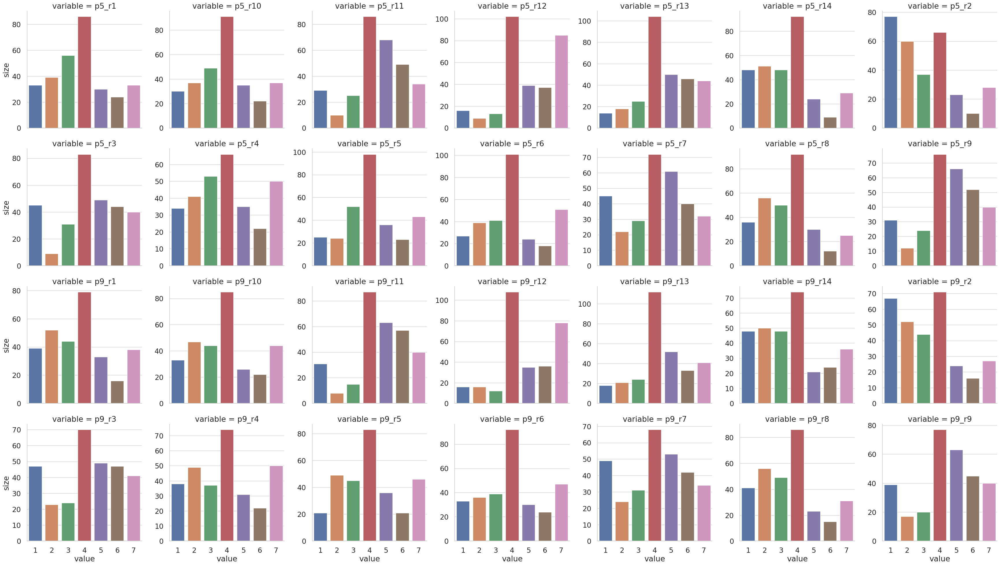

In [465]:
sns.set(font_scale=1.6, style = 'whitegrid')

df_melt = p3_RB[['ID']+dyfer]
df_melt = df_melt.melt('ID')
df_melt_grp = df_melt.groupby(['variable', 'value'], as_index = False).size()
g = sns.catplot(kind = 'bar', data = df_melt_grp, x = 'value', col = 'variable', y = 'size', col_wrap = 7, sharey=False)
plt.show()

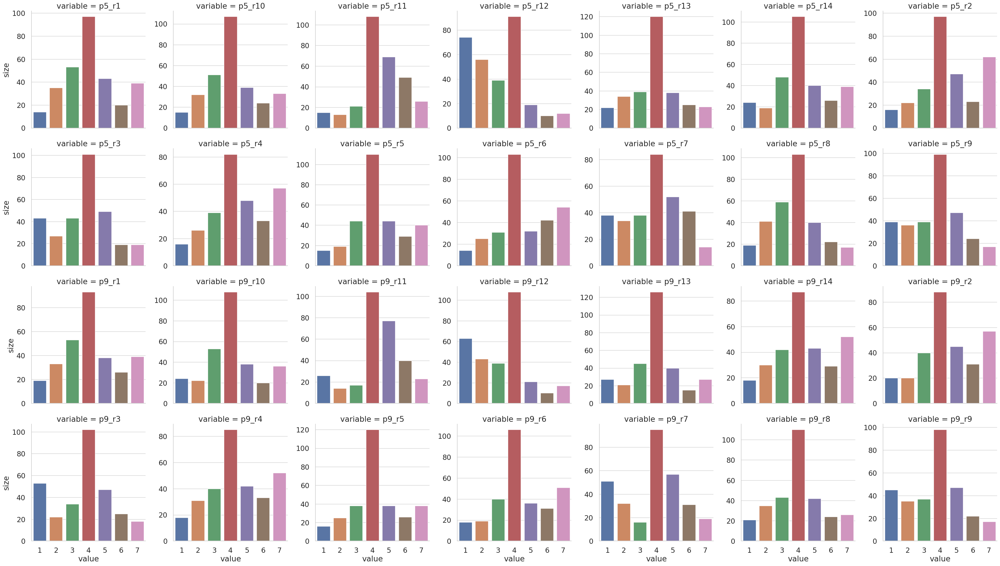

In [466]:
sns.set(font_scale=1.6, style = 'whitegrid')

df_melt = p3_KB[['ID']+dyfer]
df_melt = df_melt.melt('ID')
df_melt_grp = df_melt.groupby(['variable', 'value'], as_index = False).size()
g = sns.catplot(kind = 'bar', data = df_melt_grp, x = 'value', col = 'variable', y = 'size', col_wrap = 7, sharey=False)
plt.show()

In [ ]:
df_melt = df[['ID']+dyfer]
df_melt = df_melt.melt('ID')
df_melt

,ID,variable,value
0,1,p5_r1,1
1,2,p5_r1,4
2,3,p5_r1,5
3,4,p5_r1,1
4,5,p5_r1,4
...,...,...,...
26819,954,p9_r14,1
26820,955,p9_r14,4
26821,956,p9_r14,4
26822,957,p9_r14,2


In [ ]:
df_melt_grp = df_melt.groupby(['variable', 'value'], as_index = False).size()
df_melt_grp

,variable,value,size
0,p5_r1,1,110
1,p5_r1,2,134
2,p5_r1,3,153
3,p5_r1,4,302
4,p5_r1,5,94
...,...,...,...
191,p9_r9,3,92
192,p9_r9,4,312
193,p9_r9,5,158
194,p9_r9,6,119


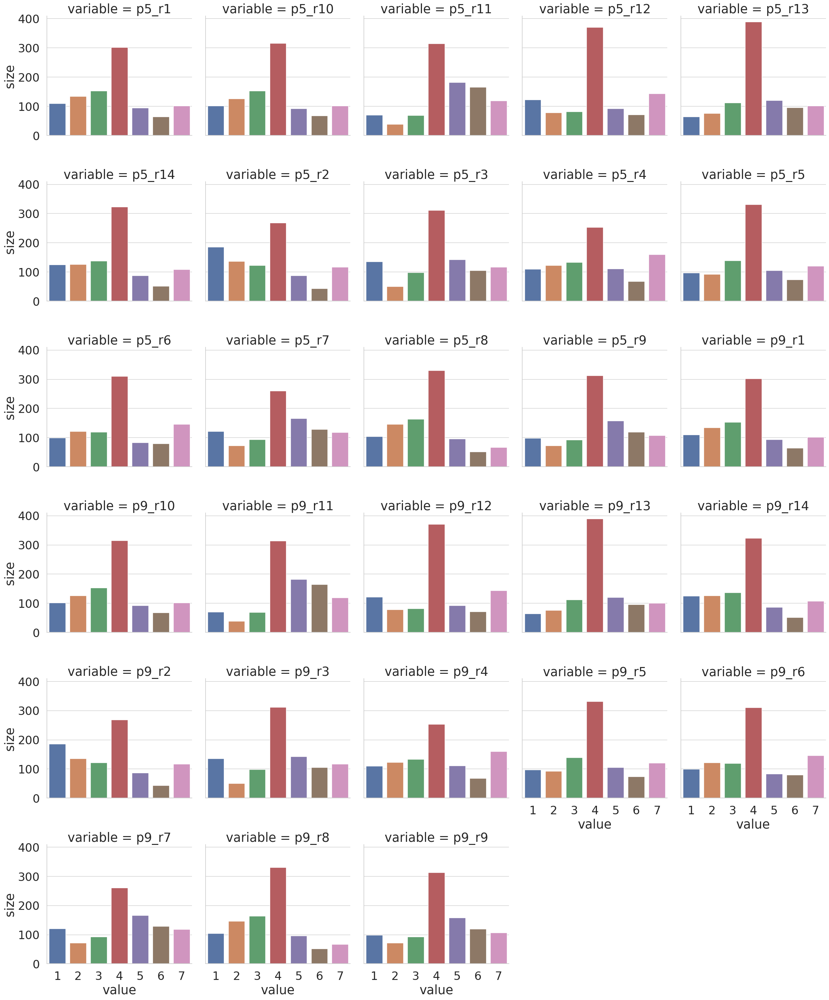

In [ ]:
sns.catplot(kind = 'bar', data = df_melt_grp, x = 'value', col = 'variable', y = 'size', col_wrap = 5)
plt.show()

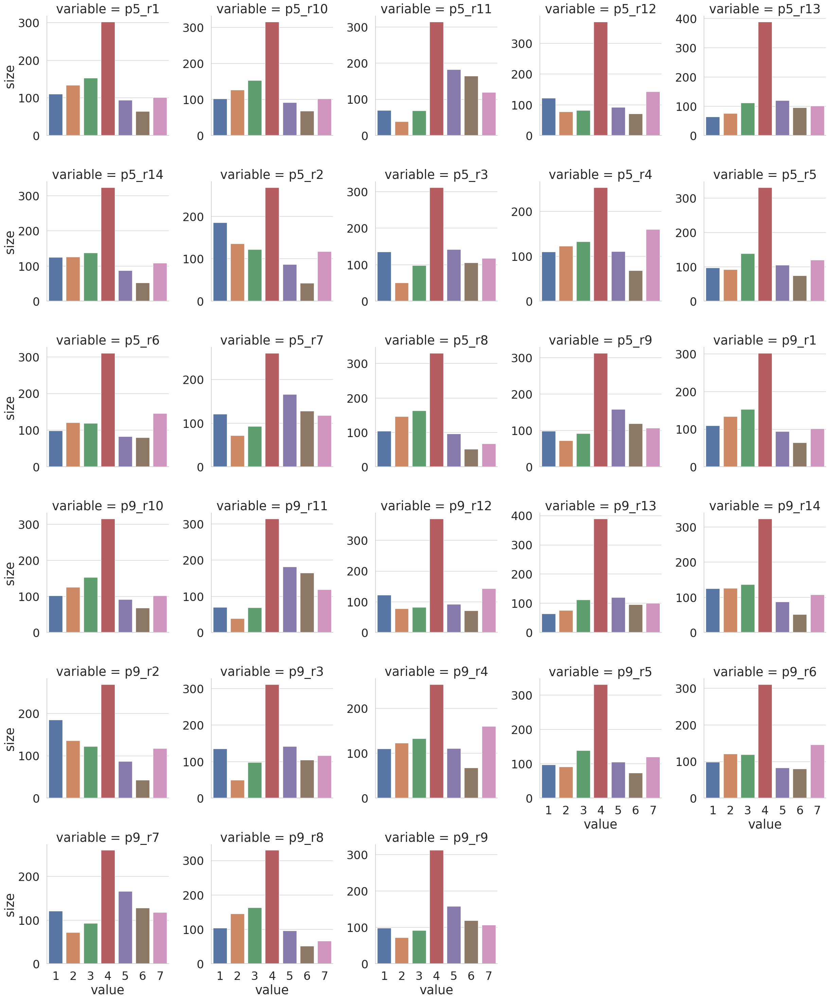

In [ ]:
sns.catplot(kind = 'bar', data = df_melt_grp, x = 'value', col = 'variable', y = 'size', col_wrap = 5, sharey = False)
plt.show()

### calculate

In [ ]:
df.p4_r1 = df.p4_r1.fillna(3)

In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [ ]:
dyfer_po

In [ ]:
df['stimulus'].value_counts()

2    323
0    323
1    312
Name: stimulus, dtype: int64

In [ ]:
# kb - 1;  rb  - 2;  rt  - 0
df['polityk'].value_counts()

1    323
0    319
2    316
Name: polityk, dtype: int64

In [ ]:
df.sample()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,diff_r1,diff_r2,diff_r3,diff_r4,diff_r5,diff_r6,diff_r7,diff_r8,diff_r9,diffr10,diffr11,diffr12,diffr13,diffr14,stimulus,polityk,avg_neg,avg_pos,sum_neg,sum_pos,avg_neg_przed,avg_pos_przed,sum_neg_przed,sum_pos_przed,avg_neg_po,avg_pos_po,sum_neg_po,sum_pos_po
557,558,14347,1,NaN,NaN,2,20,2,3,1,7,1,4.0,3,2,6,2,2,2,6,3,5,3,6,5,4,2,2,3,2,6,2,2,2,6,3,5,3,6,5,4,2,3,2,6,2,2,2,6,3,5,3,6,5,4,2,2,0,2.8,5.75,56,46,2.8,5.75,28,23,2.8,5.75,28,23


In [ ]:
df.columns[-15:]

Index(['diffr14', 'stimulus', 'polityk', 'avg_neg', 'avg_pos', 'sum_neg',
       'sum_pos', 'avg_neg_przed', 'avg_pos_przed', 'sum_neg_przed',
       'sum_pos_przed', 'avg_neg_po', 'avg_pos_po', 'sum_neg_po',
       'sum_pos_po'],
      dtype='object')

In [ ]:
#perform three-way ANOVA
model = ols("""p9_r1 ~ C(p4_r1) + C(polityk) + C(stimulus) +
               C(p4_r1):C(polityk) + C(p4_r1):C(stimulus) + C(polityk):C(stimulus) +
               C(p4_r1):C(polityk):C(stimulus)""", data = df).fit()

sm.stats.anova_lm(model, typ=2)

,sum_sq,df,F,PR(>F)
C(p4_r1),738.397881,4.0,86.689876,1.888968e-62
C(polityk),14.143982,2.0,3.321082,3.655052e-02
C(stimulus),19.045936,2.0,4.472087,1.167479e-02
C(p4_r1):C(polityk),21.985351,8.0,1.290569,2.445791e-01
C(p4_r1):C(stimulus),20.801253,8.0,1.221061,2.831257e-01
C(polityk):C(stimulus),3.868431,4.0,0.454164,7.694004e-01
C(p4_r1):C(polityk):C(stimulus),39.648424,16.0,1.163708,2.914340e-01
Residual,1944.163765,913.0,NaN,NaN


In [ ]:
sm.stats.anova_lm(model, typ=2).round(2)

,sum_sq,df,F,PR(>F)
C(p4_r1),738.40,4.0,86.69,0.00
C(polityk),14.14,2.0,3.32,0.04
C(stimulus),19.05,2.0,4.47,0.01
C(p4_r1):C(polityk),21.99,8.0,1.29,0.24
C(p4_r1):C(stimulus),20.80,8.0,1.22,0.28
C(polityk):C(stimulus),3.87,4.0,0.45,0.77
C(p4_r1):C(polityk):C(stimulus),39.65,16.0,1.16,0.29
Residual,1944.16,913.0,NaN,NaN


In [ ]:
# https://www.statology.org/anova-post-hoc-tests/  t-test w bonferroni correction

# Tukey test is the preferred post-hoc test but Bonferroni has more power when the number of comparisons is small. 
# Tukey is rrecommended and more powerful when testing large numbers of means.
# The Bonferroni test also tends to be overly conservative, which reduces its statistical power.
# https://www.researchgate.net/post/Which_post_hoc_test_is_better_Tukey_HSD_or_Bonfferoni

In [ ]:
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [ ]:
# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['p9_r2'],
                          groups = df['polityk'],
                          alpha=0.05)
#display results
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1   1.4642    0.0  1.1338 1.7947   True
     0      2    0.152 0.5305 -0.1803 0.4843  False
     1      2  -1.3122    0.0 -1.6435 -0.981   True
---------------------------------------------------


In [ ]:
# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['p9_r1'],
                          groups = df['p4_r1'],
                          alpha=0.05)
#display results
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
   1.0    2.0  -1.1903    0.0 -1.6209 -0.7598   True
   1.0    3.0  -1.4656    0.0 -1.8199 -1.1112   True
   1.0    4.0  -2.4393    0.0 -2.8464 -2.0322   True
   1.0    5.0  -2.8399    0.0 -3.3356 -2.3442   True
   2.0    3.0  -0.2752 0.3298 -0.6757  0.1253  False
   2.0    4.0   -1.249    0.0 -1.6968 -0.8011   True
   2.0    5.0  -1.6496    0.0 -2.1792 -1.1199   True
   3.0    4.0  -0.9737    0.0 -1.3489 -0.5986   True
   3.0    5.0  -1.3743    0.0 -1.8441 -0.9046   True
   4.0    5.0  -0.4006 0.2025 -0.9113  0.1101  False
----------------------------------------------------


In [ ]:
df['polityk_p4'] = df.polityk.astype('str') + "_" + df.p4_r1.astype('int').astype('str')
df['polityk_p4']

In [ ]:
dep_vars = ['avg_neg', 'avg_pos', 'sum_neg',
       'sum_pos', 'avg_neg_po', 'avg_pos_po', 'sum_neg_po','sum_pos_po', 
       'avg_neg_przed', 'avg_pos_przed', 'sum_neg_przed','sum_pos_przed', ]

In [ ]:
for dep in ['avg_neg_przed', 'avg_pos_przed', 'sum_neg_przed', 'sum_pos_przed',]:
  print(dep)
  model = ols(f"""{dep} ~ C(p4_r1) + C(polityk) +
               C(p4_r1):C(polityk)""", data = df).fit()

  print(sm.stats.anova_lm(model, typ=2).round(4))
  print('\n ********************************')

avg_neg_przed
                        sum_sq     df         F  PR(>F)
C(p4_r1)              630.6054    4.0  144.7896  0.0000
C(polityk)              3.5260    2.0    1.6192  0.1986
C(p4_r1):C(polityk)    24.7246    8.0    2.8384  0.0041
Residual             1026.7669  943.0       NaN     NaN

 ********************************
avg_pos_przed
                        sum_sq     df         F  PR(>F)
C(p4_r1)             1054.3420    4.0  260.2134  0.0000
C(polityk)              0.2494    2.0    0.1231  0.8842
C(p4_r1):C(polityk)    36.4629    8.0    4.4995  0.0000
Residual              955.2204  943.0       NaN     NaN

 ********************************
sum_neg_przed
                          sum_sq     df         F  PR(>F)
C(p4_r1)              63060.5404    4.0  144.7896  0.0000
C(polityk)              352.6005    2.0    1.6192  0.1986
C(p4_r1):C(polityk)    2472.4573    8.0    2.8384  0.0041
Residual             102676.6929  943.0       NaN     NaN

 ********************************
sum

In [502]:
print(f''' {df.groupby(['polityk', 'p4_r1']).avg_pos_przed.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).avg_neg_przed.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).sum_neg_przed.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).sum_pos_przed.mean().round(3)}''')

 polityk  p4_r1
0        1.0      2.222
         2.0      3.711
         3.0      4.472
         4.0      5.415
         5.0      6.325
1        1.0      2.954
         2.0      3.970
         3.0      4.158
         4.0      5.139
         5.0      6.096
2        1.0      2.581
         2.0      4.119
         3.0      4.525
         4.0      5.292
         5.0      5.728
Name: avg_pos_przed, dtype: float64 
 
polityk  p4_r1
0        1.0      5.476
         2.0      4.211
         3.0      3.725
         4.0      2.799
         5.0      2.011
1        1.0      4.929
         2.0      4.025
         3.0      3.837
         4.0      3.328
         5.0      2.623
2        1.0      5.269
         2.0      4.069
         3.0      3.820
         4.0      3.234
         5.0      2.804
Name: avg_neg_przed, dtype: float64 
 
polityk  p4_r1
0        1.0      54.759
         2.0      42.105
         3.0      37.250
         4.0      27.986
         5.0      20.105
1        1.0      49.293
      

In [504]:
# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['avg_pos_przed'],
                          groups = df['polityk_p4'],
                          alpha=0.05)
#display results
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
   0_1    0_2   1.4883    0.0  0.7505  2.2261   True
   0_1    0_3   2.2497    0.0  1.6359  2.8634   True
   0_1    0_4   3.1933    0.0  2.5641  3.8225   True
   0_1    0_5   4.1023    0.0  3.4406  4.7641   True
   0_1    1_1   0.7316 0.0031  0.1342   1.329   True
   0_1    1_2   1.7481    0.0  1.0919  2.4044   True
   0_1    1_3   1.9362    0.0  1.3488  2.5236   True
   0_1    1_4   2.9167    0.0  2.1669  3.6664   True
   0_1    1_5   3.8739    0.0  2.7974  4.9505   True
   0_1    2_1   0.3585 0.8527 -0.2831  1.0002  False
   0_1    2_2   1.8968    0.0  1.1799  2.6137   True
   0_1    2_3   2.3028    0.0  1.7143  2.8912   True
   0_1    2_4     3.07    0.0  2.4408  3.6992   True
   0_1    2_5    3.506    0.0  2.6384  4.3737   True
   0_2    0_3   0.7613 0.0143  0.0748  1.4479   True
   0_2    0_4    1.705    0.0  1.0046  2.4054 

In [503]:
# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['avg_neg_przed'],
                          groups = df['polityk_p4'],
                          alpha=0.05)
#display results
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
   0_1    0_2  -1.2654    0.0 -2.0088  -0.522   True
   0_1    0_3  -1.7509    0.0 -2.3693 -1.1326   True
   0_1    0_4  -2.6773    0.0 -3.3113 -2.0434   True
   0_1    0_5  -3.4654    0.0 -4.1321 -2.7987   True
   0_1    1_1  -0.5466 0.1236 -1.1484  0.0553  False
   0_1    1_2  -1.4505    0.0 -2.1117 -0.7893   True
   0_1    1_3  -1.6393    0.0 -2.2312 -1.0474   True
   0_1    1_4  -2.1481    0.0 -2.9036 -1.3927   True
   0_1    1_5  -2.8528    0.0 -3.9375 -1.7682   True
   0_1    2_1  -0.2067 0.9991 -0.8531  0.4397  False
   0_1    2_2  -1.4069    0.0 -2.1292 -0.6846   True
   0_1    2_3  -1.6559    0.0 -2.2488  -1.063   True
   0_1    2_4  -2.2421    0.0 -2.8761 -1.6082   True
   0_1    2_5  -2.6716    0.0 -3.5457 -1.7974   True
   0_2    0_3  -0.4855  0.525 -1.1772  0.2062  False
   0_2    0_4  -1.4119    0.0 -2.1176 -0.7063 

In [ ]:
for dep in dep_vars[:-4]:
  print(dep)
  model = ols(f"""{dep} ~ C(p4_r1) + C(polityk) + C(stimulus) +
               C(p4_r1):C(polityk) + C(p4_r1):C(stimulus) + C(polityk):C(stimulus) +
               C(p4_r1):C(polityk):C(stimulus)""", data = df).fit()

  print(sm.stats.anova_lm(model, typ=2).round(4))
  print('\n ********************************')

avg_neg
                                   sum_sq     df         F  PR(>F)
C(p4_r1)                         630.0391    4.0  145.5539  0.0000
C(polityk)                         2.7701    2.0    1.2799  0.2786
C(stimulus)                        9.0010    2.0    4.1589  0.0159
C(p4_r1):C(polityk)               24.8953    8.0    2.8757  0.0036
C(p4_r1):C(stimulus)              10.5963    8.0    1.2240  0.2814
C(polityk):C(stimulus)             0.3103    4.0    0.0717  0.9906
C(p4_r1):C(polityk):C(stimulus)   18.9039   16.0    1.0918  0.3579
Residual                         987.9946  913.0       NaN     NaN

 ********************************
avg_pos
                                    sum_sq     df         F  PR(>F)
C(p4_r1)                         1051.4639    4.0  260.0594  0.0000
C(polityk)                          0.4512    2.0    0.2232  0.8000
C(stimulus)                         1.3527    2.0    0.6691  0.5124
C(p4_r1):C(polityk)                35.2391    8.0    4.3579  0.0000
C(p4_r

In [506]:
# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['avg_pos_po'],
                          groups = df['polityk_p4'],
                          alpha=0.05)
#display results
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
   0_1    0_2   1.6121    0.0  0.7501   2.474   True
   0_1    0_3    2.115    0.0  1.3981   2.832   True
   0_1    0_4   2.9301    0.0  2.1951  3.6651   True
   0_1    0_5   3.8577    0.0  3.0847  4.6307   True
   0_1    1_1   0.4756 0.5772 -0.2222  1.1735  False
   0_1    1_2   1.6395    0.0  0.8729  2.4061   True
   0_1    1_3   1.5983    0.0   0.912  2.2845   True
   0_1    1_4   2.4074    0.0  1.5315  3.2833   True
   0_1    1_5   3.2194    0.0  1.9618   4.477   True
   0_1    2_1   0.2617 0.9976 -0.4879  1.0112  False
   0_1    2_2   1.4749    0.0  0.6374  2.3124   True
   0_1    2_3   1.9163    0.0  1.2289  2.6037   True
   0_1    2_4    2.997    0.0   2.262   3.732   True
   0_1    2_5   2.9485    0.0  1.9349   3.962   True
   0_2    0_3    0.503 0.7125  -0.299   1.305  False
   0_2    0_4    1.318    0.0  0.4998  2.1362 

In [505]:
# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['avg_neg_po'],
                          groups = df['polityk_p4'],
                          alpha=0.05)
#display results
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
   0_1    0_2  -1.5807    0.0 -2.4156 -0.7458   True
   0_1    0_3  -2.0508    0.0 -2.7453 -1.3564   True
   0_1    0_4  -2.7671    0.0 -3.4791 -2.0552   True
   0_1    0_5  -3.5614    0.0 -4.3102 -2.8126   True
   0_1    1_1  -0.5203 0.3592 -1.1962  0.1556  False
   0_1    1_2  -1.5842    0.0 -2.3268 -0.8416   True
   0_1    1_3  -1.6195    0.0 -2.2842 -0.9548   True
   0_1    1_4  -2.3556    0.0 -3.2039 -1.5072   True
   0_1    1_5  -2.9487    0.0 -4.1668 -1.7306   True
   0_1    2_1   -0.281  0.993  -1.007   0.445  False
   0_1    2_2    -1.25    0.0 -2.0612 -0.4388   True
   0_1    2_3  -1.6983    0.0 -2.3642 -1.0325   True
   0_1    2_4  -2.5545    0.0 -3.2664 -1.8425   True
   0_1    2_5  -2.6812    0.0 -3.6629 -1.6994   True
   0_2    0_3  -0.4701 0.7622  -1.247  0.3067  False
   0_2    0_4  -1.1864    0.0  -1.979 -0.3939 

In [498]:
print(f''' {df.groupby(['polityk', 'p4_r1']).sum_pos_po.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).sum_neg_po.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).avg_pos_po.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).avg_neg_po.mean().round(3)} \n 

        ''')

 polityk  p4_r1
0        1.0       9.815
         2.0      16.263
         3.0      18.275
         4.0      21.535
         5.0      25.246
1        1.0      11.717
         2.0      16.373
         3.0      16.208
         4.0      19.444
         5.0      22.692
2        1.0      10.862
         2.0      15.714
         3.0      17.480
         4.0      21.803
         5.0      21.609
Name: sum_pos_po, dtype: float64 
 
polityk  p4_r1
0        1.0      55.333
         2.0      39.526
         3.0      34.825
         4.0      27.662
         5.0      19.719
1        1.0      50.130
         2.0      39.492
         3.0      39.139
         4.0      31.778
         5.0      25.846
2        1.0      52.523
         2.0      42.833
         3.0      38.350
         4.0      29.789
         5.0      28.522
Name: sum_neg_po, dtype: float64 
 
polityk  p4_r1
0        1.0      2.454
         2.0      4.066
         3.0      4.569
         4.0      5.384
         5.0      6.311
1        1.0

In [ ]:
for dep in dyfer_przed:
  print(dep)
  model = ols(f"""{dep} ~ C(p4_r1) + C(polityk)  +
               C(p4_r1):C(polityk)""", data = df).fit()

  print(sm.stats.anova_lm(model, typ=2).round(4))
  print('\n ********************************')

p5_r1
                        sum_sq     df        F  PR(>F)
C(p4_r1)              742.6652    4.0  86.3479  0.0000
C(polityk)             15.0574    2.0   3.5014  0.0305
C(p4_r1):C(polityk)    22.5697    8.0   1.3121  0.2335
Residual             2027.6495  943.0      NaN     NaN

 ********************************
p5_r2
                        sum_sq     df        F  PR(>F)
C(p4_r1)              632.2306    4.0  63.4189  0.0000
C(polityk)            220.7632    2.0  44.2894  0.0000
C(p4_r1):C(polityk)    55.5195    8.0   2.7846  0.0048
Residual             2350.2186  943.0      NaN     NaN

 ********************************
p5_r3
                        sum_sq     df         F  PR(>F)
C(p4_r1)             1532.9251    4.0  244.1253  0.0000
C(polityk)              4.7781    2.0    1.5219  0.2188
C(p4_r1):C(polityk)    30.3194    8.0    2.4142  0.0139
Residual             1480.3342  943.0       NaN     NaN

 ********************************
p5_r4
                        sum_sq     df    

In [507]:
# TODO

# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['p5_r11'],
                          groups = df['polityk_p4'],
                          alpha=0.05)
print('p5_r11', tukey)

# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['p5_r8'],
                          groups = df['polityk_p4'],
                          alpha=0.05)
print('p5_r8', tukey)

# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['p5_r7'],
                          groups = df['p4_r1'],
                          alpha=0.05)
print('p5_r7', tukey)

# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['p5_r5'],
                          groups = df['p4_r1'],
                          alpha=0.05)
print('p5_r5', tukey)


# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['p5_r3'],
                          groups = df['p4_r1'],
                          alpha=0.05)
print('p5_r3', tukey)

# perform Tukey's test
tukey = pairwise_tukeyhsd(endog = df['p5_r2'],
                          groups = df['p4_r1'],
                          alpha=0.05)
print('p5_r2', tukey)

p5_r11 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
   0_1    0_2   0.9717  0.081  -0.048  1.9915  False
   0_1    0_3   1.7296    0.0  0.8814  2.5778   True
   0_1    0_4   2.7634    0.0  1.8938   3.633   True
   0_1    0_5   3.3577    0.0  2.4431  4.2723   True
   0_1    1_1   1.3905    0.0  0.5649  2.2161   True
   0_1    1_2   1.5025    0.0  0.5955  2.4095   True
   0_1    1_3   1.4861    0.0  0.6742  2.2979   True
   0_1    1_4    2.213    0.0  1.1767  3.2492   True
   0_1    1_5   3.5912    0.0  2.1033   5.079   True
   0_1    2_1    0.345 0.9926 -0.5417  1.2318  False
   0_1    2_2   1.3915 0.0002  0.4007  2.3824   True
   0_1    2_3   1.6296    0.0  0.8163  2.4429   True
   0_1    2_4   2.4536    0.0   1.584  3.3232   True
   0_1    2_5   2.5209    0.0  1.3218  3.7201   True
   0_2    0_3   0.7579 0.2964 -0.1909  1.7067  False
   0_2    0_4   1.7917    0.0  0.8237  

In [ ]:
for dep in dyfer_po:
  print(dep)
  model = ols(f"""{dep} ~ C(p4_r1) + C(polityk) + C(stimulus) +
               C(p4_r1):C(polityk) + C(p4_r1):C(stimulus) + C(polityk):C(stimulus) +
               C(p4_r1):C(polityk):C(stimulus)""", data = df).fit()

  print(sm.stats.anova_lm(model, typ=2).round(4))
  print('\n ********************************')

p9_r1
                                    sum_sq     df        F  PR(>F)
C(p4_r1)                          738.3979    4.0  86.6899  0.0000
C(polityk)                         14.1440    2.0   3.3211  0.0366
C(stimulus)                        19.0459    2.0   4.4721  0.0117
C(p4_r1):C(polityk)                21.9854    8.0   1.2906  0.2446
C(p4_r1):C(stimulus)               20.8013    8.0   1.2211  0.2831
C(polityk):C(stimulus)              3.8684    4.0   0.4542  0.7694
C(p4_r1):C(polityk):C(stimulus)    39.6484   16.0   1.1637  0.2914
Residual                         1944.1638  913.0      NaN     NaN

 ********************************
p9_r2
                                    sum_sq     df        F  PR(>F)
C(p4_r1)                          638.6034    4.0  64.7111  0.0000
C(polityk)                        219.1560    2.0  44.4151  0.0000
C(stimulus)                        30.5681    2.0   6.1951  0.0021
C(p4_r1):C(polityk)                54.4061    8.0   2.7565  0.0052
C(p4_r1):C(stim

In [497]:
print(f''' {df.groupby(['polityk', 'p4_r1']).p9_r12.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).p9_r11.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).p9_r8.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).p9_r7.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).p9_r5.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).p9_r3.mean().round(3)} \n 
{df.groupby(['polityk', 'p4_r1']).p9_r2.mean().round(3)} \n 

        ''')

 polityk  p4_r1
0        1.0      5.926
         2.0      4.105
         3.0      3.825
         4.0      3.690
         5.0      2.807
1        1.0      3.522
         2.0      3.000
         3.0      3.455
         4.0      2.889
         5.0      2.154
2        1.0      5.677
         2.0      4.976
         3.0      4.460
         4.0      4.789
         5.0      3.870
Name: p9_r12, dtype: float64 
 
polityk  p4_r1
0        1.0      3.037
         2.0      4.132
         3.0      4.688
         4.0      5.620
         5.0      6.316
1        1.0      4.011
         2.0      4.441
         3.0      4.228
         4.0      4.833
         5.0      5.769
2        1.0      3.369
         2.0      4.405
         3.0      4.530
         4.0      5.563
         5.0      5.435
Name: p9_r11, dtype: float64 
 
polityk  p4_r1
0        1.0      5.444
         2.0      3.868
         3.0      3.500
         4.0      2.958
         5.0      2.018
1        1.0      4.880
         2.0      3.814
  

In [495]:
df.groupby(['polityk', 'p4_r1']).p9_r13.mean().round(3)

polityk  p4_r1
0        1.0      4.630
         2.0      3.947
         3.0      3.812
         4.0      3.944
         5.0      3.579
1        1.0      4.196
         2.0      3.763
         3.0      4.059
         4.0      3.611
         5.0      3.000
2        1.0      5.015
         2.0      4.429
         3.0      4.220
         4.0      4.254
         5.0      3.870
Name: p9_r13, dtype: float64

###manova

from dfply import *

summary statistics for dependent variable height 

In [ ]:
!pip install dfply

In [ ]:
df.sample()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,diff_r1,diff_r2,diff_r3,diff_r4,diff_r5,diff_r6,diff_r7,diff_r8,diff_r9,diffr10,diffr11,diffr12,diffr13,diffr14,stimulus,polityk,avg_neg,avg_pos,sum_neg,sum_pos,avg_neg_przed,avg_pos_przed,sum_neg_przed,sum_pos_przed,avg_neg_po,avg_pos_po,sum_neg_po,sum_pos_po
926,927,346,2,NaN,NaN,3,33,1,4,1,9,1,4.0,2,2,3,2,2,3,3,3,2,3,3,3,2,2,2,2,2,3,2,2,3,3,3,2,3,3,3,2,2,2,2,3,2,2,3,3,3,2,3,3,3,2,2,1,0,2.4,2.75,48,22,2.4,2.75,24,11,2.4,2.75,24,11


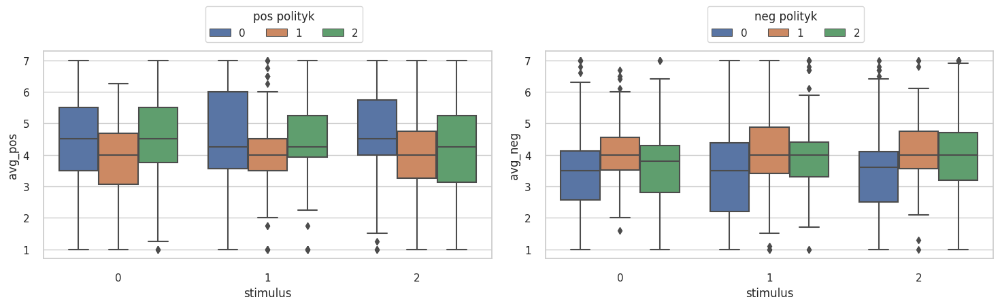

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize = (15, 5))
k = sns.boxplot(data=df, x="stimulus", y="avg_pos", hue=df.polityk.tolist(), ax=axs[0])
k2 = sns.boxplot(data=df, x="stimulus", y="avg_neg", hue=df.polityk.tolist(), ax=axs[1])

sns.move_legend(k, loc = 'upper left', bbox_to_anchor = (0.35, 1.24), ncols = 3, title = "pos polityk")
sns.move_legend(k2, loc = 'upper left', bbox_to_anchor = (0.35, 1.24), ncols = 3, title = "neg polityk")

plt.tight_layout(pad=1.5)
plt.show()

In [ ]:
from dfply import *
# summary statistics for dependent variable height 

df >> group_by( X.polityk, X.stimulus) >> summarize(n=X['avg_neg'].count(), mean=X['avg_neg'].mean(), std=X['avg_neg'].std())

,stimulus,polityk,n,mean,std
0,0,0,104,3.563462,1.531612
1,1,0,106,3.568868,1.599962
2,2,0,109,3.645872,1.434078
3,0,1,114,3.986842,0.967390
4,1,1,106,4.165094,1.332955
5,2,1,103,4.123301,1.125742
6,0,2,105,3.740952,1.281278
7,1,2,100,3.976000,1.246095
8,2,2,111,4.109009,1.327030


In [ ]:
df >> group_by( X.polityk, X.stimulus) >> summarize(n=X['avg_pos'].count(), mean=X['avg_pos'].mean(), std=X['avg_pos'].std())

,stimulus,polityk,n,mean,std
0,0,0,104,4.473558,1.620903
1,1,0,106,4.481132,1.764969
2,2,0,109,4.616972,1.574378
3,0,1,114,3.899123,1.128237
4,1,1,106,3.995283,1.305201
5,2,1,103,3.949029,1.220916
6,0,2,105,4.433333,1.507301
7,1,2,100,4.365000,1.423300
8,2,2,111,4.103604,1.539063


In [512]:
df.sample()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,avg_neg,avg_pos,sum_neg,sum_pos,avg_neg_przed,avg_pos_przed,sum_neg_przed,sum_pos_przed,avg_neg_po,avg_pos_po,sum_neg_po,sum_pos_po,stimulus,polityk,polityk_p4
118,119,387,2,NaN,NaN,6,59,1,3,1,2,1,1.0,7,7,1,7,6,7,1,2,1,6,7,1,7,7,2,7,7,1,7,6,7,1,7,2,7,7,1,7,7,6.0,2.625,120,21,5.7,2.5,57,10,6.3,2.75,63,11,0,1,1_1


In [513]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('avg_pos_po + avg_neg_po ~ stimulus', data = df)
print(fit.mv_test())

                    Multivariate linear model
                                                                 
-----------------------------------------------------------------
       Intercept         Value  Num DF  Den DF   F Value   Pr > F
-----------------------------------------------------------------
          Wilks' lambda  0.0288 2.0000 899.0000 15166.3951 0.0000
         Pillai's trace  0.9712 2.0000 899.0000 15166.3951 0.0000
 Hotelling-Lawley trace 33.7406 2.0000 899.0000 15166.3951 0.0000
    Roy's greatest root 33.7406 2.0000 899.0000 15166.3951 0.0000
-----------------------------------------------------------------
                                                                 
-----------------------------------------------------------------
            stimulus        Value  Num DF  Den DF  F Value Pr > F
-----------------------------------------------------------------
              Wilks' lambda 0.9838 2.0000 899.0000  7.3904 0.0007
             Pillai's trace 0.

In [518]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('avg_pos_po + avg_neg_po ~ p4_r1', data = df)
print(fit.mv_test())

                   Multivariate linear model
                                                                
----------------------------------------------------------------
       Intercept         Value  Num DF  Den DF   F Value  Pr > F
----------------------------------------------------------------
          Wilks' lambda  0.0630 2.0000 899.0000 6687.5717 0.0000
         Pillai's trace  0.9370 2.0000 899.0000 6687.5717 0.0000
 Hotelling-Lawley trace 14.8778 2.0000 899.0000 6687.5717 0.0000
    Roy's greatest root 14.8778 2.0000 899.0000 6687.5717 0.0000
----------------------------------------------------------------
                                                                
----------------------------------------------------------------
           p4_r1          Value  Num DF  Den DF  F Value  Pr > F
----------------------------------------------------------------
            Wilks' lambda 0.5682 2.0000 899.0000 341.6024 0.0000
           Pillai's trace 0.4318 2.0000 899.0

In [521]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('''p9_r1 + p9_r2 + p9_r3 + p9_r4 + p9_r5 + p9_r6 + p9_r7 + p9_r8 + 
                          p9_r9 + p9_r10 + p9_r11 + p9_r12 + p9_r13 + p9_r14 ~ C(p4_r1) + C(polityk) +
               C(p4_r1):C(polityk)''', data = df)
print(fit.mv_test())

                   Multivariate linear model
                                                                
----------------------------------------------------------------
        Intercept        Value   Num DF  Den DF  F Value  Pr > F
----------------------------------------------------------------
           Wilks' lambda 0.1545 14.0000 874.0000 341.5844 0.0000
          Pillai's trace 0.8455 14.0000 874.0000 341.5844 0.0000
  Hotelling-Lawley trace 5.4716 14.0000 874.0000 341.5844 0.0000
     Roy's greatest root 5.4716 14.0000 874.0000 341.5844 0.0000
----------------------------------------------------------------
                                                                
----------------------------------------------------------------
         C(p4_r1)        Value   Num DF   Den DF  F Value Pr > F
----------------------------------------------------------------
           Wilks' lambda 0.6408 56.0000 3401.8463  7.3633 0.0000
          Pillai's trace 0.3737 56.0000 3508.

In [516]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('''avg_pos_po + avg_neg_po ~ C(p4_r1) + C(polityk) +
               C(p4_r1):C(polityk)''', data = df)
print(fit.mv_test())

                   Multivariate linear model
                                                               
---------------------------------------------------------------
       Intercept        Value  Num DF  Den DF   F Value  Pr > F
---------------------------------------------------------------
          Wilks' lambda 0.1617 2.0000 886.0000 2297.0524 0.0000
         Pillai's trace 0.8383 2.0000 886.0000 2297.0524 0.0000
 Hotelling-Lawley trace 5.1852 2.0000 886.0000 2297.0524 0.0000
    Roy's greatest root 5.1852 2.0000 886.0000 2297.0524 0.0000
---------------------------------------------------------------
                                                               
---------------------------------------------------------------
         C(p4_r1)        Value  Num DF   Den DF  F Value Pr > F
---------------------------------------------------------------
           Wilks' lambda 0.7077 8.0000 1772.0000 41.7966 0.0000
          Pillai's trace 0.2925 8.0000 1774.0000 37.9915 0.

In [520]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('''p9_r1 + p9_r2 + p9_r3 + p9_r4 + p9_r5 + p9_r6 + p9_r7 + p9_r8 + 
                          p9_r9 + p9_r10 + p9_r11 + p9_r12 + p9_r13 + p9_r14 ~ C(stimulus) + C(polityk) +
               C(stimulus):C(polityk)''', data = df)
print(fit.mv_test())

                   Multivariate linear model
                                                               
---------------------------------------------------------------
       Intercept        Value   Num DF  Den DF  F Value  Pr > F
---------------------------------------------------------------
          Wilks' lambda 0.0978 14.0000 880.0000 579.9447 0.0000
         Pillai's trace 0.9022 14.0000 880.0000 579.9447 0.0000
 Hotelling-Lawley trace 9.2264 14.0000 880.0000 579.9447 0.0000
    Roy's greatest root 9.2264 14.0000 880.0000 579.9447 0.0000
---------------------------------------------------------------
                                                               
---------------------------------------------------------------
      C(stimulus)       Value   Num DF   Den DF  F Value Pr > F
---------------------------------------------------------------
          Wilks' lambda 0.9611 28.0000 1760.0000  1.2598 0.1646
         Pillai's trace 0.0391 28.0000 1762.0000  1.2546 0.

In [517]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('''avg_pos_po + avg_neg_po ~ C(stimulus) + C(polityk) +
               C(stimulus):C(polityk)''', data = df)
print(fit.mv_test())

                   Multivariate linear model
                                                               
---------------------------------------------------------------
       Intercept        Value  Num DF  Den DF   F Value  Pr > F
---------------------------------------------------------------
          Wilks' lambda 0.1016 2.0000 892.0000 3945.7047 0.0000
         Pillai's trace 0.8984 2.0000 892.0000 3945.7047 0.0000
 Hotelling-Lawley trace 8.8469 2.0000 892.0000 3945.7047 0.0000
    Roy's greatest root 8.8469 2.0000 892.0000 3945.7047 0.0000
---------------------------------------------------------------
                                                               
---------------------------------------------------------------
       C(stimulus)       Value  Num DF   Den DF  F Value Pr > F
---------------------------------------------------------------
           Wilks' lambda 0.9961 4.0000 1784.0000  0.8640 0.4848
          Pillai's trace 0.0039 4.0000 1786.0000  0.8648 0.

In [519]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('''p9_r1 + p9_r2 + p9_r3 + p9_r4 + p9_r5 + p9_r6 + p9_r7 + p9_r8 + 
                          p9_r9 + p9_r10 + p9_r11 + p9_r12 + p9_r13 + p9_r14 ~ p4_r1''', data = df)
print(fit.mv_test())

                    Multivariate linear model
                                                                 
-----------------------------------------------------------------
       Intercept         Value   Num DF  Den DF   F Value  Pr > F
-----------------------------------------------------------------
          Wilks' lambda  0.0595 14.0000 887.0000 1001.4886 0.0000
         Pillai's trace  0.9405 14.0000 887.0000 1001.4886 0.0000
 Hotelling-Lawley trace 15.8070 14.0000 887.0000 1001.4886 0.0000
    Roy's greatest root 15.8070 14.0000 887.0000 1001.4886 0.0000
-----------------------------------------------------------------
                                                                 
-----------------------------------------------------------------
            p4_r1          Value   Num DF  Den DF  F Value Pr > F
-----------------------------------------------------------------
             Wilks' lambda 0.5244 14.0000 887.0000 57.4559 0.0000
            Pillai's trace 0.4

In [515]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('''avg_pos_po + avg_neg_po ~ C(p4_r1) + C(stimulus) +
               C(p4_r1):C(stimulus)''', data = df)
print(fit.mv_test())

                   Multivariate linear model
                                                               
---------------------------------------------------------------
       Intercept        Value  Num DF  Den DF   F Value  Pr > F
---------------------------------------------------------------
          Wilks' lambda 0.1295 2.0000 886.0000 2976.5909 0.0000
         Pillai's trace 0.8705 2.0000 886.0000 2976.5909 0.0000
 Hotelling-Lawley trace 6.7192 2.0000 886.0000 2976.5909 0.0000
    Roy's greatest root 6.7192 2.0000 886.0000 2976.5909 0.0000
---------------------------------------------------------------
                                                               
---------------------------------------------------------------
         C(p4_r1)        Value  Num DF   Den DF  F Value Pr > F
---------------------------------------------------------------
           Wilks' lambda 0.7869 8.0000 1772.0000 28.1986 0.0000
          Pillai's trace 0.2132 8.0000 1774.0000 26.4558 0.

In [522]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('''p9_r1 + p9_r2 + p9_r3 + p9_r4 + p9_r5 + p9_r6 + p9_r7 + p9_r8 + 
                          p9_r9 + p9_r10 + p9_r11 + p9_r12 + p9_r13 + p9_r14 ~ C(p4_r1) + C(polityk) + C(stimulus) +
               C(p4_r1):C(polityk) + C(p4_r1):C(stimulus) + C(polityk):C(stimulus) +
               C(p4_r1):C(polityk):C(stimulus)''', data = df)
print(fit.mv_test())

                        Multivariate linear model
                                                                          
----------------------------------------------------------------------------
          Intercept          Value     Num DF    Den DF    F Value    Pr > F
----------------------------------------------------------------------------
             Wilks' lambda   0.3103   14.0000   844.0000   134.0045   0.0000
            Pillai's trace   0.6897   14.0000   844.0000   134.0045   0.0000
    Hotelling-Lawley trace   2.2228   14.0000   844.0000   134.0045   0.0000
       Roy's greatest root   2.2228   14.0000   844.0000   134.0045   0.0000
--------------------------------------------------------------------------
                                                                          
----------------------------------------------------------------------------
           C(p4_r1)          Value     Num DF     Den DF    F Value   Pr > F
--------------------------------

In [514]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('''avg_pos_po + avg_neg_po ~ C(p4_r1) + C(polityk) + C(stimulus) +
               C(p4_r1):C(polityk) + C(p4_r1):C(stimulus) + C(polityk):C(stimulus) +
               C(p4_r1):C(polityk):C(stimulus)''', data = df)
print(fit.mv_test())

                       Multivariate linear model
                                                                        
--------------------------------------------------------------------------
         Intercept          Value    Num DF    Den DF    F Value    Pr > F
--------------------------------------------------------------------------
            Wilks' lambda   0.3216   2.0000   856.0000   902.9385   0.0000
           Pillai's trace   0.6784   2.0000   856.0000   902.9385   0.0000
   Hotelling-Lawley trace   2.1097   2.0000   856.0000   902.9385   0.0000
      Roy's greatest root   2.1097   2.0000   856.0000   902.9385   0.0000
------------------------------------------------------------------------
                                                                        
--------------------------------------------------------------------------
          C(p4_r1)          Value    Num DF     Den DF    F Value   Pr > F
---------------------------------------------------------

In [511]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('''p9_r1 + p9_r2 + p9_r3 + p9_r4 + p9_r5 + p9_r6 + p9_r7 + p9_r8 + 
                          p9_r9 + p9_r10 + p9_r11 + p9_r12 + p9_r13 + p9_r14 ~ stimulus''', data = df)
print(fit.mv_test())

                    Multivariate linear model
                                                                 
-----------------------------------------------------------------
       Intercept         Value   Num DF  Den DF   F Value  Pr > F
-----------------------------------------------------------------
          Wilks' lambda  0.0275 14.0000 887.0000 2243.6167 0.0000
         Pillai's trace  0.9725 14.0000 887.0000 2243.6167 0.0000
 Hotelling-Lawley trace 35.4122 14.0000 887.0000 2243.6167 0.0000
    Roy's greatest root 35.4122 14.0000 887.0000 2243.6167 0.0000
-----------------------------------------------------------------
                                                                 
-----------------------------------------------------------------
           stimulus        Value   Num DF  Den DF  F Value Pr > F
-----------------------------------------------------------------
             Wilks' lambda 0.9408 14.0000 887.0000  3.9850 0.0000
            Pillai's trace 0.0

## kruskal

In [416]:
df.p4_r1 = df.p4_r1.fillna(3)

In [420]:
from scipy.stats import kruskal
# KruskalResult(statistic=0.2727272727272734, pvalue=0.6015081344405895)
# kruskal(x, y)

In [418]:
df['stimulus'].value_counts()

2    323
0    323
1    312
Name: stimulus, dtype: int64

In [419]:
# kb - 1;  rb  - 2;  rt  - 0
df['polityk'].value_counts()

1    323
0    319
2    316
Name: polityk, dtype: int64

In [423]:
k, p = kruskal(df[df.stimulus == 0].avg_neg.values, df[df.stimulus == 1].avg_neg.values, df[df.stimulus == 2].avg_neg.values)
round(k, 5), round(p, 5)

(12.5782, 0.00186)

In [424]:
k, p = kruskal(df[df.stimulus == 0].avg_pos.values, df[df.stimulus == 1].avg_pos.values, df[df.stimulus == 2].avg_pos.values)
round(k, 5), round(p, 5)

(6.64199, 0.03612)

In [425]:
k, p = kruskal(df[df.polityk == 0].avg_neg.values, df[df.polityk == 1].avg_neg.values, df[df.polityk == 2].avg_neg.values)
round(k, 5), round(p, 5)

(37.29053, 0.0)

In [426]:
k, p = kruskal(df[df.polityk == 0].avg_pos.values, df[df.polityk == 1].avg_pos.values, df[df.polityk == 2].avg_pos.values)
round(k, 5), round(p, 5)

(40.85436, 0.0)

In [427]:
k, p = kruskal(df[df.p4_r1 == 5].avg_pos.values, df[df.p4_r1 == 1].avg_pos.values, df[df.p4_r1 == 2].avg_pos.values, 
               df[df.p4_r1 == 3].avg_pos.values, df[df.p4_r1 == 4].avg_pos.values)
round(k, 5), round(p, 5)

(490.90879, 0.0)

In [428]:
k, p = kruskal(df[df.p4_r1 == 5].avg_neg.values, df[df.p4_r1 == 1].avg_neg.values, df[df.p4_r1 == 2].avg_neg.values, 
               df[df.p4_r1 == 3].avg_neg.values, df[df.p4_r1 == 4].avg_neg.values)
round(k, 5), round(p, 5)

(386.36724, 0.0)

In [ ]:
!pip install scikit-posthocs


In [468]:
import scikit_posthocs as sp
# scikit_posthocs.posthoc_dunn(a, val_col: str = None, group_col: str = None, p_adjust: str = None, sort: bool = True)

In [478]:
p4_r1_pos = sp.posthoc_dunn(df, val_col='avg_pos', group_col='polityk', p_adjust = 'holm').round(8)
p4_r1_pos

,0,1,2
0,1.00000,0.00000,0.01465
1,0.00000,1.00000,0.00017
2,0.01465,0.00017,1.00000


In [484]:
df.groupby('polityk').avg_pos.mean().round(3)

polityk
0    4.597
1    3.919
2    4.303
Name: avg_pos, dtype: float64

In [479]:
p4_r1_neg = sp.posthoc_dunn(df, val_col='avg_neg', group_col='polityk', p_adjust = 'holm').round(8)
p4_r1_neg

,0,1,2
0,1.000000,0.000000,0.000045
1,0.000000,1.000000,0.060899
2,0.000045,0.060899,1.000000


In [485]:
df.groupby('polityk').avg_neg.mean().round(3)

polityk
0    3.506
1    4.103
2    3.939
Name: avg_neg, dtype: float64

In [480]:
p4_r1_pos = sp.posthoc_dunn(df, val_col='avg_pos', group_col='stimulus', p_adjust = 'holm').round(8)
p4_r1_pos

,0,1,2
0,1.000000,0.567298,0.091883
1,0.567298,1.000000,0.032568
2,0.091883,0.032568,1.000000


In [486]:
df.groupby('stimulus').avg_pos.mean().round(3)

stimulus
0    4.332
1    4.395
2    4.098
Name: avg_pos, dtype: float64

In [481]:
p4_r1_neg = sp.posthoc_dunn(df, val_col='avg_neg', group_col='stimulus', p_adjust = 'holm').round(8)
p4_r1_neg

,0,1,2
0,1.000000,0.703634,0.005316
1,0.703634,1.000000,0.013450
2,0.005316,0.013450,1.000000


In [487]:
df.groupby('stimulus').avg_neg.mean().round(3)

stimulus
0    3.722
1    3.775
2    4.047
Name: avg_neg, dtype: float64

In [482]:
p4_r1_pos = sp.posthoc_dunn(df, val_col='avg_pos', group_col='p4_r1', p_adjust = 'holm').round(8)
p4_r1_pos

,1.0,2.0,3.0,4.0,5.0
1.0,1.0,0.000000,0.000000,0.000000,0.000000
2.0,0.0,1.000000,0.005181,0.000000,0.000000
3.0,0.0,0.005181,1.000000,0.000000,0.000000
4.0,0.0,0.000000,0.000000,1.000000,0.003903
5.0,0.0,0.000000,0.000000,0.003903,1.000000


In [489]:
df.groupby('p4_r1').avg_pos.mean().round(3)

p4_r1
1.0    2.697
2.0    3.990
3.0    4.345
4.0    5.308
5.0    6.071
Name: avg_pos, dtype: float64

In [483]:
p4_r1_neg = sp.posthoc_dunn(df, val_col='avg_neg', group_col='p4_r1', p_adjust = 'holm').round(8)
p4_r1_neg

,1.0,2.0,3.0,4.0,5.0
1.0,1.0,0.000000,0.000000,0.000000,0.000000
2.0,0.0,1.000000,0.024195,0.000000,0.000000
3.0,0.0,0.024195,1.000000,0.000000,0.000000
4.0,0.0,0.000000,0.000000,1.000000,0.002356
5.0,0.0,0.000000,0.000000,0.002356,1.000000


In [488]:
df.groupby('p4_r1').avg_neg.mean().round(3)

p4_r1
1.0    5.197
2.0    4.070
3.0    3.781
4.0    3.007
5.0    2.284
Name: avg_neg, dtype: float64

In [494]:
for d in dyfer:
  print(d)
  k, p = kruskal(df[df.stimulus == 5][d].values, df[df.stimulus == 1][d].values, df[df.stimulus == 2][d].values, 
                df[df.stimulus == 3][d].values, df[df.stimulus == 4][d].values)
  print(f'stat: {round(k, 5)}  p value: {round(p, 5)} ')
  print(sp.posthoc_dunn(df, val_col = d, group_col='stimulus', p_adjust = 'holm').round(6))
  print(df.groupby('stimulus')[d].mean().round(3))
  print('\n ********************************* \n')


p5_r1
stat: nan  p value: nan 
          0         1         2
0  1.000000  0.403164  0.134991
1  0.403164  1.000000  0.482408
2  0.134991  0.482408  1.000000
stimulus
0    3.566
1    3.787
2    3.889
Name: p5_r1, dtype: float64

 ********************************* 

p5_r2
stat: nan  p value: nan 
          0         1         2
0  1.000000  0.063534  0.606533
1  0.063534  1.000000  0.143412
2  0.606533  0.143412  1.000000
stimulus
0    3.378
1    3.753
2    3.459
Name: p5_r2, dtype: float64

 ********************************* 

p5_r3
stat: nan  p value: nan 
     0    1    2
0  1.0  1.0  1.0
1  1.0  1.0  1.0
2  1.0  1.0  1.0
stimulus
0    4.102
1    4.134
2    4.117
Name: p5_r3, dtype: float64

 ********************************* 

p5_r4
stat: nan  p value: nan 
          0         1         2
0  1.000000  0.761662  0.375285
1  0.761662  1.000000  0.450428
2  0.375285  0.450428  1.000000
stimulus
0    3.918
1    3.969
2    4.153
Name: p5_r4, dtype: float64

 ****************************

In [493]:
for d in dyfer:
  print(d)
  k, p = kruskal(df[df.polityk == 5][d].values, df[df.polityk == 1][d].values, df[df.polityk == 2][d].values, 
                df[df.polityk == 3][d].values, df[df.polityk == 4][d].values)
  print(f'stat: {round(k, 5)}  p value: {round(p, 5)} ')
  print(sp.posthoc_dunn(df, val_col = d, group_col='polityk', p_adjust = 'holm').round(6))
  print(df.groupby('polityk')[d].mean().round(3))
  print('\n ********************************* \n')


p5_r1
stat: nan  p value: nan 
          0         1         2
0  1.000000  0.000000  0.000608
1  0.000000  1.000000  0.024954
2  0.000608  0.024954  1.000000
polityk
0    3.310
1    4.116
2    3.814
Name: p5_r1, dtype: float64

 ********************************* 

p5_r2
stat: nan  p value: nan 
          0    1         2
0  1.000000  0.0  0.172648
1  0.000000  1.0  0.000000
2  0.172648  0.0  1.000000
polityk
0    2.937
1    4.508
2    3.133
Name: p5_r2, dtype: float64

 ********************************* 

p5_r3
stat: nan  p value: nan 
          0         1         2
0  1.000000  0.000007  0.318082
1  0.000007  1.000000  0.000409
2  0.318082  0.000409  1.000000
polityk
0    4.383
1    3.728
2    4.243
Name: p5_r3, dtype: float64

 ********************************* 

p5_r4
stat: nan  p value: nan 
          0        1         2
0  1.000000  0.00000  0.012681
1  0.000000  1.00000  0.001360
2  0.012681  0.00136  1.000000
polityk
0    3.583
1    4.485
2    3.973
Name: p5_r4, dtype: float6

In [492]:
for d in dyfer:
  print(d)
  k, p = kruskal(df[df.p4_r1 == 5][d].values, df[df.p4_r1 == 1][d].values, df[df.p4_r1 == 2][d].values, 
                df[df.p4_r1 == 3][d].values, df[df.p4_r1 == 4][d].values)
  print(f'stat: {round(k, 5)}  p value: {round(p, 5)} ')
  print(sp.posthoc_dunn(df, val_col = d, group_col='p4_r1', p_adjust = 'holm').round(6))
  print(df.groupby('p4_r1')[d].mean().round(3))
  print('\n ********************************* \n')

p5_r1
stat: 263.67841  p value: 0.0 
     1.0       2.0       3.0       4.0       5.0
1.0  1.0  0.000000  0.000000  0.000000  0.000000
2.0  0.0  1.000000  0.091492  0.000000  0.000000
3.0  0.0  0.091492  1.000000  0.000000  0.000000
4.0  0.0  0.000000  0.000000  1.000000  0.050847
5.0  0.0  0.000000  0.000000  0.050847  1.000000
p4_r1
1.0    5.218
2.0    3.986
3.0    3.665
4.0    2.730
5.0    2.247
Name: p5_r1, dtype: float64

 ********************************* 

p5_r2
stat: 228.40189  p value: 0.0 
          1.0       2.0       3.0       4.0       5.0
1.0  1.000000  0.000077  0.000000  0.000000  0.000000
2.0  0.000077  1.000000  0.318772  0.000000  0.000000
3.0  0.000000  0.318772  1.000000  0.000000  0.000000
4.0  0.000000  0.000000  0.000000  1.000000  0.050775
5.0  0.000000  0.000000  0.000000  0.050775  1.000000
p4_r1
1.0    4.929
2.0    3.784
3.0    3.562
4.0    2.410
5.0    1.989
Name: p5_r2, dtype: float64

 ********************************* 

p5_r3
stat: 457.38859  p value: 0.

In [421]:
df.sample()

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,avg_neg,avg_pos,sum_neg,sum_pos,avg_neg_przed,avg_pos_przed,sum_neg_przed,sum_pos_przed,avg_neg_po,avg_pos_po,sum_neg_po,sum_pos_po,stimulus,polityk
434,435,544,2,NaN,NaN,6,60,1,4,1,2,1,1.0,3,5,3,6,4,5,3,3,2,3,6,1,2,5,1,2,5,3,5,3,5,4,3,3,3,6,1,2,6,3.6,3.75,72,30,3.7,3.5,37,14,3.5,4.0,35,16,0,1


In [429]:
df.columns[-15:]

Index(['p9_r14', 'avg_neg', 'avg_pos', 'sum_neg', 'sum_pos', 'avg_neg_przed',
       'avg_pos_przed', 'sum_neg_przed', 'sum_pos_przed', 'avg_neg_po',
       'avg_pos_po', 'sum_neg_po', 'sum_pos_po', 'stimulus', 'polityk'],
      dtype='object')

##p

In [ ]:
df.sample(2)

,ID,survey_finish_time,sex,sex_r3_input,sex2,age,year,miasta,wyksztalcenie,narodowosc,grupa,p3,p4_r1,p5_r1,p5_r2,p5_r3,p5_r4,p5_r5,p5_r6,p5_r7,p5_r8,p5_r9,p5_r10,p5_r11,p5_r12,p5_r13,p5_r14,p7,p9_r1,p9_r2,p9_r3,p9_r4,p9_r5,p9_r6,p9_r7,p9_r8,p9_r9,p9_r10,p9_r11,p9_r12,p9_r13,p9_r14,diff_r1,diff_r2,diff_r3,diff_r4,diff_r5,diff_r6,diff_r7,diff_r8,diff_r9,diffr10,diffr11,diffr12,diffr13,diffr14,stimulus,polityk,avg_neg,avg_pos,sum_neg,sum_pos,avg_neg_przed,avg_pos_przed,sum_neg_przed,sum_pos_przed,avg_neg_po,avg_pos_po,sum_neg_po,sum_pos_po
109,110,1134,1,NaN,NaN,4,37,1,2,1,1,1,3.0,7,4,1,7,6,6,2,4,3,7,2,4,6,5,2,7,4,1,7,6,6,2,4,3,7,2,4,6,5,7,4,1,7,6,6,2,4,3,7,2,4,6,5,2,1,5.6,2.0,112,16,5.6,2.0,56,8,5.6,2.0,56,8
757,758,443,1,NaN,NaN,3,34,1,4,1,8,1,1.0,6,4,2,7,7,7,1,6,1,6,6,6,6,6,1,6,4,2,7,7,7,1,6,1,6,6,6,6,6,6,4,2,7,7,7,1,6,1,6,6,6,6,6,0,0,6.1,2.5,122,20,6.1,2.5,61,10,6.1,2.5,61,10


In [ ]:
df.to_excel('/content/Zbiór_AMU_Barbara_Konat_v2_processed.xlsx')